<a href="https://colab.research.google.com/github/samarranjit/Yield_Prediction/blob/main/Deep_Learning_Techniques/Attention_based_2D_CNN_LSTM_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Attention Based CNN LSTM Model


### “TimeDistributed CNN encoder on each timestep” → “(Attention-)LSTM over encoded sequence” + parallel CNN head

### Importing the libraries and datasets

In [1]:
import os, math, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr
import seaborn as sns

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
if device.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))
    torch.backends.cudnn.benchmark = True

plt.rcParams["figure.dpi"] = 120


Device: cuda
GPU: Quadro RTX 8000


In [2]:
LOG_TARGET = True

In [3]:
# corn_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/Recalculated/2corn_monthly_timeseries_imputed_recalculated.parquet"
# wheat_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/Recalculated/2wheat_monthly_timeseries_imputed_recalculated.parquet"
# soy_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/Recalculated/2soybeans_monthly_timeseries_imputed_recalculated.parquet"
corn_fn = r"/home/cholab/LabMembers/Samar/Yield_Prediction/data/monthlyTimeseriesData/2corn_monthly_timeseries_imputed_recalculated.parquet"
wheat_fn = r"/home/cholab/LabMembers/Samar/Yield_Prediction/data/monthlyTimeseriesData/2wheat_monthly_timeseries_imputed_recalculated.parquet"
soy_fn = r"/home/cholab/LabMembers/Samar/Yield_Prediction/data/monthlyTimeseriesData/2soybeans_monthly_timeseries_imputed_recalculated.parquet"
CROP = "soy"   # "soy" | "corn" | "wheat"

fn_map = {"soy": soy_fn, "corn": corn_fn, "wheat": wheat_fn}
data_path = fn_map[CROP]

df = pd.read_parquet(data_path)
print("Loaded:", data_path)
print("Shape:", df.shape)
df.head()


Loaded: /home/cholab/LabMembers/Samar/Yield_Prediction/data/monthlyTimeseriesData/2soybeans_monthly_timeseries_imputed_recalculated.parquet
Shape: (241080, 69)


,field,year,row,col,yield_mean,yield_std,yield_count,lon,lat,grid_crs,...,GI,NDWI,Tr_SWIR1,Tr_SWIR2,LST_K,PPT_mm,PPT_obsCount,HLS_obsCount,LST_obsCount,window
0,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,2.811321,-0.049308,0.764619,1.647770,298.015411,47.394001,30.0,11.0,2.0,None
1,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,4.803632,0.259259,1.349838,3.625084,303.579956,153.701004,31.0,13.0,2.0,None
2,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,3.167556,-0.015197,0.777377,1.803697,304.977921,67.210999,30.0,12.0,2.0,None
3,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,3.740914,0.031624,0.864254,2.350744,306.375885,113.481995,31.0,11.0,2.0,None
4,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,4.297053,0.107294,0.969293,2.538330,308.248962,94.362000,31.0,13.0,2.0,None


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241080 entries, 0 to 241079
Data columns (total 69 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   field            241080 non-null  object 
 1   year             241080 non-null  int64  
 2   row              241080 non-null  int64  
 3   col              241080 non-null  int64  
 4   yield_mean       241080 non-null  float64
 5   yield_std        234720 non-null  float64
 6   yield_count      241080 non-null  int64  
 7   lon              241080 non-null  float64
 8   lat              241080 non-null  float64
 9   grid_crs         241080 non-null  object 
 10  template_raster  241080 non-null  object 
 11  yield_meter_crs  241080 non-null  object 
 12  LST_median       241080 non-null  float64
 13  LST_max          241080 non-null  float64
 14  LST_range        241080 non-null  float64
 15  NDVI_mean        241080 non-null  float64
 16  EVI_mean         241080 non-null  floa

In [5]:
df.rename(columns={"x_utm": "x_m", "y_utm": "y_m"}, inplace=True)
df.head()

,field,year,row,col,yield_mean,yield_std,yield_count,lon,lat,grid_crs,...,GI,NDWI,Tr_SWIR1,Tr_SWIR2,LST_K,PPT_mm,PPT_obsCount,HLS_obsCount,LST_obsCount,window
0,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,2.811321,-0.049308,0.764619,1.647770,298.015411,47.394001,30.0,11.0,2.0,None
1,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,4.803632,0.259259,1.349838,3.625084,303.579956,153.701004,31.0,13.0,2.0,None
2,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,3.167556,-0.015197,0.777377,1.803697,304.977921,67.210999,30.0,12.0,2.0,None
3,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,3.740914,0.031624,0.864254,2.350744,306.375885,113.481995,31.0,11.0,2.0,None
4,South Farm_SA-5,2019,126,30,22.214909,NaN,1,-76.953236,39.011901,EPSG:4326,...,4.297053,0.107294,0.969293,2.538330,308.248962,94.362000,31.0,13.0,2.0,None


In [ ]:
# Count NAN values in all the columns
for key in df.keys():
  print(key)
  print(df[key].isna().sum())
  print("==============")

field
0
year
0
row
0
col
0
yield_mean
0
yield_std
6360
yield_count
0
lon
0
lat
0
grid_crs
0
template_raster
0
yield_meter_crs
0
LST_median
0
LST_max
0
LST_range
0
NDVI_mean
0
EVI_mean
0
GI_mean
0
NDWI_mean
0
Tr_SWIR1_mean
0
Tr_SWIR2_mean
0
NDVI_max
0
EVI_max
0
GI_max
0
NDWI_max
0
Tr_SWIR1_max
0
Tr_SWIR2_max
0
NDVI_range
0
EVI_range
0
GI_range
0
NDWI_range
0
Tr_SWIR1_range
0
Tr_SWIR2_range
0
NDVI_obsCount
0
ppt_mean
0
ppt_max
0
ppt_range
0
ppt_total
0
Soil_Sand
0
Soil_Silt
0
Soil_Clay
0
Soil_BD
0
Soil_pH
0
Soil_OM
0
Soil_Theta_S
0
Soil_Theta_R
0
Soil_Ksat
0
Soil_Lambda
0
Soil_Alpha
0
Soil_N
0
x_m
0
y_m
0
elevation
0
slope
0
aspect
0
month
0
month_index
0
NDVI
0
EVI
0
GI
0
NDWI
0
Tr_SWIR1
0
Tr_SWIR2
0
LST_K
0
PPT_mm
0
PPT_obsCount
0
HLS_obsCount
0
LST_obsCount
0
window
210945


In [ ]:
df.keys()

Index(['field', 'year', 'row', 'col', 'yield_mean', 'yield_std', 'yield_count',
       'lon', 'lat', 'grid_crs', 'template_raster', 'yield_meter_crs',
       'LST_median', 'LST_max', 'LST_range', 'NDVI_mean', 'EVI_mean',
       'GI_mean', 'NDWI_mean', 'Tr_SWIR1_mean', 'Tr_SWIR2_mean', 'NDVI_max',
       'EVI_max', 'GI_max', 'NDWI_max', 'Tr_SWIR1_max', 'Tr_SWIR2_max',
       'NDVI_range', 'EVI_range', 'GI_range', 'NDWI_range', 'Tr_SWIR1_range',
       'Tr_SWIR2_range', 'NDVI_obsCount', 'ppt_mean', 'ppt_max', 'ppt_range',
       'ppt_total', 'Soil_Sand', 'Soil_Silt', 'Soil_Clay', 'Soil_BD',
       'Soil_pH', 'Soil_OM', 'Soil_Theta_S', 'Soil_Theta_R', 'Soil_Ksat',
       'Soil_Lambda', 'Soil_Alpha', 'Soil_N', 'x_m', 'y_m', 'elevation',
       'slope', 'aspect', 'month', 'month_index', 'NDVI', 'EVI', 'GI', 'NDWI',
       'Tr_SWIR1', 'Tr_SWIR2', 'LST_K', 'PPT_mm', 'PPT_obsCount',
       'HLS_obsCount', 'LST_obsCount', 'window'],
      dtype='object')

### Visualizing the spread of the input variables


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
field
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


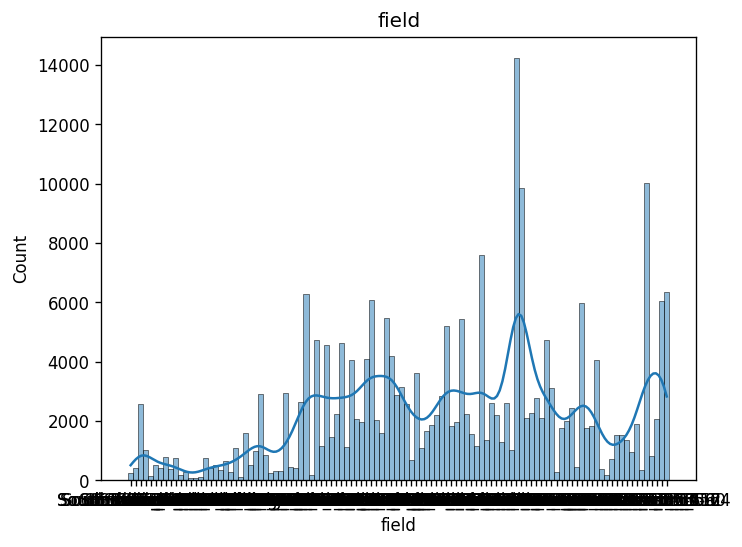

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
year
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


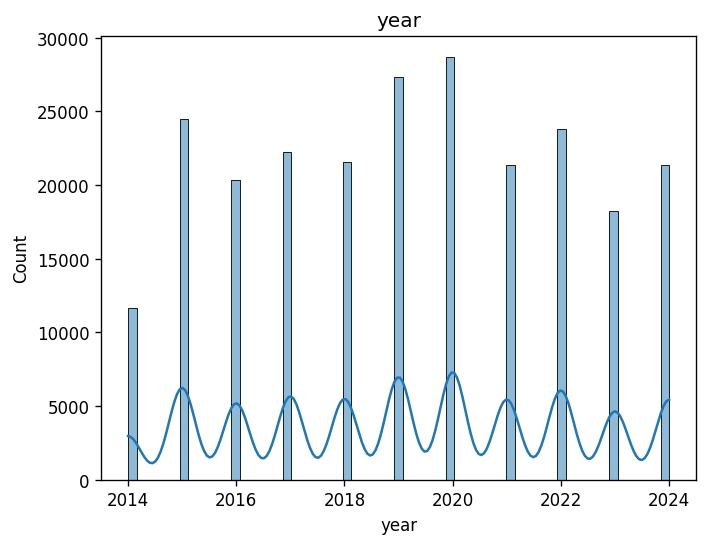

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
row
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


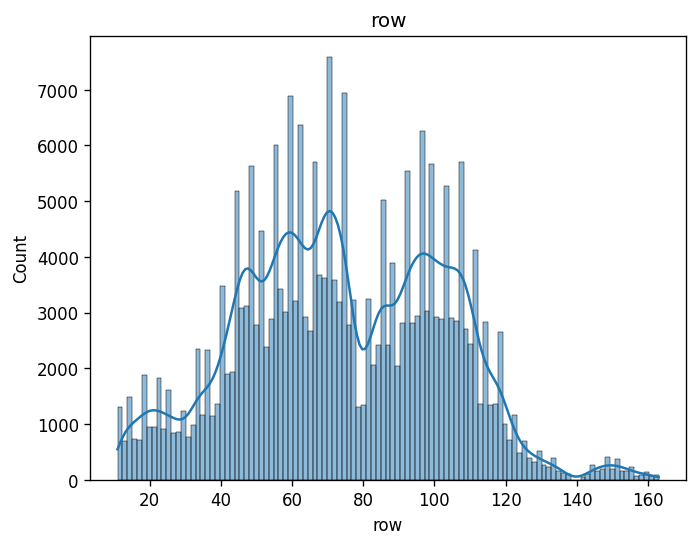

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
col
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


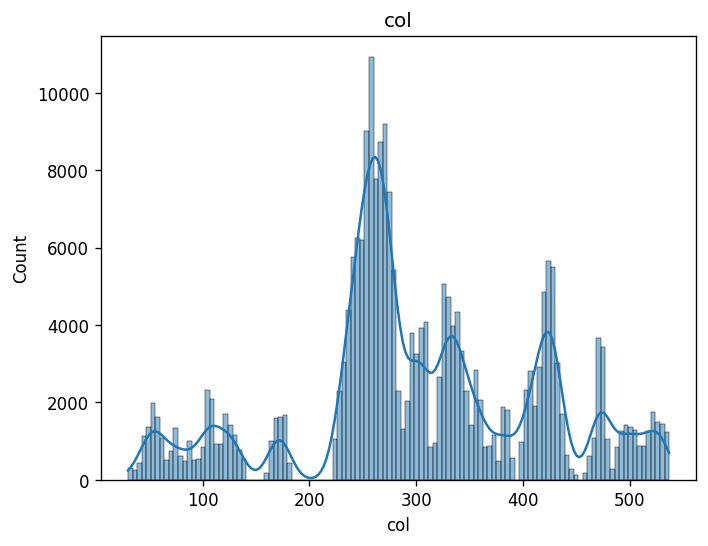

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
yield_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


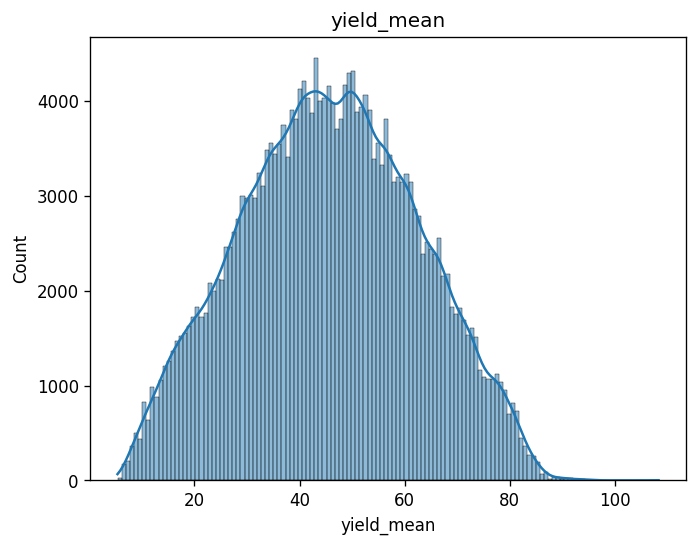

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
yield_std
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


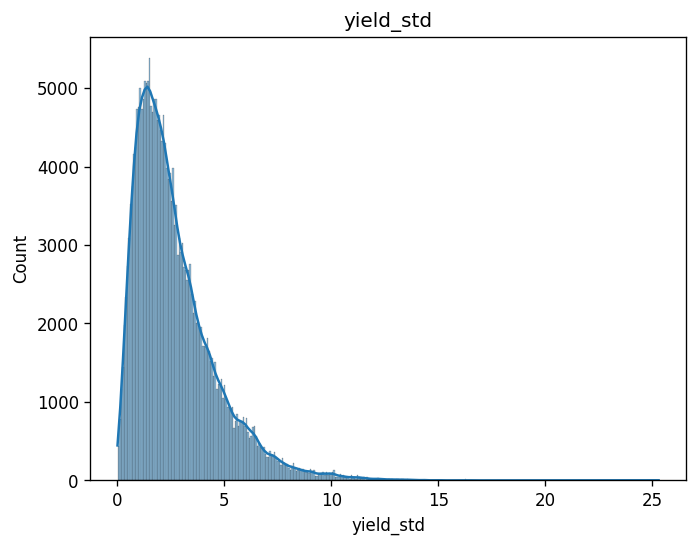

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
yield_count
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


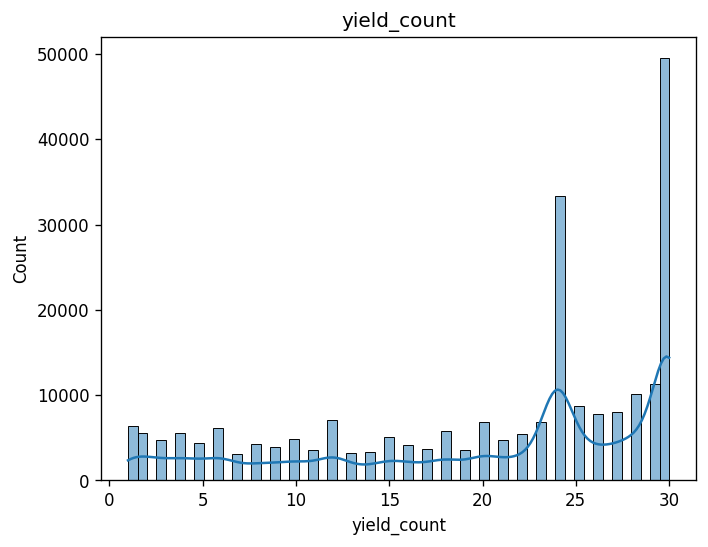

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
lon
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


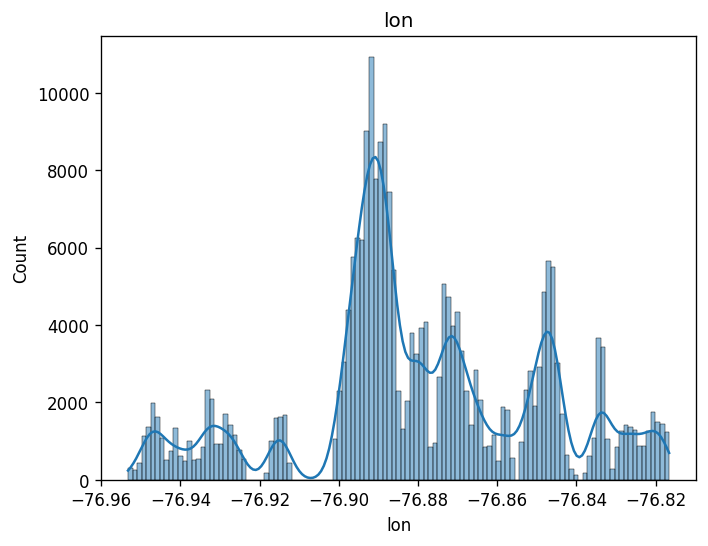

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
lat
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


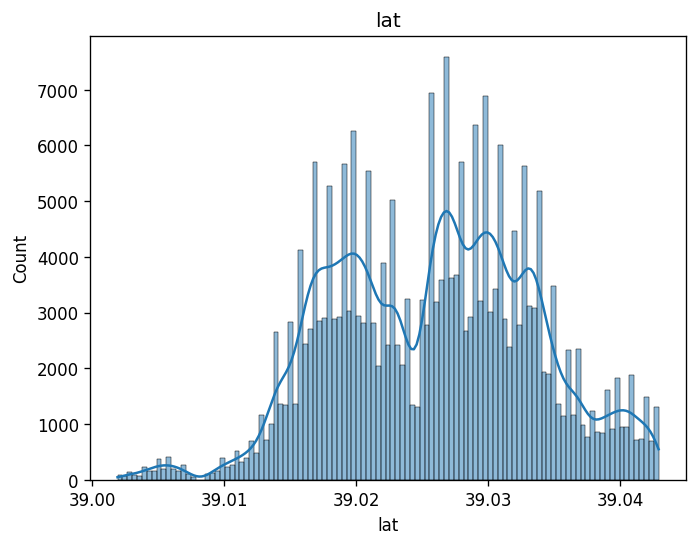

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
grid_crs
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


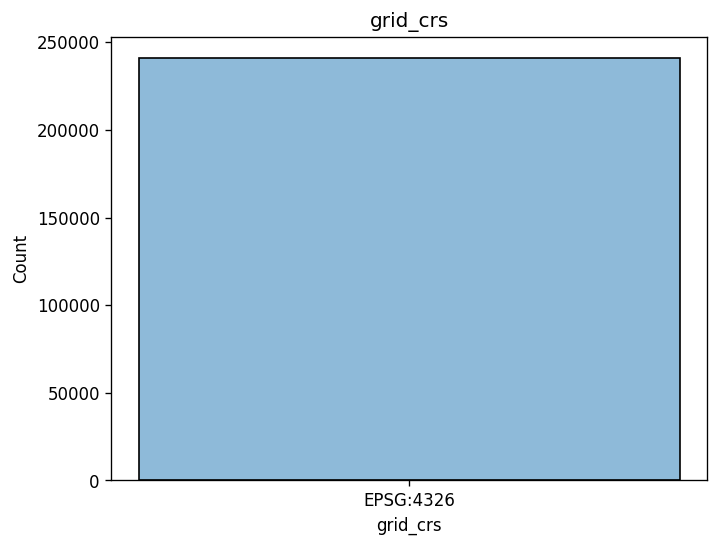

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
template_raster
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


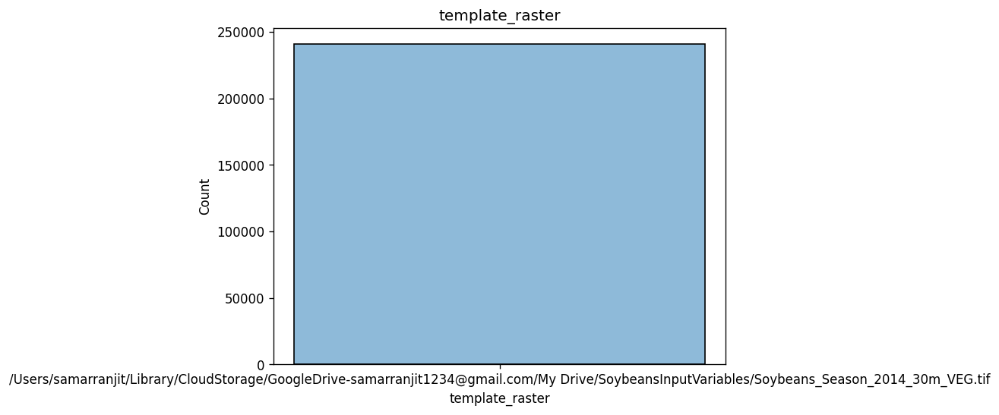

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
yield_meter_crs
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


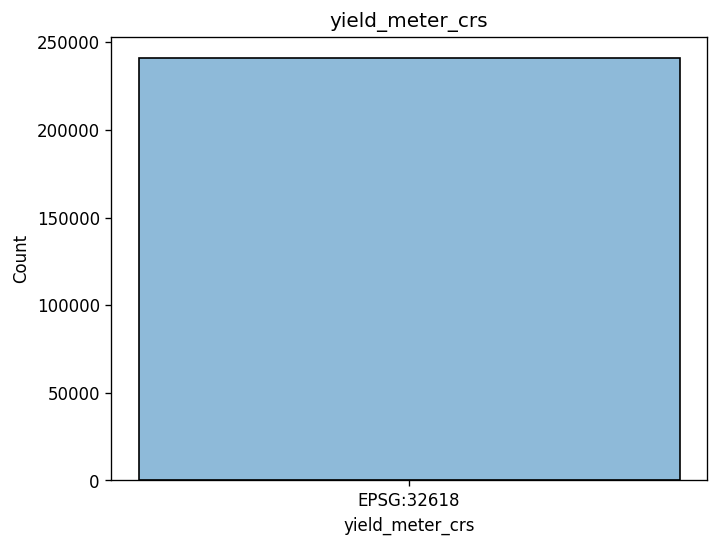

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
LST_median
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


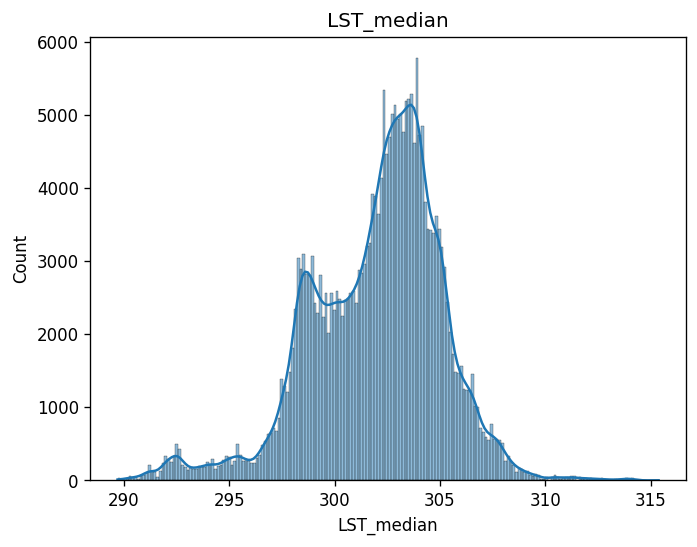

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
LST_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


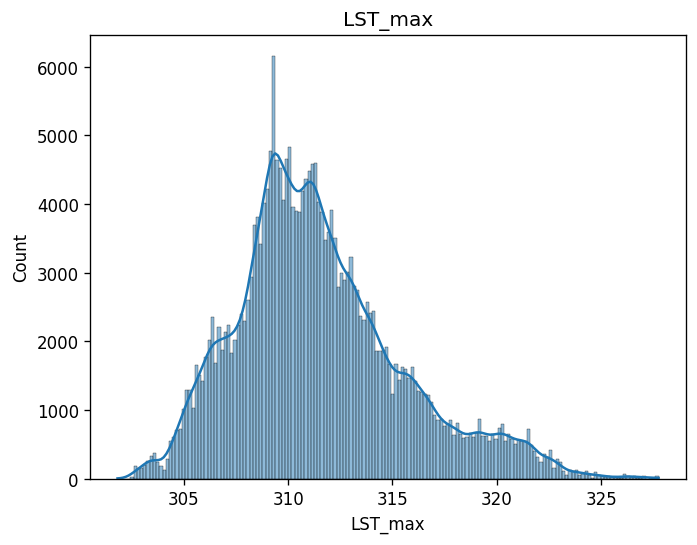

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
LST_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


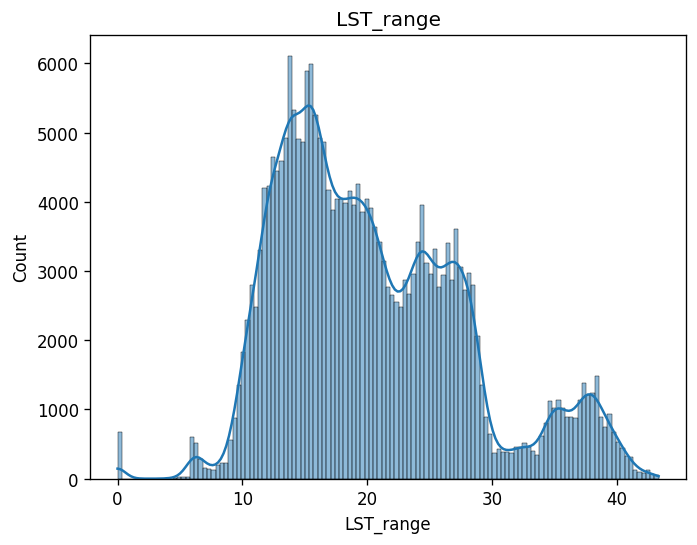

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDVI_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


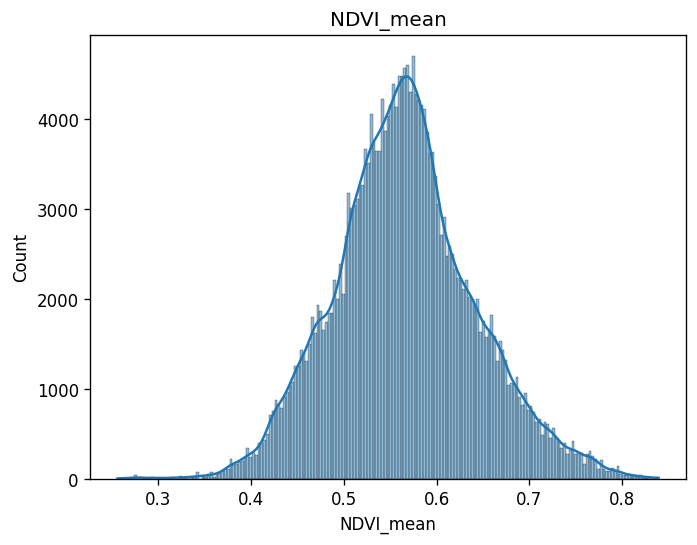

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
EVI_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


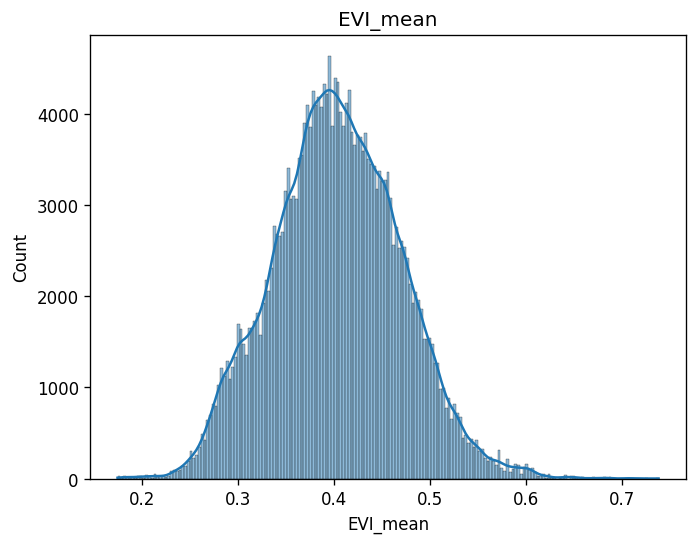

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
GI_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


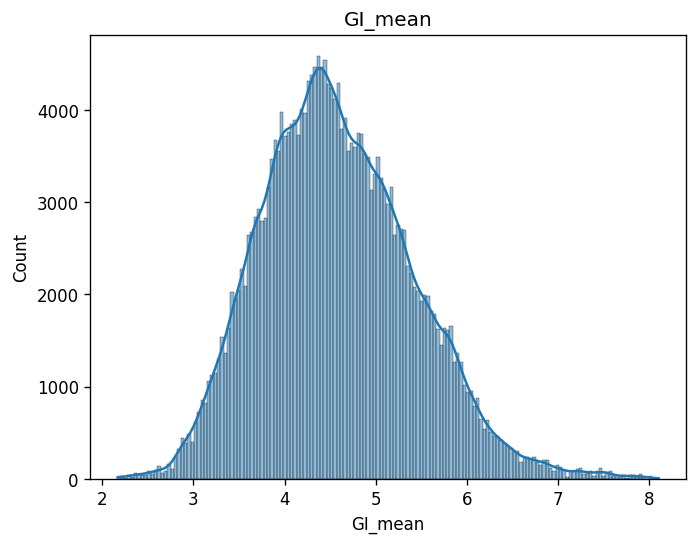

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDWI_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


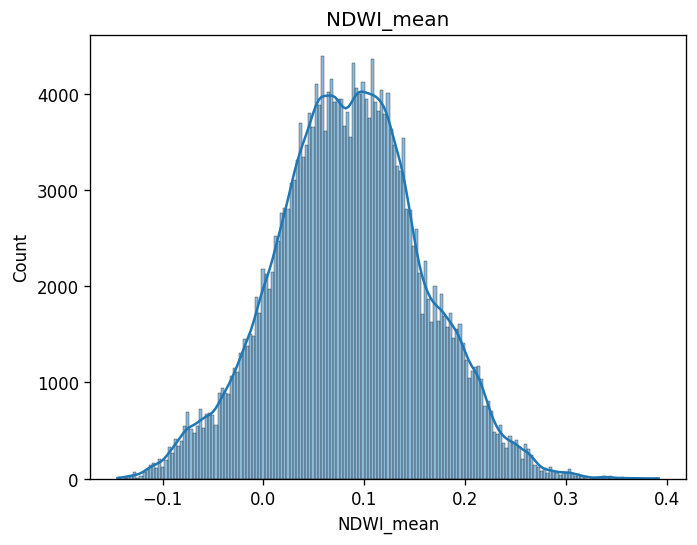

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR1_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


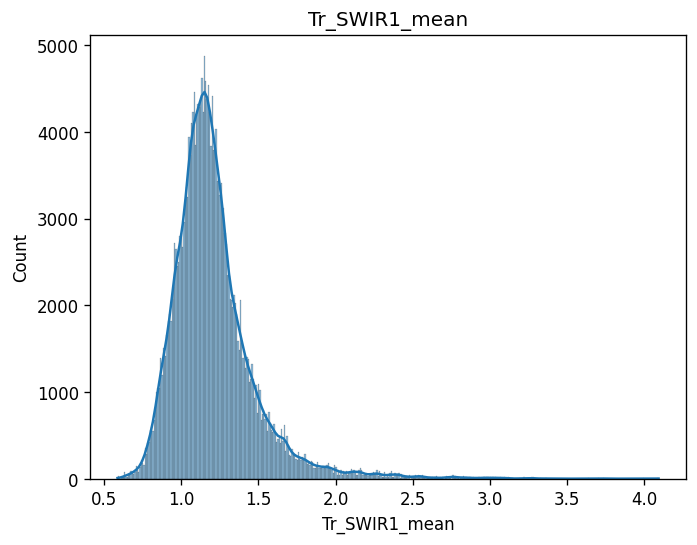

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR2_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


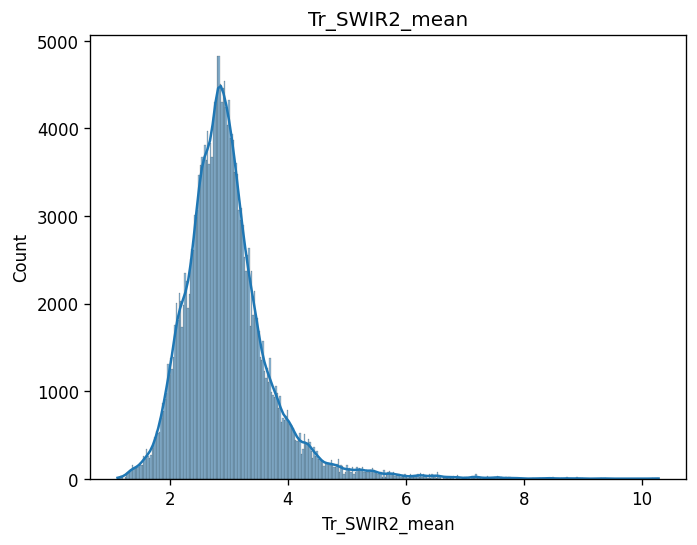

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDVI_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


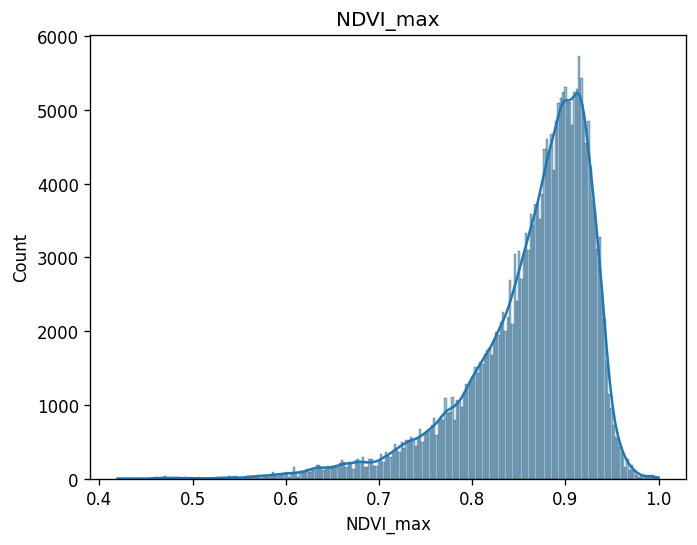

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
EVI_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


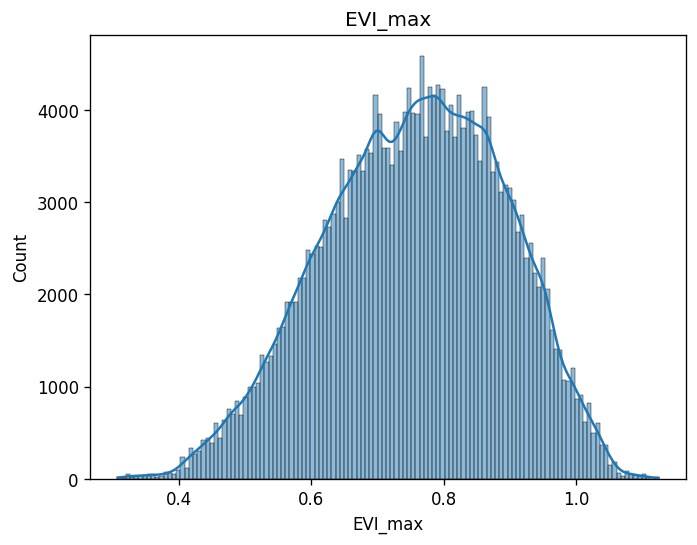

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
GI_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


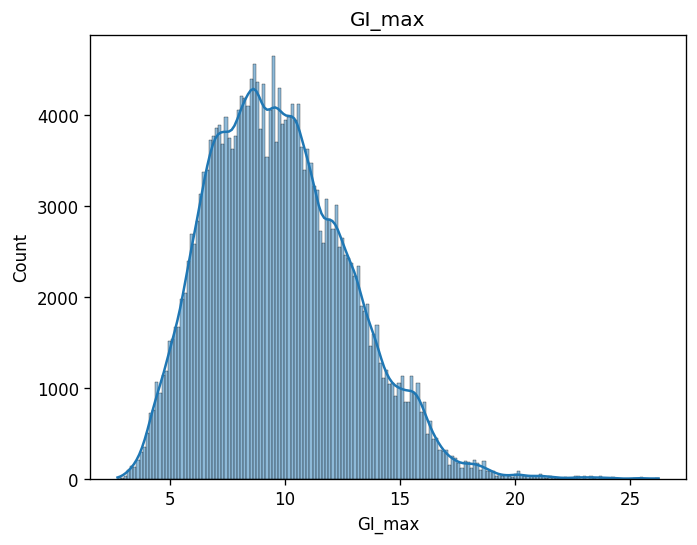

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDWI_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


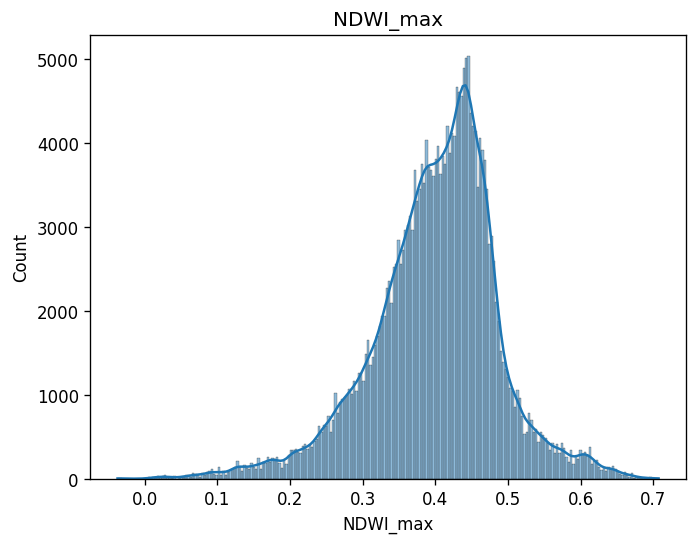

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR1_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


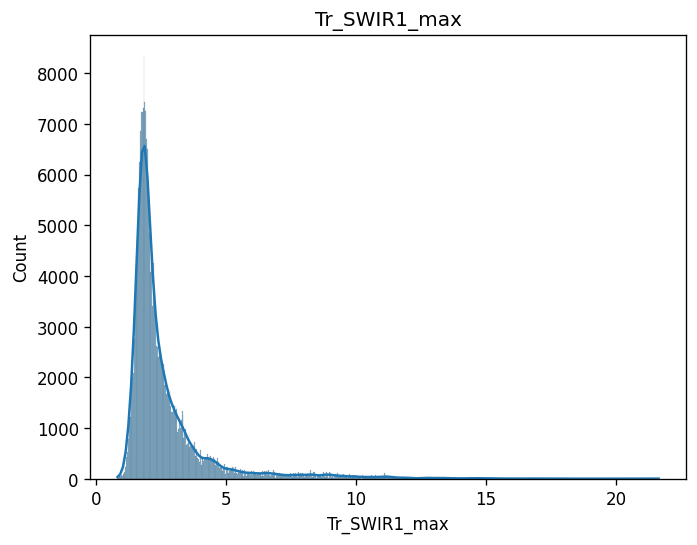

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR2_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


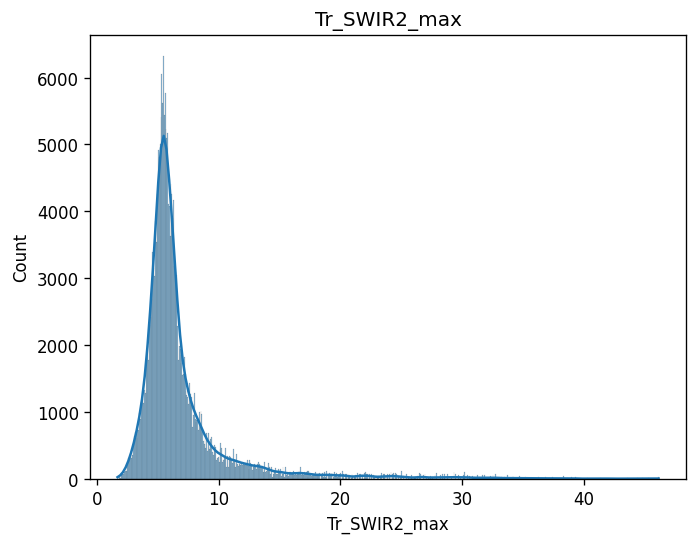

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDVI_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


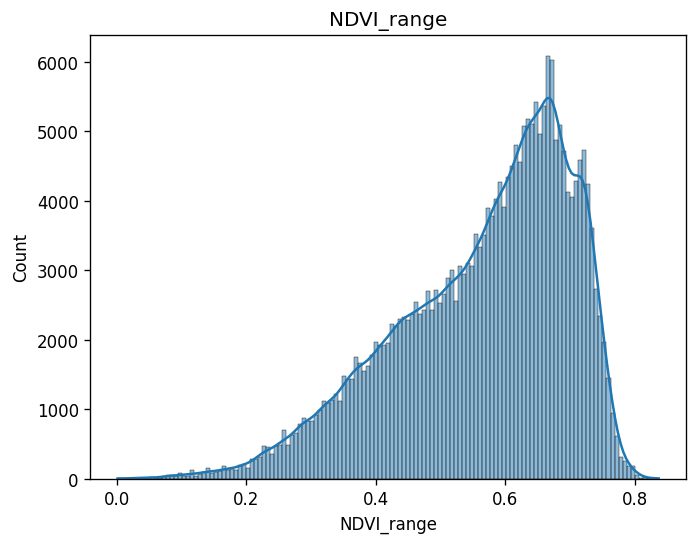

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
EVI_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


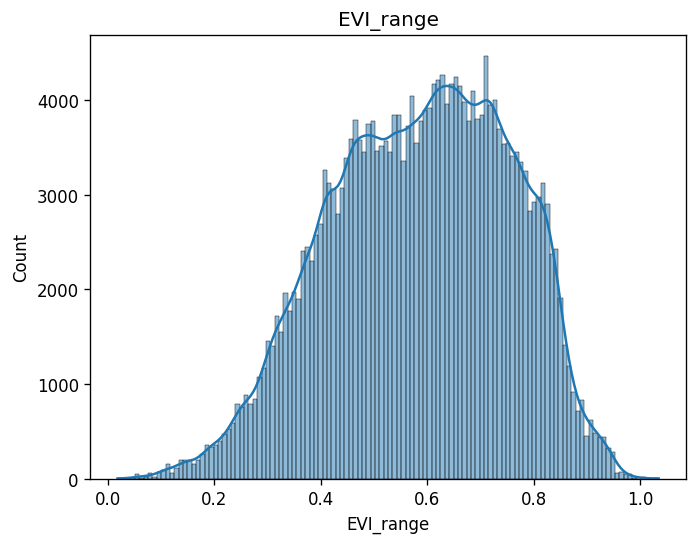

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
GI_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


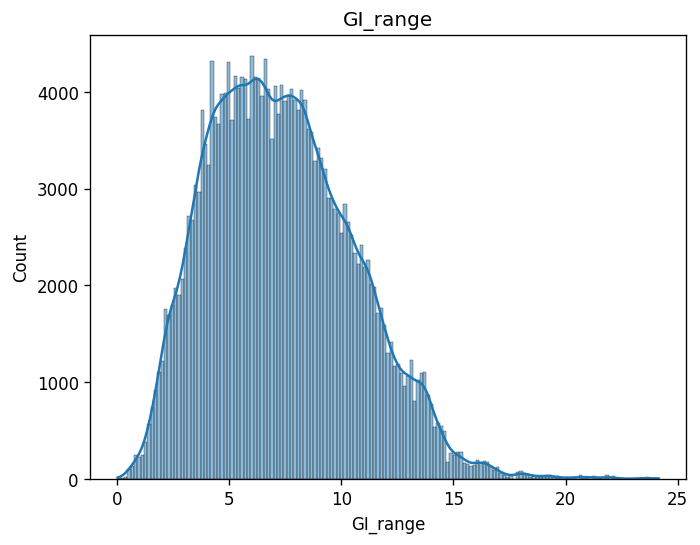

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDWI_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


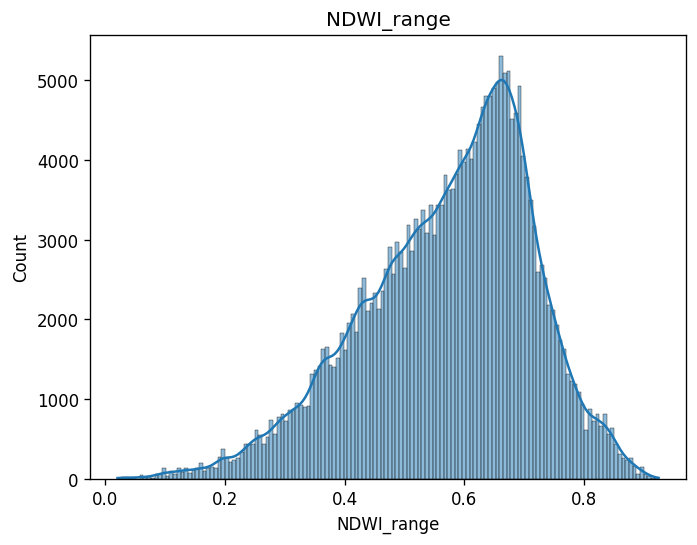

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR1_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


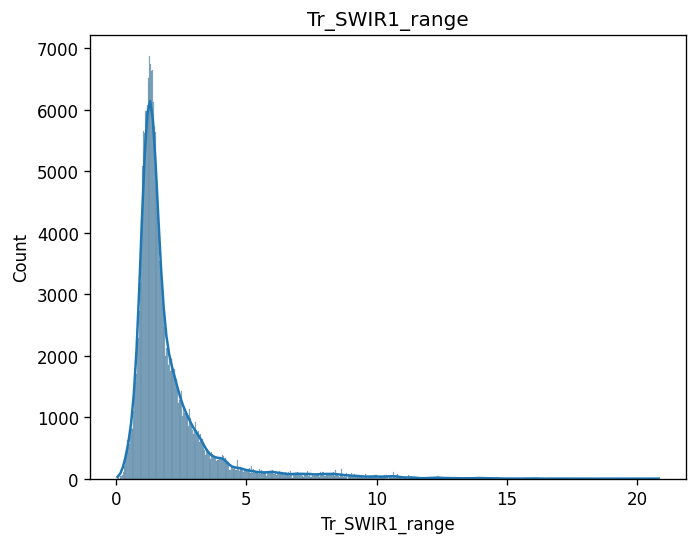

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR2_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


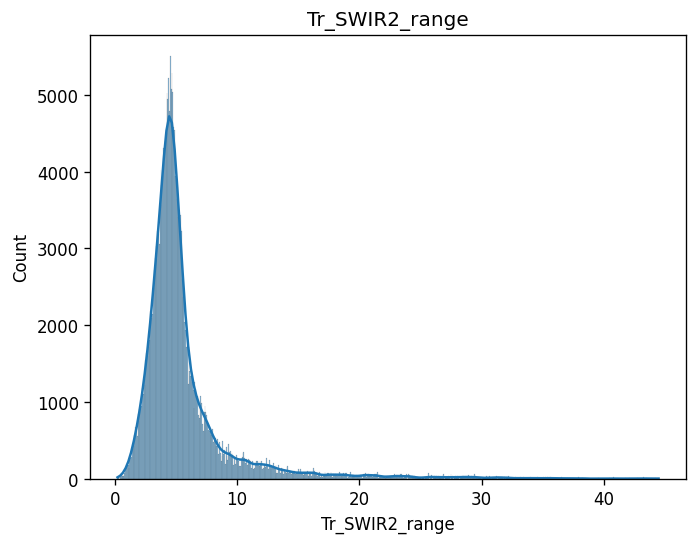

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDVI_obsCount
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


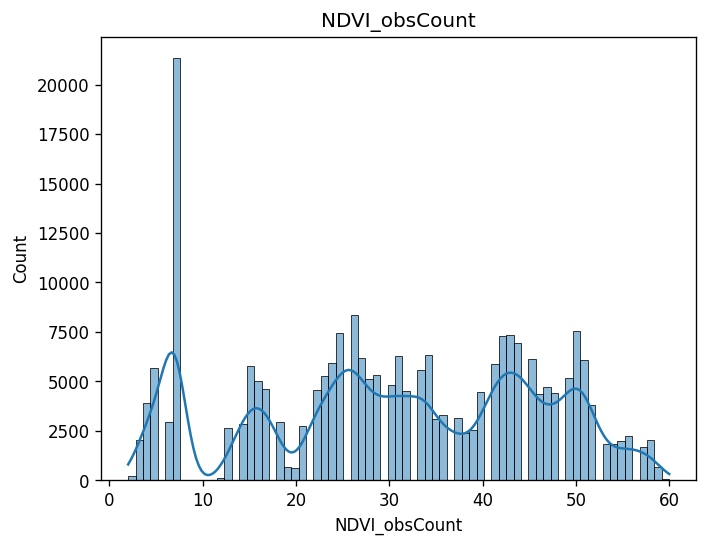

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
ppt_mean
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


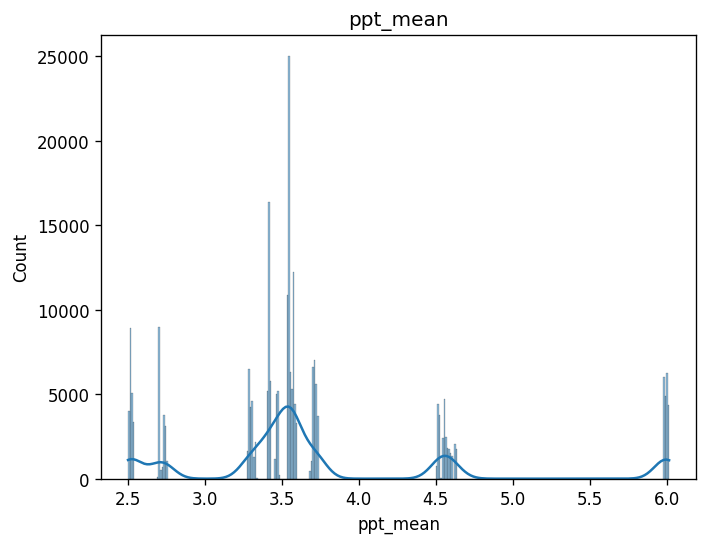

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
ppt_max
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


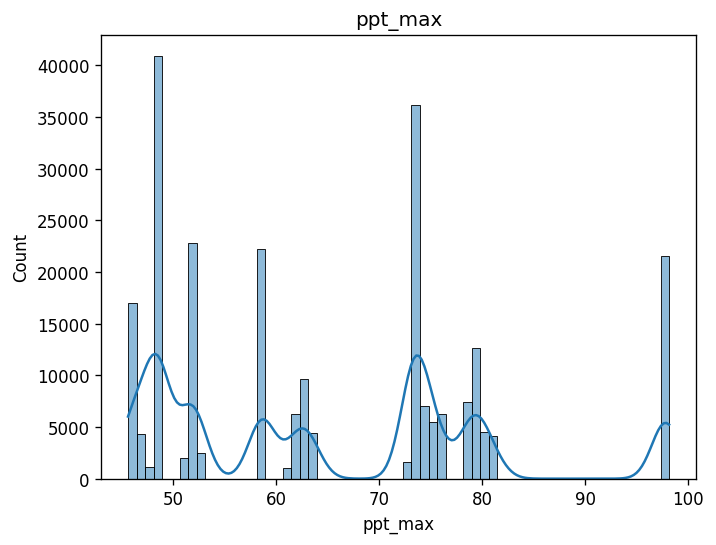

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
ppt_range
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


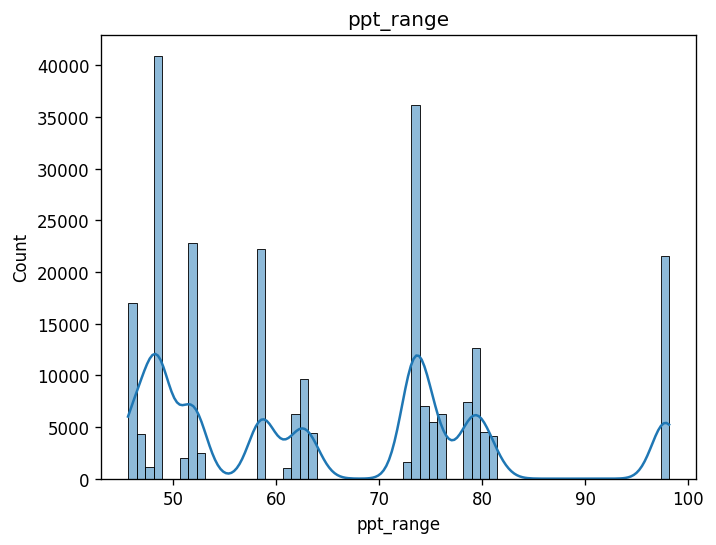

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
ppt_total
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


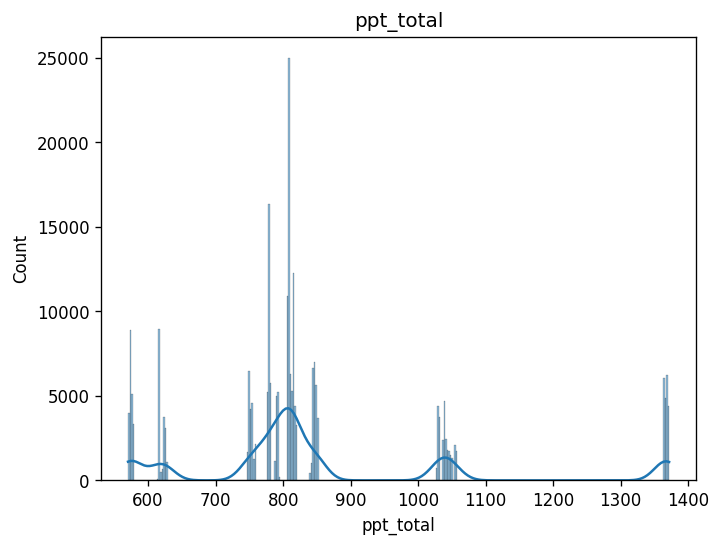

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Sand
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


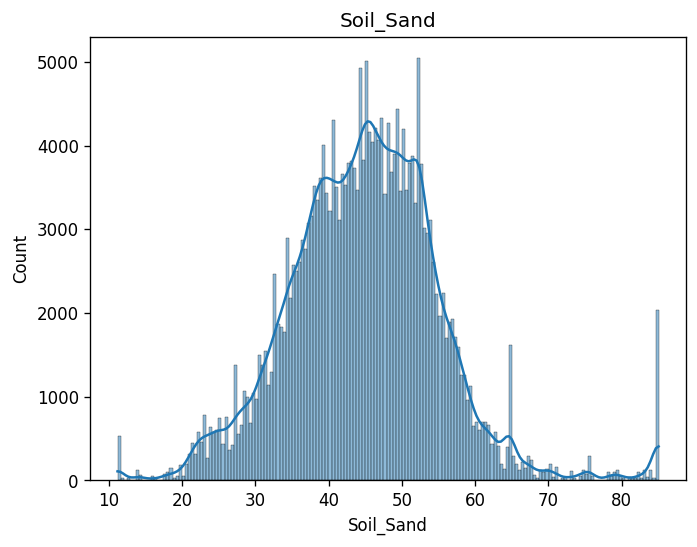

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Silt
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


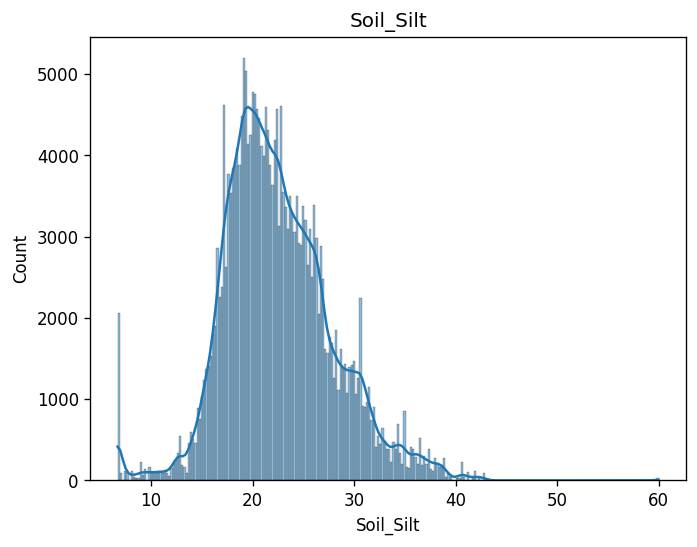

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Clay
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


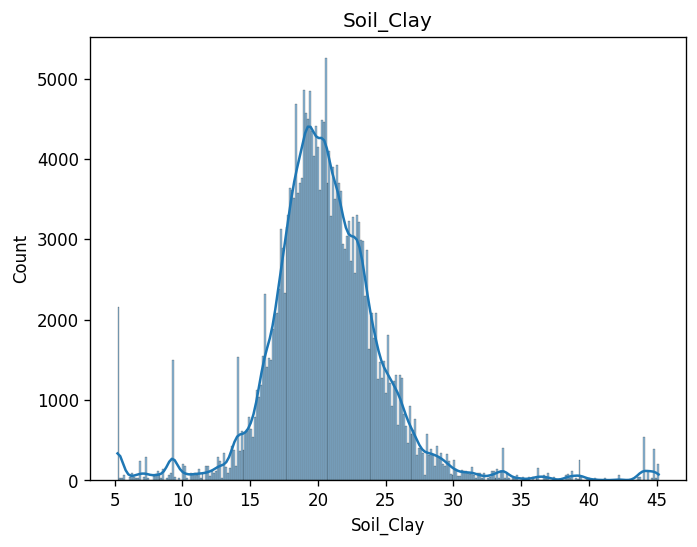

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_BD
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


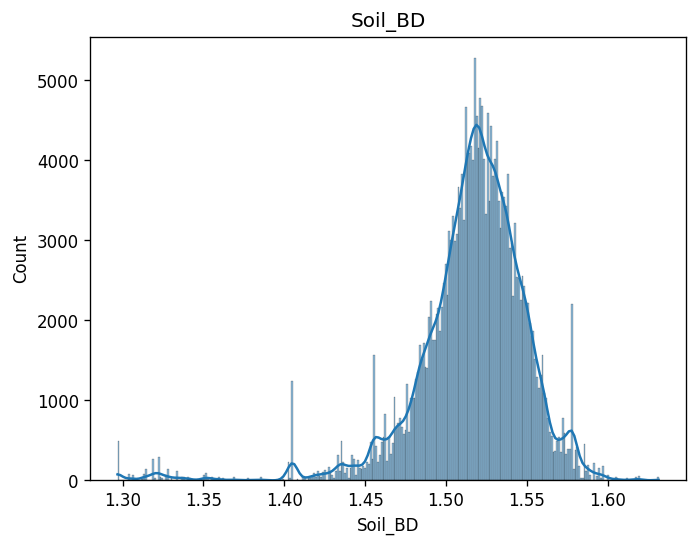

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_pH
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


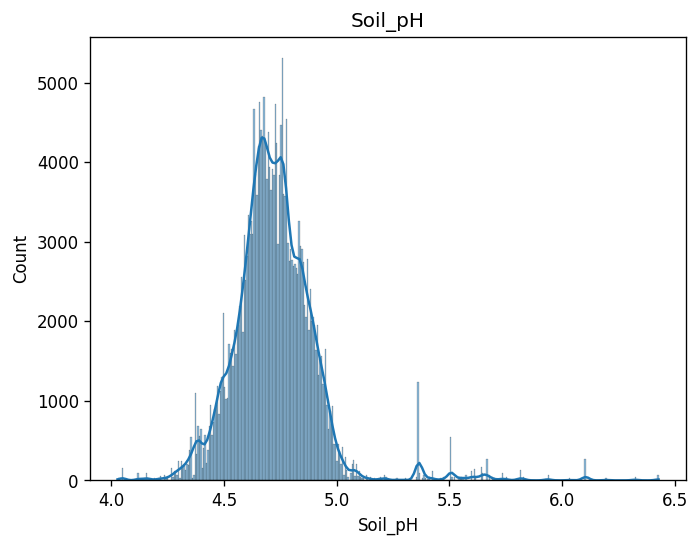

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_OM
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


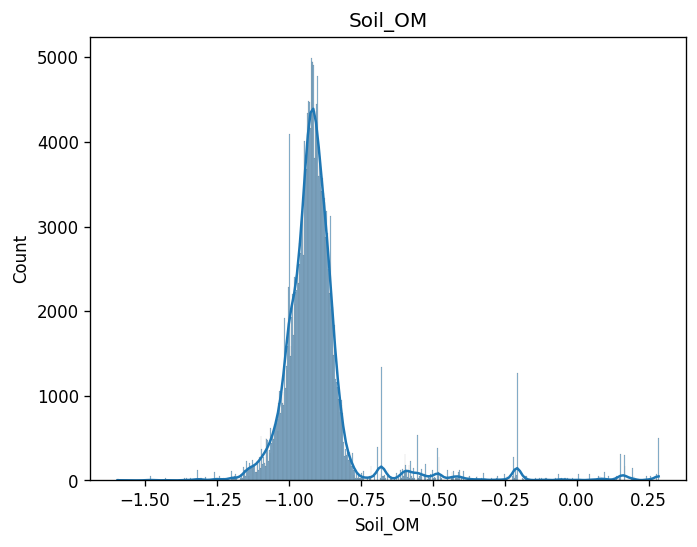

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Theta_S
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


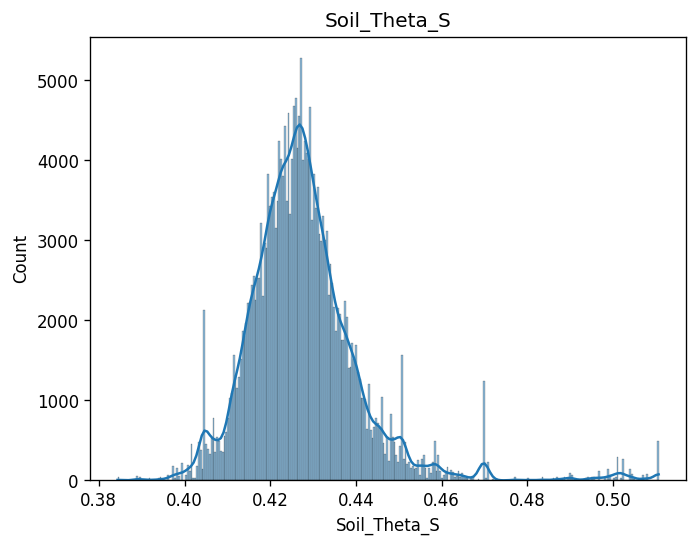

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Theta_R
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


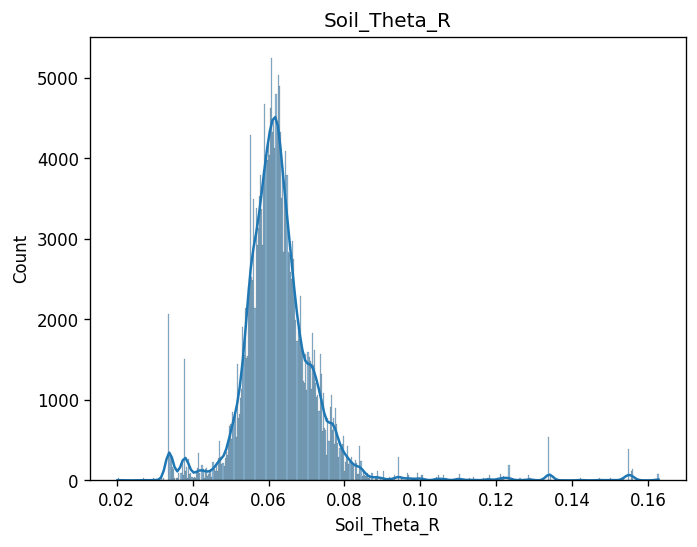

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Ksat
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


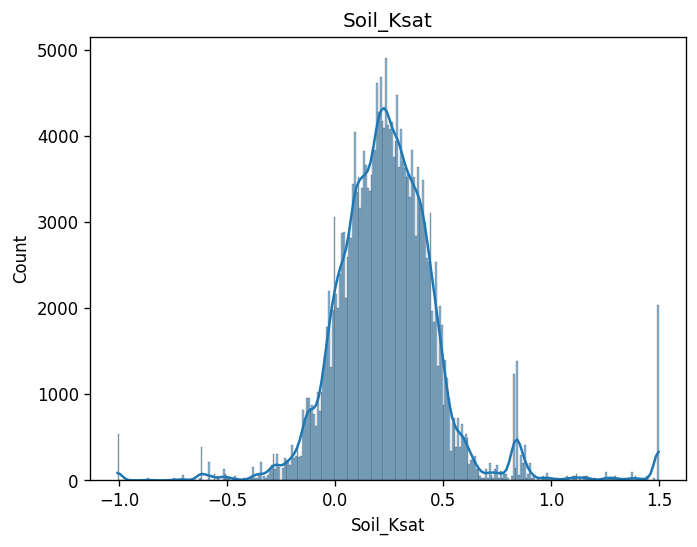

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Lambda
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


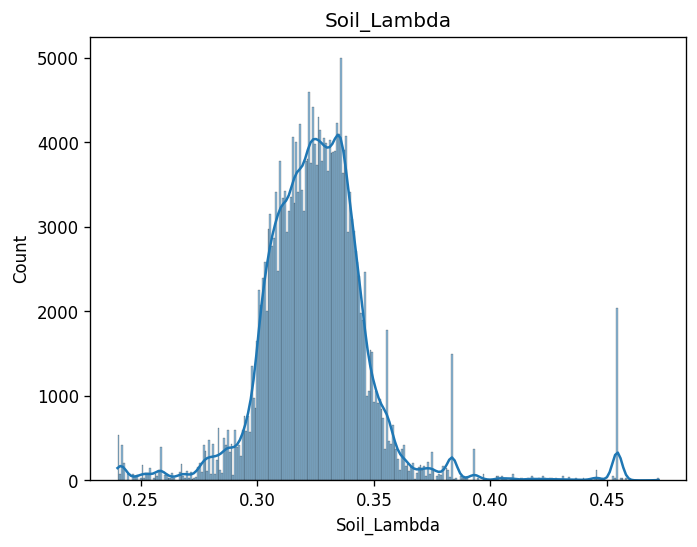

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_Alpha
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


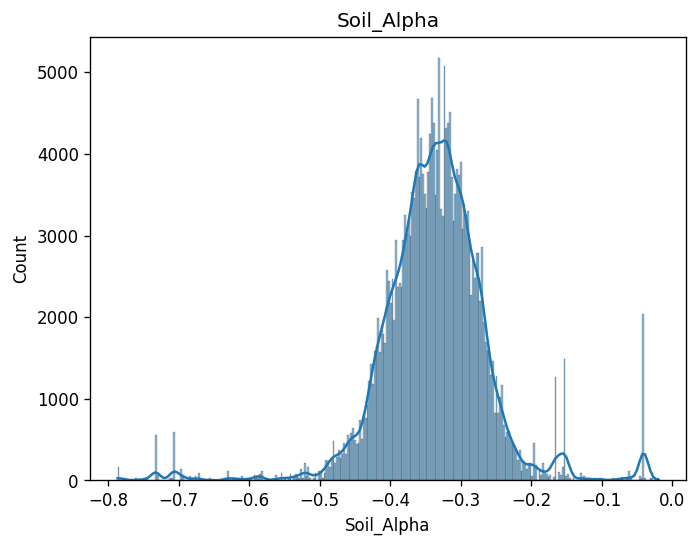

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Soil_N
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


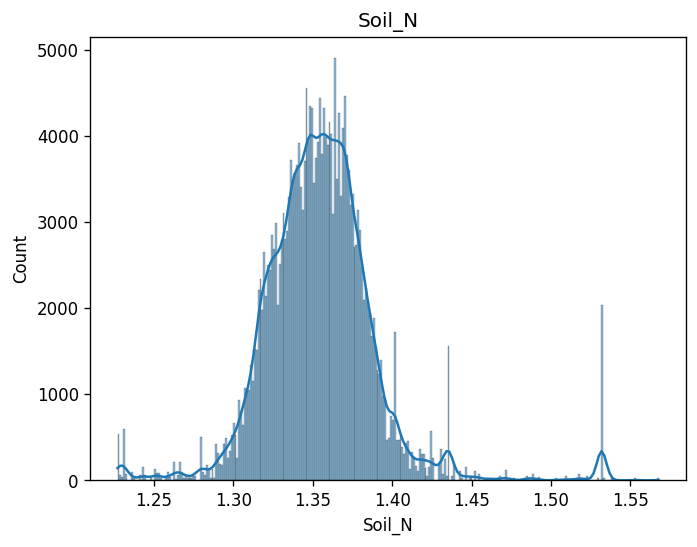

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
x_m
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


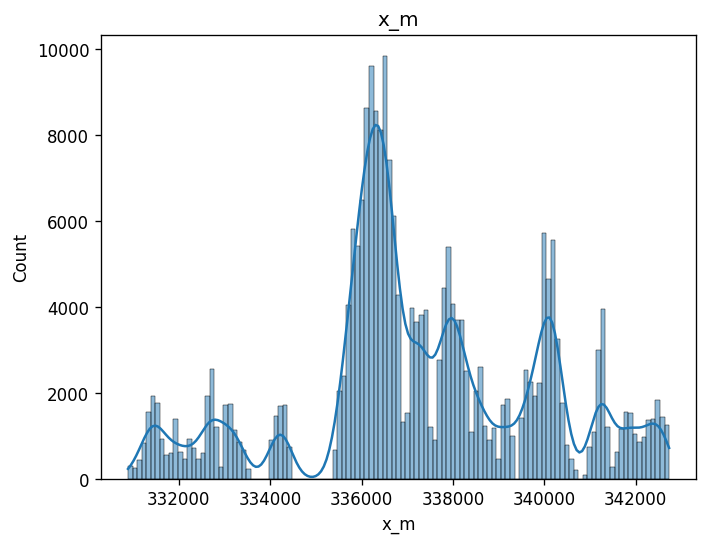

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
y_m
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


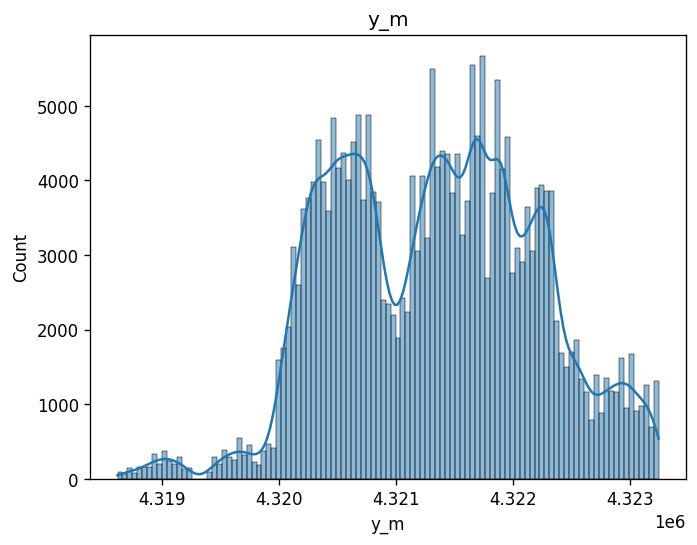

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
elevation
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


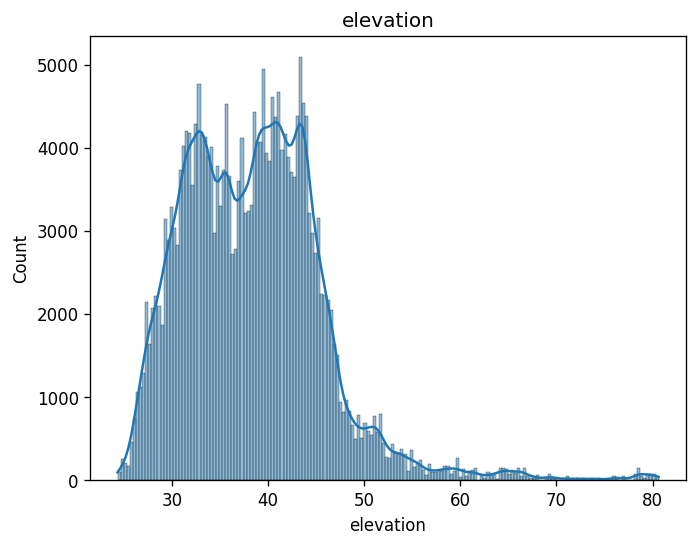

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
slope
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


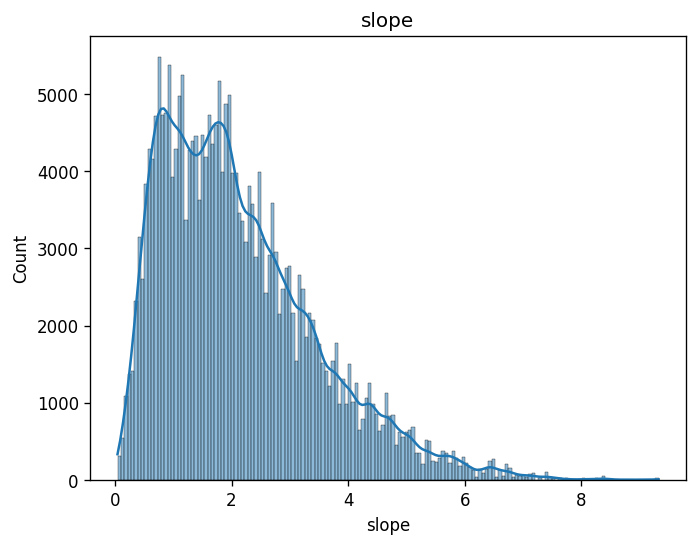

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
aspect
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


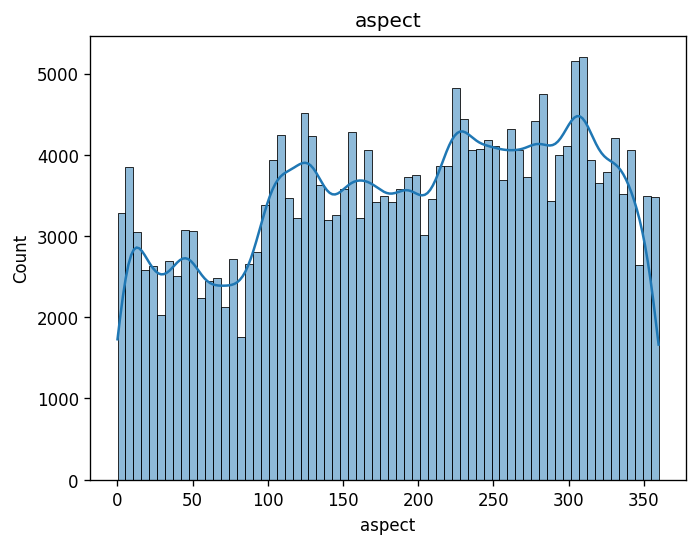

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
month
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


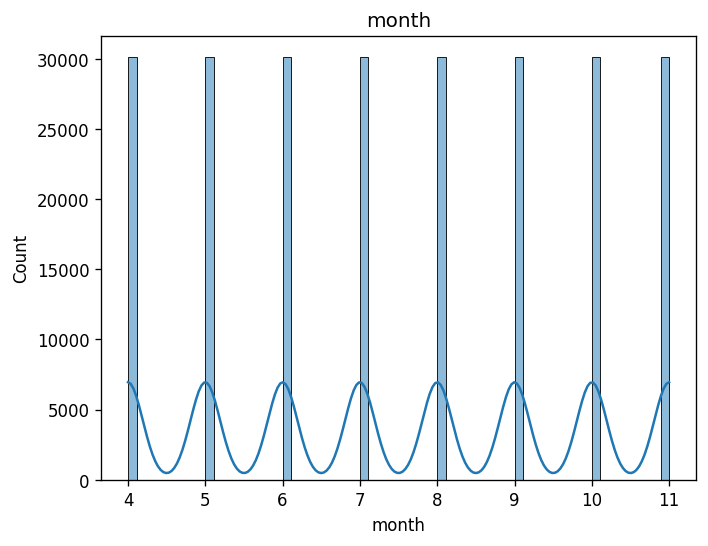

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
month_index
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


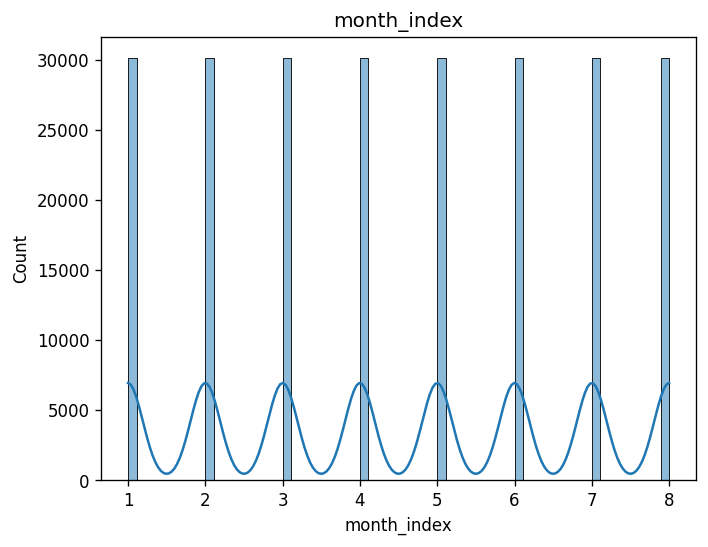

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDVI
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


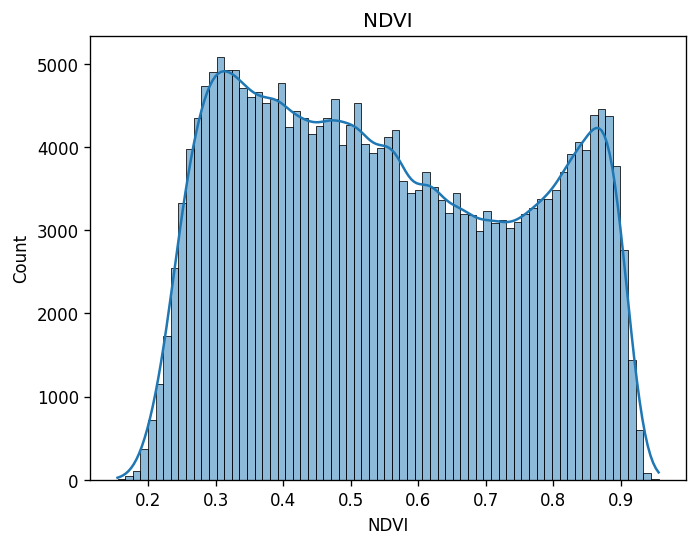

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
EVI
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


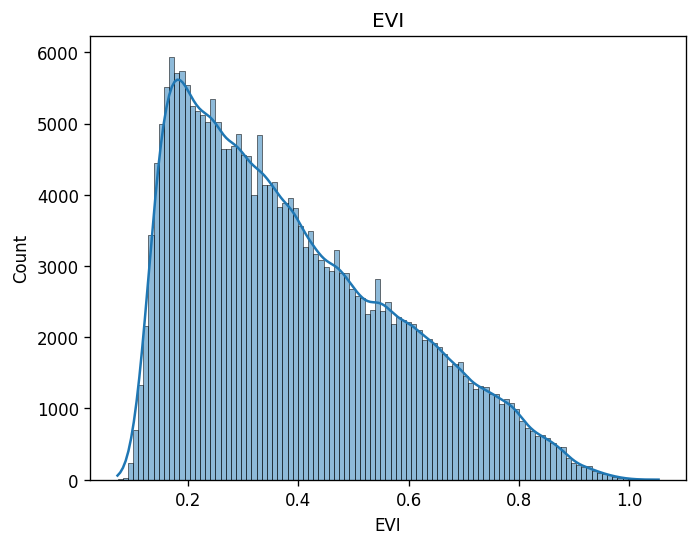

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
GI
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


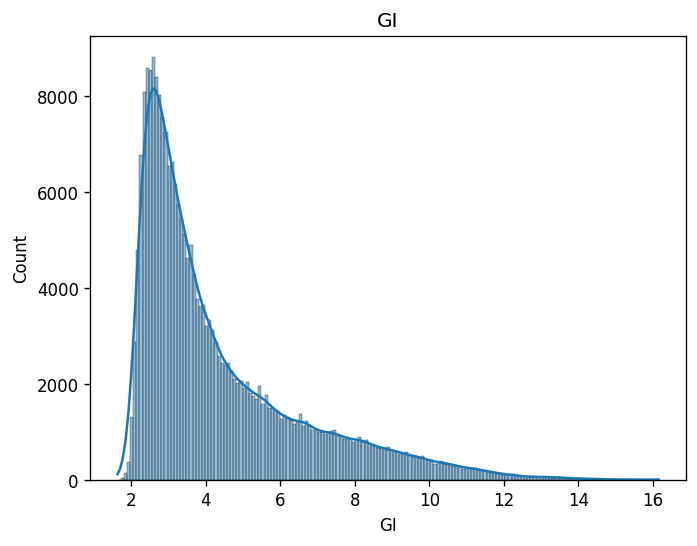

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
NDWI
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


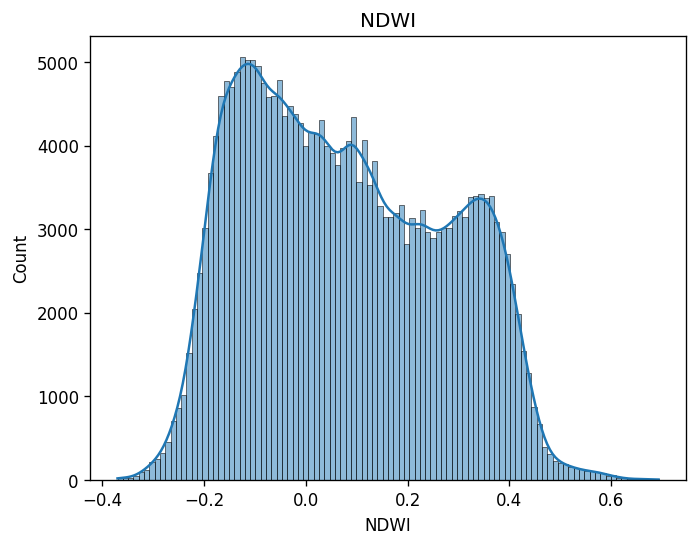

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR1
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


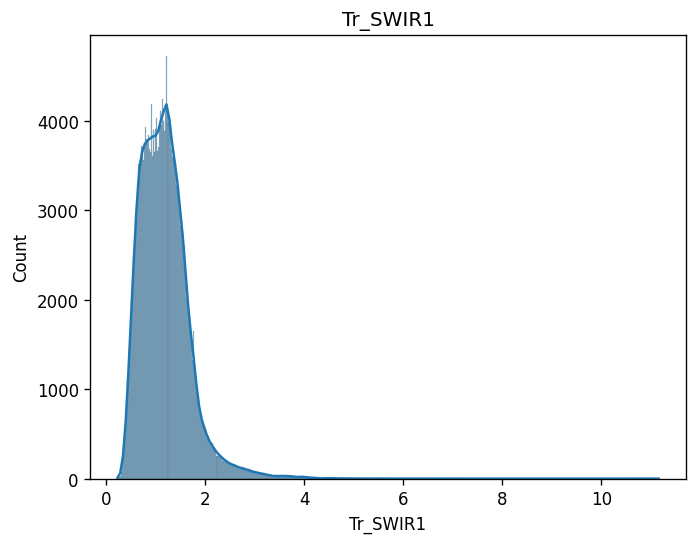

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Tr_SWIR2
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


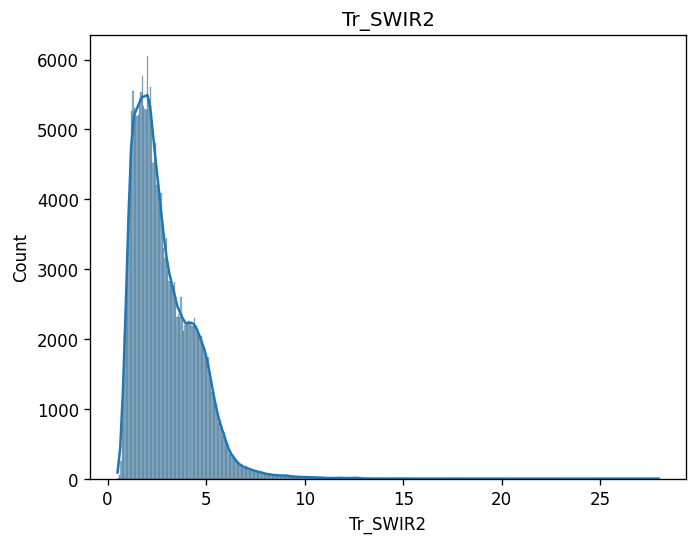

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
LST_K
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


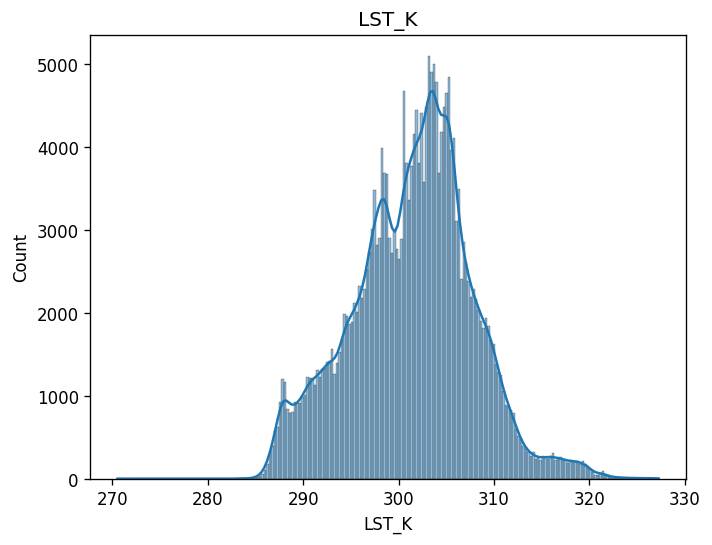

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
PPT_mm
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


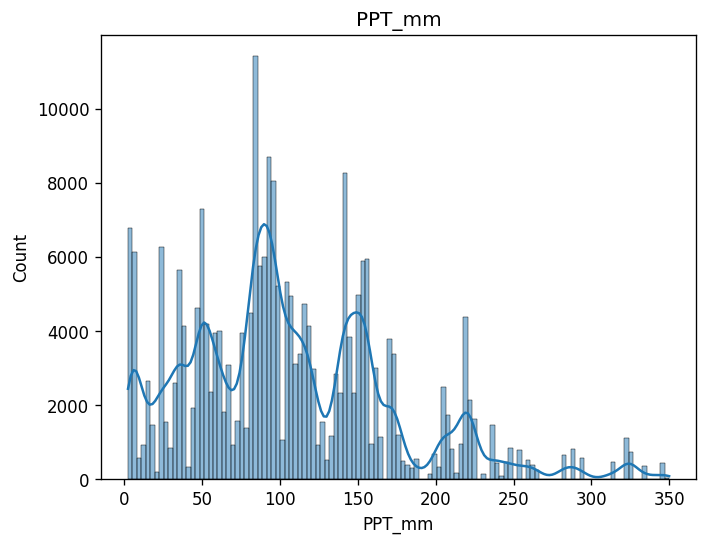

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
PPT_obsCount
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


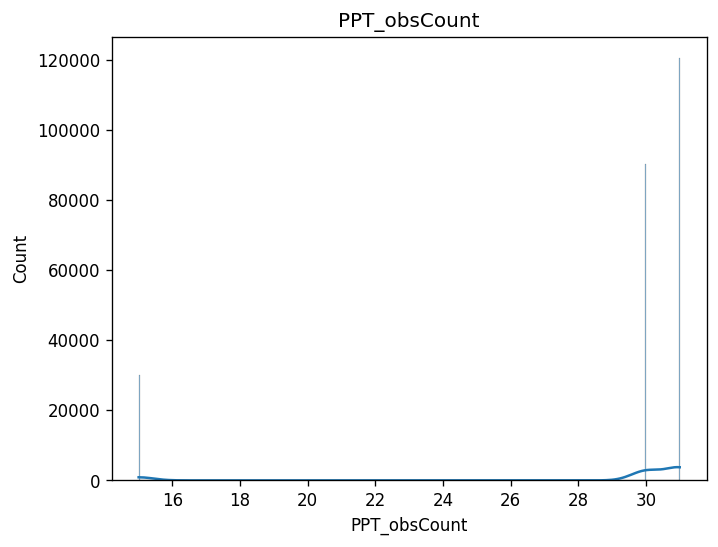

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
HLS_obsCount
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


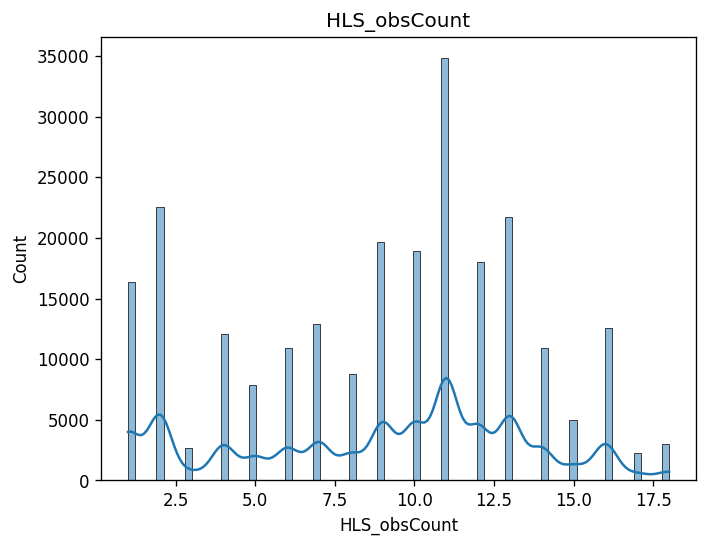

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
LST_obsCount
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


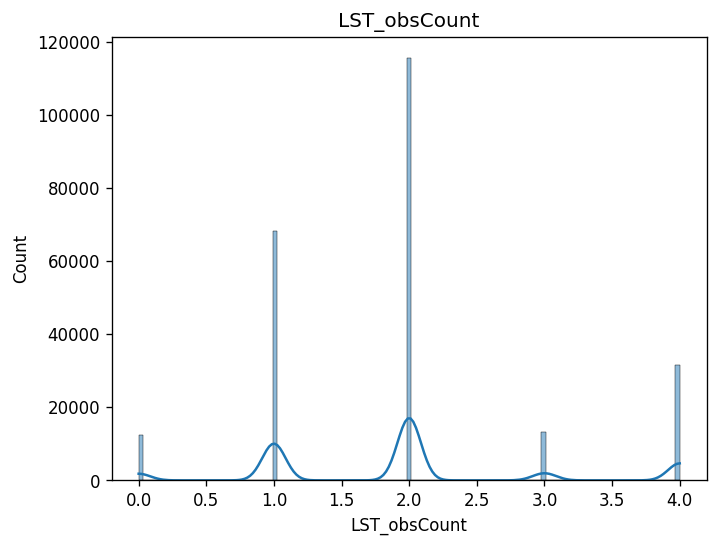

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
window
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


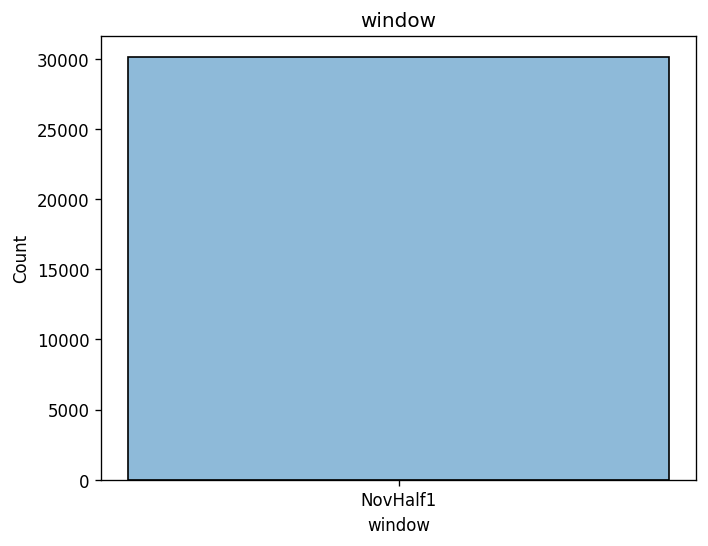

In [ ]:
for keys in df.keys():
    print("+"*60)
    print(keys)
    print("+"*60)
    sns.histplot(data=df, x=keys, kde=True)
    plt.xlabel(keys)
    plt.title(keys)
    plt.show()


### Building Monthly Grids

In [6]:

SEASON_MONTHS = list(range(4, 12))

key_cols = ['field', 'year', 'row', 'col']

ts_cols = ['NDVI','EVI','GI','NDWI','Tr_SWIR1','Tr_SWIR2','LST_K','PPT_mm']
qc_cols = ['HLS_obsCount','LST_obsCount','PPT_obsCount']

soil_cols = [c for c in df.columns if c.startswith("Soil_")]
topo_cols = ['elevation','slope','aspect']

# Optional summary features (add what you want)
summary_cols = [
    'LST_median','LST_max','LST_range',
    'NDVI_mean','EVI_mean','GI_mean','NDWI_mean','Tr_SWIR1_mean','Tr_SWIR2_mean',
    'NDVI_max','EVI_max','GI_max','NDWI_max','Tr_SWIR1_max','Tr_SWIR2_max',
    'NDVI_range','EVI_range','GI_range','NDWI_range','Tr_SWIR1_range','Tr_SWIR2_range',
    'ppt_mean','ppt_max','ppt_range','ppt_total'
]

static_cols = soil_cols + topo_cols + summary_cols

target_col = 'yield_mean'

# Filter season rows
df_season = df[df['month'].isin(SEASON_MONTHS)].copy()
df_season = df_season.sort_values(key_cols + ['month'])


In [7]:
import numpy as np

use_ts = ts_cols + qc_cols  # channels for the spatial CNN input

def build_grids(df_season, use_ts, static_cols, target_col='yield_mean'):
    ts_grid = {}
    y_grid = {}
    static_lookup = {}
    ij_lookup = {}

    for (field, year), gfy in df_season.groupby(['field', 'year'], sort=False):
        rows = np.sort(gfy['row'].unique())
        cols = np.sort(gfy['col'].unique())
        r2i = {r: i for i, r in enumerate(rows)}
        c2j = {c: j for j, c in enumerate(cols)}
        H, W = len(rows), len(cols)

        # yield grid (H,W)
        yg = np.full((H, W), np.nan, dtype=np.float32)

        # static lookup per pixel (store as vector)
        g_pix = gfy.drop_duplicates(['row', 'col'])
        for _, r in g_pix.iterrows():
            i, j = r2i[r['row']], c2j[r['col']]
            yg[i, j] = np.float32(r[target_col])
            static_lookup[(field, year, int(r['row']), int(r['col']))] = r[static_cols].to_numpy(np.float32)
            ij_lookup[(field, year, int(r['row']), int(r['col']))] = (i, j)

        y_grid[(field, year)] = yg

        # time-series grids per month
        for m, gm in gfy.groupby('month', sort=False):
            X = np.full((len(use_ts), H, W), np.nan, dtype=np.float32)
            for _, r in gm.iterrows():
                i, j = r2i[r['row']], c2j[r['col']]
                X[:, i, j] = r[use_ts].to_numpy(np.float32)
            ts_grid[(field, year, int(m))] = X

    return ts_grid, y_grid, static_lookup, ij_lookup

ts_grid, y_grid, static_lookup, ij_lookup = build_grids(df_season, use_ts, static_cols, target_col)
print("Built grids:")
print(" ts_grid entries:", len(ts_grid))
print(" y_grid entries :", len(y_grid))
print(" pixels         :", len(ij_lookup))


Built grids:
 ts_grid entries: 3088
 y_grid entries : 386
 pixels         : 30135


In [ ]:
y_grid.keys()

dict_keys([('APU_1', np.int64(2016)), ('APU_1', np.int64(2018)), ('APU_1', np.int64(2019)), ('APU_1', np.int64(2022)), ('APU_1', np.int64(2024)), ('APU_1-98', np.int64(2015)), ('APU_1-98', np.int64(2017)), ('APU_1-98', np.int64(2019)), ('APU_1-98', np.int64(2021)), ('APU_30', np.int64(2019)), ('APU_30', np.int64(2020)), ('APU_30', np.int64(2022)), ('APU_30', np.int64(2024)), ('APU_4', np.int64(2018)), ('APU_4', np.int64(2019)), ('APU_4', np.int64(2021)), ('APU_4', np.int64(2023)), ('APU_5', np.int64(2018)), ('APU_5', np.int64(2019)), ('APU_5', np.int64(2021)), ('APU_5', np.int64(2023)), ('APU_7', np.int64(2016)), ('APU_7', np.int64(2017)), ('APU_7', np.int64(2019)), ('APU_7', np.int64(2021)), ('Central Farm_1-1', np.int64(2017)), ('Central Farm_1-1', np.int64(2019)), ('Central Farm_1-1', np.int64(2021)), ('Central Farm_1-1', np.int64(2023)), ('Central Farm_1-11', np.int64(2017)), ('Central Farm_1-11', np.int64(2019)), ('Central Farm_1-11', np.int64(2021)), ('Central Farm_1-13', np.int6

In [8]:
# pick one key to inspect
k = next(iter(y_grid.keys()))
field, year = k
print("Example field-year:", k, "y_grid shape:", y_grid[k].shape)

# check one month grid exists
m = SEASON_MONTHS[0]
print("Has month grid?", (field, year, m) in ts_grid)
if (field, year, m) in ts_grid:
    print("Month grid shape:", ts_grid[(field, year, m)].shape, "(C,H,W)")


Example field-year: ('APU_1', 2016) y_grid shape: (11, 19)
Has month grid? True
Month grid shape: (11, 11, 19) (C,H,W)


In [9]:
meta = []
for (field, year, row, col), (i, j) in ij_lookup.items():
    meta.append((field, int(year), int(row), int(col), int(i), int(j)))

print("Total pixel-year samples:", len(meta))
print("Example meta row:", meta[0])


Total pixel-year samples: 30135
Example meta row: ('APU_1', 2016, 110, 250, 0, 8)


### Building the dataset loaders


In [10]:

def y_to_model(y):
    # robust: handles y<=0 safely (shouldn't happen for yield, but protects you)
    return np.log1p(np.clip(y, a_min=0.0, a_max=None)).astype(np.float32)

def y_from_model(y_log):
    return np.expm1(y_log).astype(np.float32)


In [11]:

from torch.utils.data import Dataset, DataLoader

def extract_patch(arr_chw, i, j, P):
    """
    arr_chw: (C,H,W)
    returns: (C,P,P) patch centered at (i,j), with NaN padding for borders
    """
    C, H, W = arr_chw.shape
    rad = P // 2
    padded = np.pad(arr_chw, ((0,0), (rad,rad), (rad,rad)),
                    mode="constant", constant_values=np.nan)
    ii, jj = i + rad, j + rad
    return padded[:, ii-rad:ii+rad+1, jj-rad:jj+rad+1]


class PixelPatchSeasonDataset(Dataset):
    def __init__(self, meta_rows, ts_grid, y_grid, static_lookup,
                 season_months, patch=3, fill_nan=0.0, ts_scaler= None, static_scaler=None):
        self.meta = meta_rows
        self.ts_grid = ts_grid
        self.y_grid = y_grid
        self.static_lookup = static_lookup
        self.season_months = list(season_months)
        self.patch = patch
        self.fill_nan = fill_nan
        self.ts_scaler = ts_scaler
        self.static_scaler = static_scaler

    def __len__(self):
        return len(self.meta)

    def __getitem__(self, idx):
        field, year, row, col, i, j = self.meta[idx]

        # (T,C,P,P)
        seq = []
        for m in self.season_months:
            X_chw = self.ts_grid[(field, year, int(m))]   # (C,H,W)
            p = extract_patch(X_chw, i, j, self.patch)    # (C,P,P)
            seq.append(p)

        x_patch = np.stack(seq, axis=0).astype(np.float32)  # (T,C,P,P)

        if self.ts_scaler is not None:
            mean = self.ts_scaler.mean_.astype(np.float32)
            scale = self.ts_scaler.scale_.astype(np.float32)
            scale = np.where(scale > 0, scale, 1.0)

            # fill NaNs with TRAIN mean per channel
            for c in range(x_patch.shape[1]):
                x_patch[:, c, :, :] = np.nan_to_num(
                    x_patch[:, c, :, :],
                    nan=mean[c]
                )

            x_patch = (x_patch - mean[None, :, None, None]) / scale[None, :, None, None]
        else:
            x_patch = np.nan_to_num(x_patch, nan=0.0)


        x_static = self.static_lookup[(field, year, row, col)].astype(np.float32)
        if self.static_scaler is not None:
            m = self.static_scaler.mean_.astype(np.float32)
            x_static = np.where(np.isnan(x_static), m, x_static)
        else:
            x_static = np.nan_to_num(x_static, nan=self.fill_nan)


        if self.static_scaler is not None:
            mean = self.static_scaler.mean_.astype(np.float32)   # (C_static,)
            scale = self.static_scaler.scale_.astype(np.float32) # (C_static,)
            scale = np.where(scale > 0, scale, 1.0).astype(np.float32)
            x_static = (x_static - mean) / scale

        y = self.y_grid[(field, year)][i, j]
        y = 0.0 if np.isnan(y) else float(y)
        y = y_to_model(y)  # ✅ log1p target

        return (
            torch.tensor(x_patch, dtype=torch.float32),      # (T,C,P,P)
            torch.tensor(x_static, dtype=torch.float32),     # (C_static,)
            torch.tensor([y], dtype=torch.float32),          # (1,)
            (field, year, row, col)                          # meta
        )


In [12]:
tmp_ds = PixelPatchSeasonDataset(meta[:32], ts_grid, y_grid, static_lookup,
                                 season_months=SEASON_MONTHS, patch=3)
x_patch, x_static, y, m = tmp_ds[0]
print("x_patch:", x_patch.shape)   # expected (8, 11, 5, 5)
print("x_static:", x_static.shape) # expected (len(static_cols),)
print("y:", y.shape, y.item())


x_patch: torch.Size([8, 11, 3, 3])
x_static: torch.Size([40])
y: torch.Size([1]) 3.1479971408843994


In [13]:
TEST_YEAR = 2023
VAL_YEARS = {2014, 2016, 2024}

years = np.array([r[1] for r in meta], dtype=int)

idx_test = np.where(years == TEST_YEAR)[0]
idx_val  = np.where(np.isin(years, list(VAL_YEARS)))[0]
idx_train = np.where((years != TEST_YEAR) & (~np.isin(years, list(VAL_YEARS))))[0]

print("Train samples:", len(idx_train))
print("Val samples  :", len(idx_val), "years:", sorted(set(years[idx_val].tolist())))
print("Test samples :", len(idx_test), "years:", sorted(set(years[idx_test].tolist())))


Train samples: 21188
Val samples  : 6669 years: [2014, 2016, 2024]
Test samples : 2278 years: [2023]


In [14]:
# ==========================================================
# Fit StandardScalers on TRAIN years ONLY (no leakage)
# ==========================================================
train_years = set(years[idx_train].tolist())

def fit_standard_scalers(df_season, train_years, use_ts, static_cols):
    df_tr = df_season[df_season["year"].isin(train_years)].copy()

    # Time-series features (NDVI, EVI, LST, etc.)
    ts_scaler = StandardScaler()
    ts_scaler.fit(df_tr[use_ts].to_numpy(np.float32))

    # Static features (soil + topo + summary)
    df_pix = df_tr.drop_duplicates(["field", "year", "row", "col"])
    static_scaler = StandardScaler()
    static_scaler.fit(df_pix[static_cols].to_numpy(np.float32))

    return ts_scaler, static_scaler

ts_scaler, static_scaler = fit_standard_scalers(
    df_season, train_years, use_ts, static_cols
)

print("StandardScalers fitted on TRAIN years:", sorted(train_years))


StandardScalers fitted on TRAIN years: [2015, 2017, 2018, 2019, 2020, 2021, 2022]


In [15]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


CUDA available: True
CUDA device count: 1
GPU: Quadro RTX 8000


In [16]:
BATCH = 256  # start here; adjust based on GPU/CPU memory
PATCH = 3

train_meta = [meta[i] for i in idx_train]
val_meta   = [meta[i] for i in idx_val]
test_meta  = [meta[i] for i in idx_test]

train_ds = PixelPatchSeasonDataset(
    train_meta, ts_grid, y_grid, static_lookup,
    SEASON_MONTHS, patch=PATCH,
    ts_scaler=ts_scaler, static_scaler=static_scaler
)

val_ds = PixelPatchSeasonDataset(
    val_meta, ts_grid, y_grid, static_lookup,
    SEASON_MONTHS, patch=PATCH,
    ts_scaler=ts_scaler, static_scaler=static_scaler
)

test_ds = PixelPatchSeasonDataset(
    test_meta, ts_grid, y_grid, static_lookup,
    SEASON_MONTHS, patch=PATCH,
    ts_scaler=ts_scaler, static_scaler=static_scaler
)


train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True,  num_workers=32, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH, shuffle=False, num_workers=32, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH, shuffle=False, num_workers=32, pin_memory=True)

# batch shape check
xb, xs, yb, mb = next(iter(train_loader))
print("Batch x_patch:", xb.shape)  # (B, T, C, P, P)
print("Batch x_static:", xs.shape) # (B, C_static)
print("Batch y:", yb.shape)        # (B, 1)


Batch x_patch: torch.Size([256, 8, 11, 3, 3])
Batch x_static: torch.Size([256, 40])
Batch y: torch.Size([256, 1])


In [17]:
xb, xs, yb, _ = next(iter(train_loader))

# xb shape: (B, T, C, P, P)
B, T, C, P, _ = xb.shape

# per-channel stats across (B,T,P,P)
means = xb.mean(dim=(0,1,3,4))
stds  = xb.std(dim=(0,1,3,4))

for i in range(C):
    print(f"Channel {i:02d}: mean={means[i].item(): .3f}  std={stds[i].item(): .3f}")


Channel 00: mean=-0.032  std= 0.960
Channel 01: mean=-0.021  std= 0.964
Channel 02: mean= 0.007  std= 0.978
Channel 03: mean=-0.038  std= 0.962
Channel 04: mean=-0.027  std= 0.941
Channel 05: mean=-0.014  std= 0.961
Channel 06: mean=-0.008  std= 0.944
Channel 07: mean=-0.010  std= 0.913
Channel 08: mean= 0.047  std= 0.911
Channel 09: mean= 0.050  std= 0.968
Channel 10: mean= 0.000  std= 0.923


In [18]:
xb, xs, yb, _ = next(iter(train_loader))
print("x_patch mean/std:", xb.mean().item(), xb.std().item())
print("x_static mean/std:", xs.mean().item(), xs.std().item())


x_patch mean/std: -0.016516495496034622 0.9061378240585327
x_static mean/std: -0.04057107865810394 1.0049185752868652


### Model Architecture and Training Procedure


In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# -------- Attention (same as yours) --------
class TemporalAttention(nn.Module):
    def __init__(self, hidden_dim, attn_dim=128, dropout=0.0):
        super().__init__()
        self.proj = nn.Linear(hidden_dim, attn_dim)
        self.v = nn.Linear(attn_dim, 1, bias=False)
        self.drop = nn.Dropout(dropout)

    def forward(self, out, mask=None, return_weights=False):
        h = torch.tanh(self.proj(out))      # (B, T, A)
        h = self.drop(h)
        scores = self.v(h).squeeze(-1)      # (B, T)
        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)
        attn = F.softmax(scores, dim=1)     # (B, T)
        ctx = torch.sum(out * attn.unsqueeze(-1), dim=1)  # (B, H)
        return (ctx, attn) if return_weights else ctx


# -------- CNN2D encoder for one patch (B,C,P,P) -> (B,D) --------
class SpatialCNNEncoder2D(nn.Module):
    def __init__(self, in_ch, emb_dim=128, dropout=0.2):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(in_ch, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout2d(dropout),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout2d(dropout),

            nn.AdaptiveAvgPool2d((1, 1))  # (B,128,1,1)
        )
        self.proj = nn.Sequential(
            nn.Flatten(),                 # (B,128)
            nn.Linear(128, emb_dim),
            nn.ReLU()
        )

    def forward(self, x):  # x: (B,C,P,P)
        return self.proj(self.features(x))  # (B,emb_dim)


# -------- apply spatial encoder per month: (B,T,C,P,P) -> (B,T,D) --------
class TimeDistributedSpatialEncoder(nn.Module):
    def __init__(self, spatial_encoder: nn.Module):
        super().__init__()
        self.enc = spatial_encoder

    def forward(self, x_patch):
        B, T, C, P, _ = x_patch.shape
        z = self.enc(x_patch.reshape(B*T, C, P, P))  # (B*T,D)
        return z.reshape(B, T, -1)                   # (B,T,D)


# -------- Parallel CNN head on time-aggregated patch (B,C,P,P)->(B,Pdim) --------
class ParallelSpatialCNNHead(nn.Module):
    def __init__(self, in_ch, out_dim=128, dropout=0.3):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, 64, 3, padding=1),
            nn.ReLU(),
            nn.Dropout2d(dropout),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(),
            nn.Dropout2d(dropout),

            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(128, out_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
        )

    def forward(self, x_mean):  # (B,C,P,P)
        return self.net(x_mean)  # (B,out_dim)


# -------- Full model --------
class YieldSpatialCNNLSTM_Attn(nn.Module):
    def __init__(self,
                 in_ch, static_in_dim,
                 emb_dim=128,
                 lstm_hidden=512, # Original : 256
                 lstm_layers=2,
                 attn_dim=128,
                 parallel_dim=128,
                 static_hidden=256,
                 head_hidden=768, # Original: 768
                 dropout=0.2): # Original: 0.3
        super().__init__()

        self.time_enc = TimeDistributedSpatialEncoder(
            SpatialCNNEncoder2D(in_ch=in_ch, emb_dim=emb_dim, dropout=dropout)
        )

        self.lstm = nn.LSTM(
            input_size=emb_dim,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            dropout=0.0 if lstm_layers == 1 else dropout,
            bidirectional=False
        )

        self.attn = TemporalAttention(hidden_dim=lstm_hidden, attn_dim=attn_dim, dropout=dropout)

        self.parallel = ParallelSpatialCNNHead(in_ch=in_ch, out_dim=parallel_dim, dropout=dropout)

        self.static_proj = nn.Sequential(
            nn.Linear(static_in_dim, static_hidden),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        fusion_dim = lstm_hidden + parallel_dim + static_hidden
        self.head = nn.Sequential(
            nn.Linear(fusion_dim, head_hidden),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(head_hidden, 1)
        )

    def forward(self, x_patch, x_static, attn_mask=None, return_attn=False):
        # x_patch: (B,T,C,P,P)
        z = self.time_enc(x_patch)      # (B,T,emb_dim)
        out, _ = self.lstm(z)           # (B,T,lstm_hidden)

        if return_attn:
            f_t, attn = self.attn(out, mask=attn_mask, return_weights=True)
        else:
            f_t = self.attn(out, mask=attn_mask, return_weights=False)
            attn = None

        x_mean = x_patch.mean(dim=1)    # (B,C,P,P)
        f_p = self.parallel(x_mean)     # (B,parallel_dim)

        f_s = self.static_proj(x_static)

        y_hat = self.head(torch.cat([f_t, f_p, f_s], dim=1))
        return (y_hat, attn) if return_attn else y_hat


In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

C_in = xb.shape[2]           # 11
C_static = xs.shape[1]       # 40

model = YieldSpatialCNNLSTM_Attn(
    in_ch=C_in,
    static_in_dim=C_static,
    emb_dim=192, # original: 128
    lstm_hidden=256, # Original: 384
    parallel_dim=256,
    # dropout=0.35, # Original 0.35
    head_hidden=384,
    dropout=0.42,
    static_hidden=256
).to(device)

with torch.no_grad():
    y_hat, attn = model(xb.to(device), xs.to(device), return_attn=True)

print("y_hat:", y_hat.shape)     # (B,1)
print("attn :", attn.shape)      # (B,T)
print("attn[0] sum:", attn[0].sum().item())


Device: cuda
y_hat: torch.Size([256, 1])
attn : torch.Size([256, 8])
attn[0] sum: 1.0


### Evaluations for the model

In [21]:

def regression_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)

    mse = np.mean((y_true - y_pred) ** 2)
    rmse = float(np.sqrt(mse))
    mae = float(np.mean(np.abs(y_true - y_pred)))

    # R2
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2) + 1e-12
    r2 = float(1.0 - ss_res / ss_tot)
    corr_sq = float(np.corrcoef(y_true, y_pred)[0, 1] ** 2)

    return {"rmse": rmse, "mae": mae, "r2": r2, "corr":corr_sq}


In [22]:
@torch.no_grad()
def eval_loader(model, loader, device, loss_fn=None, return_attn=False):
    model.eval()
    y_true_all, y_pred_all = [], []
    meta_all = []
    losses = []
    attn_all = []   # ✅ collect attention (N,T)

    for x_patch, x_static, y, meta in loader:
        x_patch = x_patch.to(device)
        x_static = x_static.to(device)
        y = y.to(device)

        # ✅ if you want attention, your model must support: pred, attn = model(..., return_attn=True)
        if return_attn:
            pred, attn = model(x_patch, x_static, return_attn=True)  # pred:(B,1), attn:(B,T)
            attn_all.append(attn.detach().cpu().numpy())
        else:
            pred = model(x_patch, x_static)  # (B,1)

        if loss_fn is not None:
            losses.append(loss_fn(pred, y).item())

        y_true_all.append(y.detach().cpu().tolist())
        y_pred_all.append(pred.detach().cpu().tolist())


        # ✅ meta is batched as (fields, years, rows, cols)
        fields, years, rows, cols = meta
        years = years.detach().cpu().numpy()
        rows  = rows.detach().cpu().numpy()
        cols  = cols.detach().cpu().numpy()

        # rebuild per-sample tuples
        B = len(fields)
        for i in range(B):
            meta_all.append((fields[i], int(years[i]), int(rows[i]), int(cols[i])))

    y_true = np.concatenate(y_true_all, axis=0)
    y_pred = np.concatenate(y_pred_all, axis=0)
    if LOG_TARGET:
      y_true = y_from_model(y_true)
      y_pred = y_from_model(y_pred)


    metrics = regression_metrics(y_true, y_pred)

    out = {
        "metrics": metrics,
        "y_true": y_true,
        "y_pred": y_pred,
        "meta": meta_all
    }

    if loss_fn is not None:
        out["loss"] = float(np.mean(losses)) if losses else None

    # ✅ add attention to output if requested
    if return_attn:
        out["attn"] = np.concatenate(attn_all, axis=0) if len(attn_all) else None  # (N,T)

    return out

In [23]:
def train_one_epoch(model, loader, optimizer, loss_fn, device):
    model.train()
    losses = []

    for x_patch, x_static, y, meta in loader:
        x_patch = x_patch.to(device)
        x_static = x_static.to(device)
        y = y.to(device)

        optimizer.zero_grad(set_to_none=True)
        pred = model(x_patch, x_static)
        loss = loss_fn(pred, y)
        loss.backward()
        optimizer.step()

        losses.append(loss.item())

    return float(np.mean(losses))


In [ ]:
!uv pip show numpy


Using Python 3.10.12 environment at: /home/cholab/LabMembers/Samar/.venv
Name: numpy
Version: 1.26.4
Location: /home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages
Requires:
Required-by: contourpy, fastparquet, geopandas, h5py, keras, matplotlib, ml-dtypes, numba, optuna, pandas, pyogrio, scikit-learn, scipy, seaborn, shap, shapely, tensorboard, tensorflow, torchmetrics, torchvision, xgboost


### Training a basic version of the model


In [ ]:
!uv pip install "numpy<2"
import numpy as np
import torch

Using Python 3.10.12 environment at: /home/cholab/LabMembers/Samar/.venv
Resolved 1 package in 9ms
Uninstalled 1 package in 30ms
Installed 1 package in 67ms
 - numpy==2.2.6
 + numpy==1.26.4


In [ ]:
import copy
import torch.nn as nn

EPOCHS = 150
LR = 0.002703005857254204
WD = 2.8063805839762486e-06
PATIENCE = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WD)
loss_fn = nn.HuberLoss(delta=0.102050)   # you can tune delta later

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=4,
    threshold=1e-5,
    min_lr=1e-6,
    # verbose=True
)

best_state = None
best_val_loss = float("inf")
bad = 0
history = []

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device)

    val_out = eval_loader(model, val_loader, device, loss_fn=loss_fn)
    val_loss = val_out["loss"]              # ✅ huber validation loss (float)
    val_metrics = val_out["metrics"]
    val_rmse = val_metrics["rmse"]

    # ✅ scheduler watches the chosen plateau metric (here: val_loss)
    scheduler.step(val_loss)

    # current lr (after scheduler may change it)
    current_lr = optimizer.param_groups[0]["lr"]

    history.append({
        "epoch": epoch,
        "lr": current_lr,
        "train_huber": train_loss,
        "val_huber": val_loss,
        "val_rmse": val_rmse,
        "val_mae": val_metrics["mae"],
        "val_r2": val_metrics["r2"],
    })

    print(
        f"Epoch {epoch:03d} | lr={current_lr:.2e} | "
        f"train_huber={train_loss:.5f} | val_huber={val_loss:.5f} | "
        f"val_rmse={val_rmse:.5f} val_mae={val_metrics['mae']:.5f} val_r2={val_metrics['r2']:.4f}"
    )

    # ✅ early stopping on val_huber
    if val_loss < best_val_loss - 1e-6:
        best_val_loss = val_loss
        best_state = copy.deepcopy(model.state_dict())
        bad = 0
    else:
        bad += 1
        if bad >= PATIENCE:
            print("Early stopping.")
            break

    # checkpoint (optional) — your %100 means it never triggers in 55 epochs
    if epoch % 100 == 0:
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "lr": current_lr,
            "train_huber": train_loss,
            "val_huber": val_loss,
            "val_rmse": val_rmse,
        }, f"ckpt_epoch_{epoch:03d}.pt")

# load best
if best_state is not None:
    model.load_state_dict(best_state)
    print("Loaded best model with val_huber:", best_val_loss)


Epoch 001 | lr=2.70e-03 | train_huber=0.05941 | val_huber=0.05819 | val_rmse=36.61168 val_mae=29.85916 val_r2=-2.5864
Epoch 002 | lr=2.70e-03 | train_huber=0.02705 | val_huber=0.03765 | val_rmse=19.92263 val_mae=16.39606 val_r2=-0.0620
Epoch 003 | lr=2.70e-03 | train_huber=0.02476 | val_huber=0.03364 | val_rmse=18.04843 val_mae=14.52203 val_r2=0.1284
Epoch 004 | lr=2.70e-03 | train_huber=0.02337 | val_huber=0.02979 | val_rmse=15.56583 val_mae=12.62168 val_r2=0.3517
Epoch 005 | lr=2.70e-03 | train_huber=0.02281 | val_huber=0.02918 | val_rmse=15.30571 val_mae=12.40960 val_r2=0.3732
Epoch 006 | lr=2.70e-03 | train_huber=0.02197 | val_huber=0.03165 | val_rmse=16.38124 val_mae=13.38278 val_r2=0.2820
Epoch 007 | lr=2.70e-03 | train_huber=0.02115 | val_huber=0.02817 | val_rmse=14.96534 val_mae=12.01250 val_r2=0.4008
Epoch 008 | lr=2.70e-03 | train_huber=0.02125 | val_huber=0.02655 | val_rmse=13.99280 val_mae=11.43362 val_r2=0.4761
Epoch 009 | lr=2.70e-03 | train_huber=0.02094 | val_huber=0.02

In [24]:
val_out = eval_loader(model, val_loader, device, loss_fn=loss_fn)
print("VAL combined:", val_out["metrics"])

yv = val_out["y_true"]
pv = val_out["y_pred"]
meta_v = val_out["meta"]

years_v = np.array([m[1] for m in meta_v], dtype=int)

for yr in sorted(set(years_v.tolist())):
    mask = (years_v == yr)
    m = regression_metrics(yv[mask], pv[mask])
    print(f"VAL {yr}: rmse={m['rmse']:.5f}, mae={m['mae']:.5f}, r2={m['r2']:.4f}, corr_sq={m['corr']:.3f}, n={mask.sum()}")


NameError: name 'loss_fn' is not defined

In [ ]:
test_out = eval_loader(model, test_loader, device, loss_fn=loss_fn)  # loss_fn optional
print("TEST 2023 metrics:", test_out["metrics"])
print("TEST 2023 huber:", test_out.get("loss"))


TEST 2023 metrics: {'mae': 13.137451, 'rmse': 15.276029, 'r2': -0.5915944541376525, 'corr': 0.6702043292424018}
TEST 2023 huber: 0.02069180914097362


### Model Evaluationg segment

In [36]:

# ==========================================================
# 0) History plots (matches YOUR history keys)
# ==========================================================
def plot_training_history(history):
    if history is None or len(history) == 0:
        print("No history found; skipping training curves.")
        return

    epochs     = [h["epoch"] for h in history]
    train_loss = [h["train_huber"] for h in history]
    val_loss   = [h["val_huber"] for h in history]
    val_rmse   = [h["val_rmse"] for h in history]
    val_mae    = [h["val_mae"] for h in history]
    val_r2     = [h["val_r2"] for h in history]
    lrs        = [h["lr"] for h in history]

    plt.figure()
    plt.plot(epochs, train_loss, label="train_huber")
    plt.plot(epochs, val_loss,   label="val_huber")
    plt.xlabel("Epoch"); plt.ylabel("Huber loss")
    plt.title("Learning Curves (Huber)")
    plt.legend(); plt.grid(True, alpha=0.25)

    plt.figure()
    plt.plot(epochs, val_rmse, label="val_rmse")
    plt.plot(epochs, val_mae,  label="val_mae")
    plt.xlabel("Epoch"); plt.ylabel("Error")
    plt.title("Validation RMSE / MAE")
    plt.legend(); plt.grid(True, alpha=0.25)

    plt.figure()
    plt.plot(epochs, val_r2, label="val_r2")
    plt.xlabel("Epoch"); plt.ylabel("R²")
    plt.title("Validation R²")
    plt.legend(); plt.grid(True, alpha=0.25)

    plt.figure()
    plt.plot(epochs, lrs)
    plt.xlabel("Epoch"); plt.ylabel("Learning rate")
    plt.title("Learning Rate Schedule")
    plt.grid(True, alpha=0.25)


# ==========================================================
# 1) Robust meta handling (fixes your error)
# ==========================================================
def normalize_meta_batch(mb):
    """
    Converts whatever DataLoader gives into a list of per-sample tuples:
      [(field, year, row, col), ...] length B

    Handles:
      - mb already list[tuple]
      - mb is tuple-of-lists (default collate for tuples)
      - mb is tuple-of-tensors / lists
    """
    # Case A: already a list of tuples
    if isinstance(mb, list) and len(mb) > 0 and isinstance(mb[0], (tuple, list)):
        return [tuple(x) for x in mb]

    # Case B: tuple/list of 4 columns (field_list, year_list, row_list, col_list)
    if isinstance(mb, (tuple, list)) and len(mb) == 4:
        a, b, c, d = mb
        # turn tensors into lists
        if torch.is_tensor(b): b = b.detach().cpu().tolist()
        if torch.is_tensor(c): c = c.detach().cpu().tolist()
        if torch.is_tensor(d): d = d.detach().cpu().tolist()
        # a likely list of strings already
        return list(zip(list(a), list(b), list(c), list(d)))

    # Fallback: try to interpret mb as iterable of samples
    try:
        mb_list = list(mb)
        if len(mb_list) > 0 and isinstance(mb_list[0], (tuple, list)):
            return [tuple(x) for x in mb_list]
    except:
        pass

    raise ValueError(f"Unsupported meta batch format: type={type(mb)}  example={mb}")


# ==========================================================
# 2) Prediction (robust + optional attention)
# ==========================================================
@torch.no_grad()
def predict_loader(model, loader, device, return_attn=False):
    model.eval()
    y_true_all, y_pred_all = [], []
    meta_all = []
    attn_all = []

    for xb, xs, yb, mb in loader:
        xb = xb.to(device, non_blocking=True)
        xs = xs.to(device, non_blocking=True)

        if return_attn:
            yhat, attn = model(xb, xs, return_attn=True)
            attn_all.append(attn.detach().cpu().numpy())
        else:
            yhat = model(xb, xs)

        y_true_all.append(yb.detach().cpu().numpy().reshape(-1))
        y_pred_all.append(yhat.detach().cpu().numpy().reshape(-1))

        meta_batch = normalize_meta_batch(mb)  # ✅ FIX
        meta_all.extend(meta_batch)

    y_true = np.concatenate(y_true_all)
    y_pred = np.concatenate(y_pred_all)
    attn = np.concatenate(attn_all) if (return_attn and len(attn_all) > 0) else None
    return y_true, y_pred, meta_all, attn


# ==========================================================
# 3) Metrics
# ==========================================================
def regression_metrics(y, yhat):
    y = np.asarray(y).reshape(-1)
    yhat = np.asarray(yhat).reshape(-1)
    eps = 1e-12
    mae = np.mean(np.abs(y - yhat))
    rmse = np.sqrt(np.mean((y - yhat) ** 2))
    ss_res = np.sum((y - yhat) ** 2)
    ss_tot = np.sum((y - np.mean(y)) ** 2) + eps
    r2 = 1 - ss_res / ss_tot
    corr = np.corrcoef(y, yhat)[0, 1] if len(y) > 1 else np.nan
    return {"mae": mae, "rmse": rmse, "r2": r2, "corr": corr}

def print_metrics(tag, y, yhat):
    m = regression_metrics(y, yhat)
    print(f"{tag}: MAE={m['mae']:.4f}  RMSE={m['rmse']:.4f}  R2={m['r2']:.4f}  Corr={m['corr']:.4f}")


# ==========================================================
# 4) Plots
# ==========================================================
def plot_actual_vs_pred(y, yhat, title):
    y = np.asarray(y).reshape(-1)
    yhat = np.asarray(yhat).reshape(-1)
    plt.figure()
    plt.scatter(y, yhat, s=10, alpha=0.35)
    lo = min(y.min(), yhat.min())
    hi = max(y.max(), yhat.max())
    plt.plot([lo, hi], [lo, hi])  # 1:1 line
    plt.xlabel("Actual yield"); plt.ylabel("Predicted yield")
    plt.title(title)
    plt.grid(True, alpha=0.25)

def plot_residuals(y, yhat, title_prefix):
    y = np.asarray(y).reshape(-1)
    yhat = np.asarray(yhat).reshape(-1)
    resid = y - yhat

    plt.figure()
    plt.scatter(yhat, resid, s=10, alpha=0.35)
    plt.axhline(0.0)
    plt.xlabel("Predicted yield"); plt.ylabel("Residual (Actual - Pred)")
    plt.title(f"{title_prefix}: Residuals vs Predicted")
    plt.grid(True, alpha=0.25)

    plt.figure()
    plt.hist(resid, bins=50)
    plt.xlabel("Residual (Actual - Pred)"); plt.ylabel("Count")
    plt.title(f"{title_prefix}: Residual Histogram")
    plt.grid(True, alpha=0.25)

def plot_sorted_flatline_check(y, yhat, title):
    y = np.asarray(y).reshape(-1)
    yhat = np.asarray(yhat).reshape(-1)
    plt.figure()
    plt.plot(np.sort(y), label="Actual (sorted)")
    plt.plot(np.sort(yhat), label="Pred (sorted)")
    plt.title(title)
    plt.xlabel("Sample (sorted)"); plt.ylabel("Yield")
    plt.legend()
    plt.grid(True, alpha=0.25)

def plot_attention_mean(attn, title, time_labels=None):
    if attn is None:
        return
    avg = attn.mean(axis=0)  # (T,)
    plt.figure()
    plt.plot(avg, marker="o")
    plt.title(title)
    plt.xlabel("Time step")
    plt.ylabel("Avg attention weight")
    if time_labels is not None and len(time_labels) == len(avg):
        plt.xticks(range(len(avg)), [str(x) for x in time_labels])
    plt.grid(True, alpha=0.25)

def plot_error_by_year(meta, y, yhat, title):
    # meta entries are now guaranteed per-sample tuples
    years = np.array([int(m[1]) for m in meta], dtype=int)  # (field, year, row, col)
    resid = np.asarray(y).reshape(-1) - np.asarray(yhat).reshape(-1)

    uniq = np.unique(years)
    rmse_by_year, mae_by_year = [], []
    for yr in uniq:
        r = resid[years == yr]
        rmse_by_year.append(np.sqrt(np.mean(r**2)))
        mae_by_year.append(np.mean(np.abs(r)))

    plt.figure()
    plt.plot(uniq, rmse_by_year, marker="o", label="RMSE")
    plt.plot(uniq, mae_by_year, marker="o", label="MAE")
    plt.title(title)
    plt.xlabel("Year"); plt.ylabel("Error")
    plt.legend()
    plt.grid(True, alpha=0.25)


# ==========================================================
# 5) Permutation importance (STATIC only, fast)
# ==========================================================
@torch.no_grad()
def permutation_importance_static(model, loader, device, static_names=None, metric="r2", max_batches=10):
    model.eval()

    Xb_list, Xs_list, Y_list = [], [], []
    n = 0
    for xb, xs, yb, _ in loader:
        Xb_list.append(xb); Xs_list.append(xs); Y_list.append(yb)
        n += 1
        if max_batches is not None and n >= max_batches:
            break

    xb_all = torch.cat(Xb_list, dim=0).to(device, non_blocking=True)
    xs_all = torch.cat(Xs_list, dim=0).to(device, non_blocking=True)
    y_all  = torch.cat(Y_list, dim=0).to(device, non_blocking=True)

    yhat0 = model(xb_all, xs_all).reshape(-1).detach().cpu().numpy()
    y0    = y_all.reshape(-1).detach().cpu().numpy()
    base  = regression_metrics(y0, yhat0)[metric]

    static_dim = xs_all.shape[1]
    drops = np.zeros(static_dim, dtype=float)

    for j in range(static_dim):
        xs_perm = xs_all.clone()
        idx = torch.randperm(xs_perm.shape[0], device=xs_perm.device)
        xs_perm[:, j] = xs_perm[idx, j]
        yhat = model(xb_all, xs_perm).reshape(-1).detach().cpu().numpy()
        val = regression_metrics(y0, yhat)[metric]
        drops[j] = base - val

    if static_names is None:
        static_names = [f"static_{i}" for i in range(static_dim)]

    order = np.argsort(drops)[::-1]
    topk = min(20, static_dim)

    plt.figure(figsize=(10, 5))
    plt.bar(range(topk), drops[order][:topk])
    plt.xticks(range(topk), [static_names[i] for i in order[:topk]], rotation=60, ha="right")
    plt.ylabel(f"Drop in {metric.upper()} when permuted")
    plt.title(f"Permutation Importance (STATIC) – Top {topk} (val, {max_batches} batches)")
    plt.grid(True, axis="y", alpha=0.25)

    print(f"[Static perm importance] baseline {metric.upper()} (sampled val): {base:.4f}")



TRAIN: MAE=5.2874  RMSE=7.0404  R2=0.8135  Corr=0.9044
VAL  : MAE=11.5415  RMSE=14.4053  R2=0.4448  Corr=0.6681
TEST : MAE=13.1375  RMSE=15.2760  R2=-0.5916  Corr=0.6702


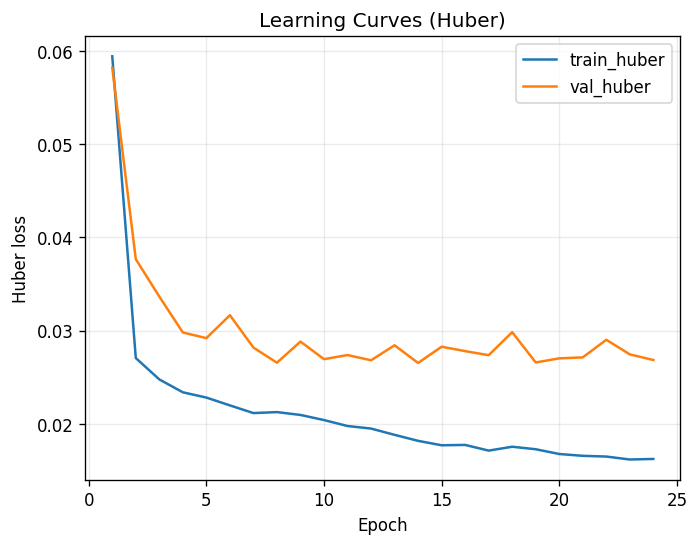

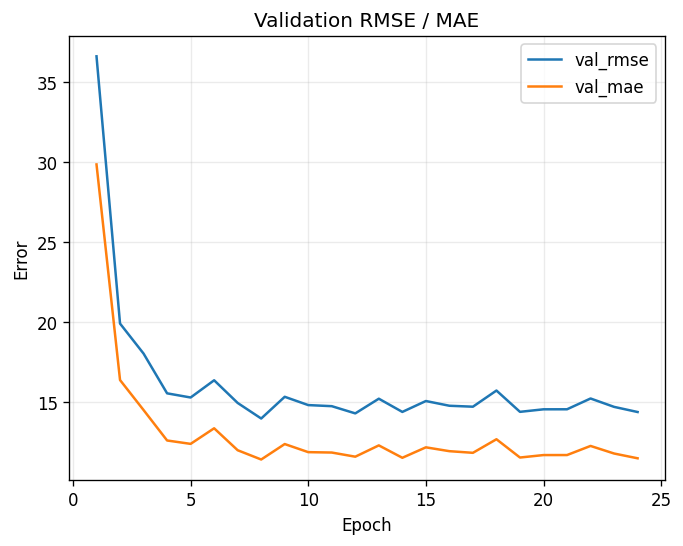

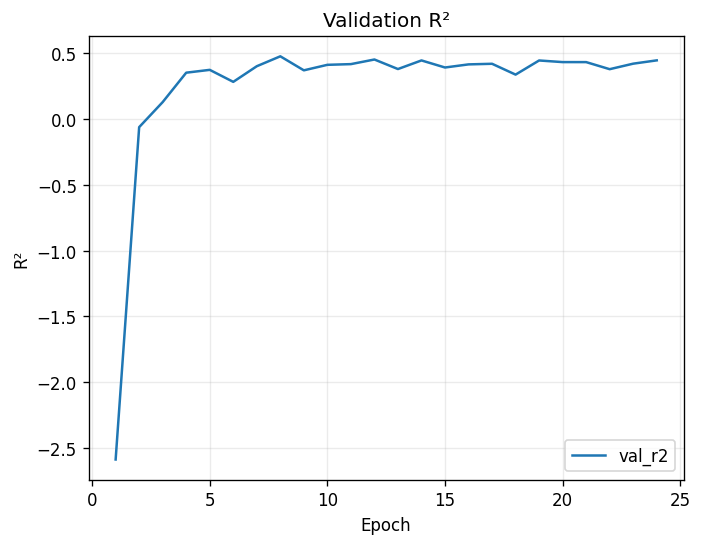

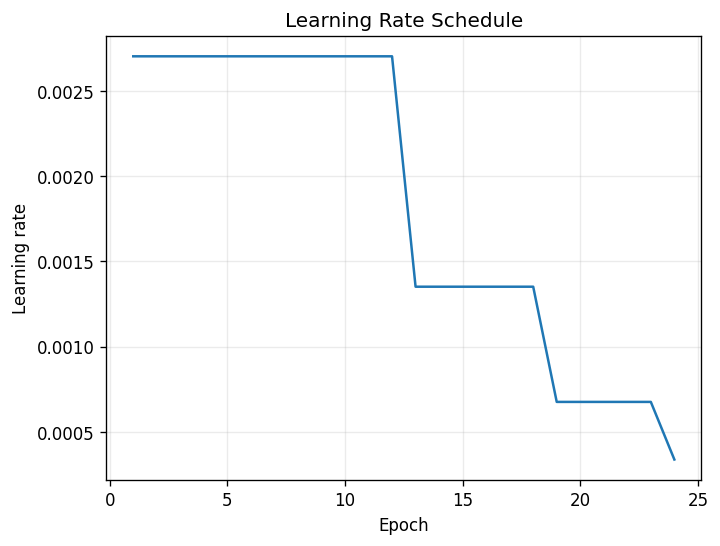

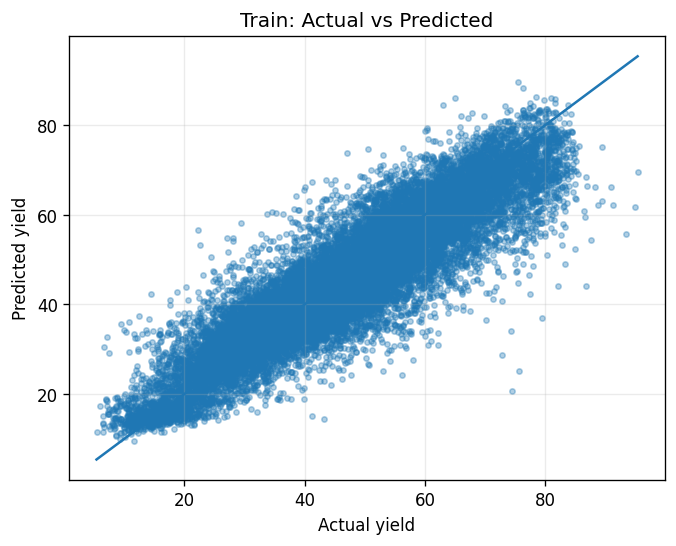

...

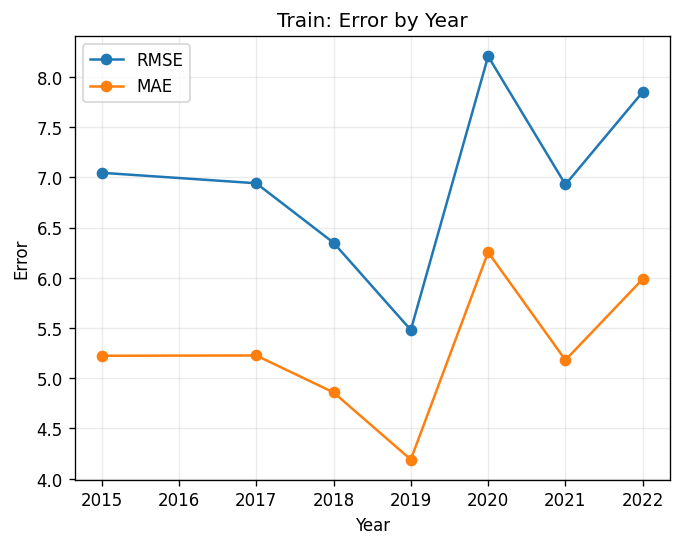

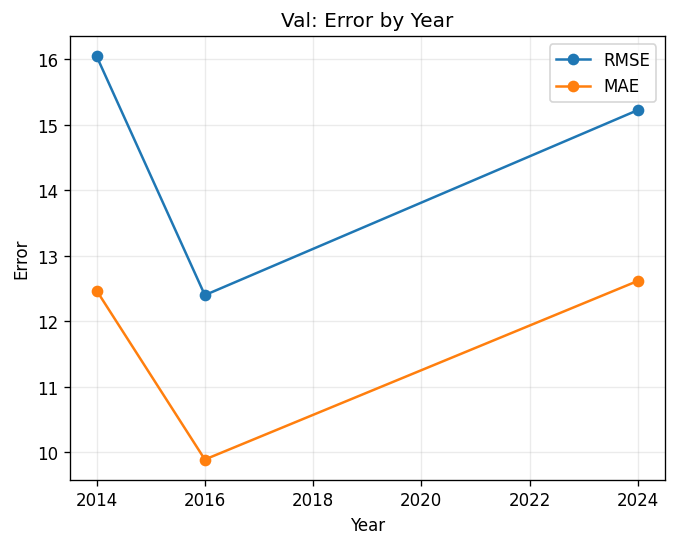

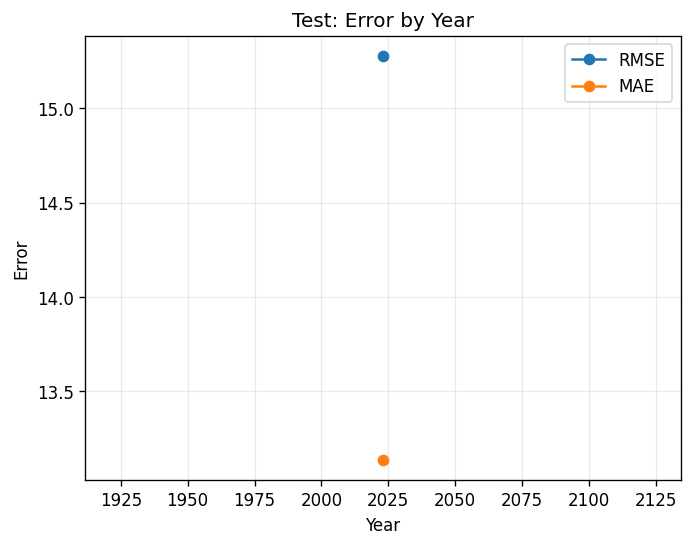

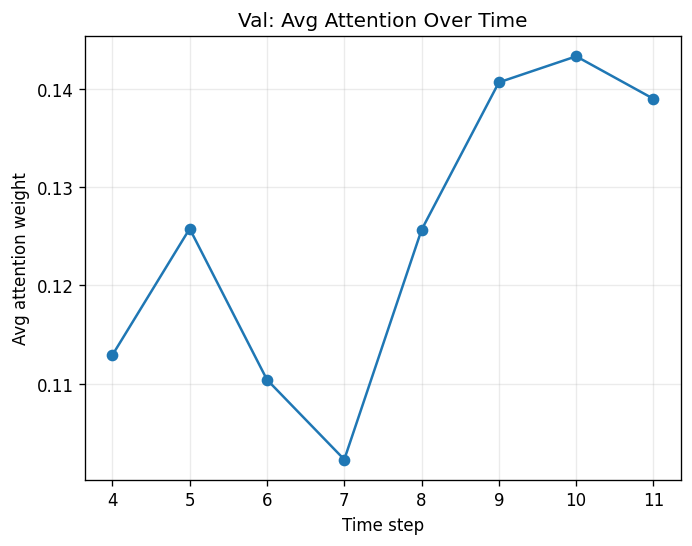

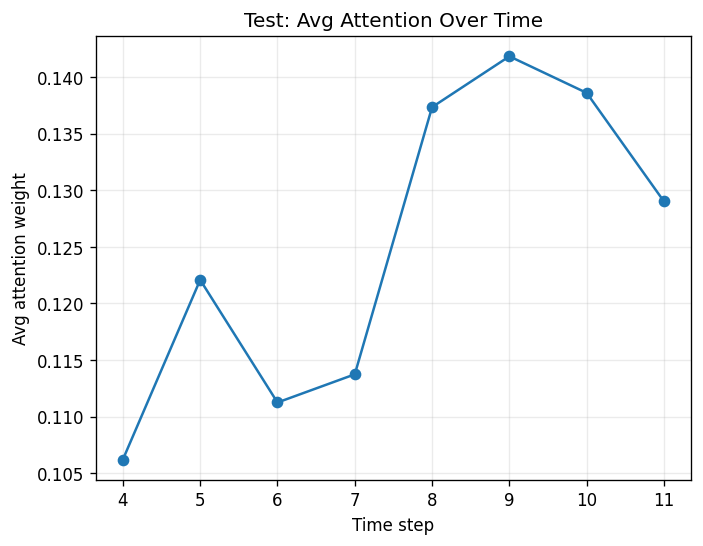

In [ ]:
import matplotlib.pyplot as plt

# ==========================================================
# Evaluation + curves (single-source-of-truth)
# Uses ONLY eval_loader outputs (no predict_loader, no re-metrics)
# ==========================================================

# --- helper: print metrics directly from eval_loader output ---
def print_metrics_from_eval(tag, out):
    m = out["metrics"]
    # NOTE: corr meaning depends on your regression_metrics() definition
    print(f"{tag}: MAE={m['mae']:.4f}  RMSE={m['rmse']:.4f}  R2={m['r2']:.4f}  Corr={m['corr']:.4f}")

# -----------------------------
# A) Training curves from history
# -----------------------------
plot_training_history(history)

# -----------------------------
# B) Evaluate ONCE per split
#    (this is the ONLY forward pass used for all plots/metrics)
# -----------------------------
train_out = eval_loader(model, train_loader, device, loss_fn=None, return_attn=True)
val_out   = eval_loader(model, val_loader,   device, loss_fn=None, return_attn=True)
test_out  = eval_loader(model, test_loader,  device, loss_fn=None, return_attn=True)

# Extract cached arrays (single truth)
y_tr, p_tr, meta_tr, attn_tr = train_out["y_true"], train_out["y_pred"], train_out["meta"], train_out.get("attn", None)
y_va, p_va, meta_va, attn_va = val_out["y_true"],   val_out["y_pred"],   val_out["meta"],   val_out.get("attn", None)
y_te, p_te, meta_te, attn_te = test_out["y_true"],  test_out["y_pred"],  test_out["meta"],  test_out.get("attn", None)

# -----------------------------
# C) Print metrics (no recomputation)
# -----------------------------
print_metrics_from_eval("TRAIN", train_out)
print_metrics_from_eval("VAL  ", val_out)
print_metrics_from_eval("TEST ", test_out)

# -----------------------------
# D) Scatter: actual vs predicted
# -----------------------------
plot_actual_vs_pred(y_tr, p_tr, "Train: Actual vs Predicted")
plot_actual_vs_pred(y_va, p_va, "Val: Actual vs Predicted")
plot_actual_vs_pred(y_te, p_te, "Test: Actual vs Predicted")

# -----------------------------
# E) Residual plots
# -----------------------------
plot_residuals(y_tr, p_tr, "Train")
plot_residuals(y_va, p_va, "Val")
plot_residuals(y_te, p_te, "Test")

# -----------------------------
# F) Flat-line check (sorted curves)
# -----------------------------
plot_sorted_flatline_check(y_te, p_te, "Test: Sorted Actual vs Pred (flat-line check)")

# -----------------------------
# G) Error by year
# -----------------------------
plot_error_by_year(meta_tr, y_tr, p_tr, "Train: Error by Year")
plot_error_by_year(meta_va, y_va, p_va, "Val: Error by Year")
plot_error_by_year(meta_te, y_te, p_te, "Test: Error by Year")

# -----------------------------
# H) Attention diagnostics
# -----------------------------
time_labels = globals().get("SEASON_MONTHS", None)
# (attn_tr, "Train: Avg Attention Over Time", time_labels=time_labels)
plot_attention_mean(attn_va, "Val: Avg Attention Over Time", time_labels=time_labels)
plot_attention_mean(attn_te, "Test: Avg Attention Over Time", time_labels=time_labels)

plt.show()


#

### Fine Tuning the HyperParameters



In [ ]:
!uv add optuna

Resolved 209 packages in 1ms
Uninstalled 13 packages in 481ms
Installed 13 packages in 197ms
 - nvidia-cublas-cu12==12.8.4.1
 + nvidia-cublas-cu12==12.9.1.4
 - nvidia-cuda-cupti-cu12==12.8.90
 + nvidia-cuda-cupti-cu12==12.9.79
 - nvidia-cuda-nvrtc-cu12==12.8.93
 + nvidia-cuda-nvrtc-cu12==12.9.86
 - nvidia-cuda-runtime-cu12==12.8.90
 + nvidia-cuda-runtime-cu12==12.9.79
 - nvidia-cudnn-cu12==9.10.2.21
 + nvidia-cudnn-cu12==9.15.1.9
 - nvidia-cufft-cu12==11.3.3.83
 + nvidia-cufft-cu12==11.4.1.4
 - nvidia-curand-cu12==10.3.9.90
 + nvidia-curand-cu12==10.3.10.19
 - nvidia-cusolver-cu12==11.7.3.90
 + nvidia-cusolver-cu12==11.7.5.82
 - nvidia-cusparse-cu12==12.5.8.93
 + nvidia-cusparse-cu12==12.5.10.65
 - nvidia-nccl-cu12==2.27.5
 + nvidia-nccl-cu12==2.28.7
 - nvidia-nvjitlink-cu12==12.8.93
 + nvidia-nvjitlink-cu12==12.9.86
 - torch==2.9.1
 + torch==2.0.1
 - triton==3.5.1
 + triton==2.0.0


In [ ]:
!pip install optuna

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import copy
import optuna

def set_seed(seed=42):
    import random, os
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def build_model(cfg, C_in, C_static):
    return YieldSpatialCNNLSTM_Attn(
        in_ch=C_in,
        static_in_dim=C_static,
        emb_dim=cfg["emb_dim"],
        lstm_hidden=cfg["lstm_hidden"],
        lstm_layers=cfg.get("lstm_layers", 1),
        attn_dim=cfg.get("attn_dim", 128),
        parallel_dim=cfg["parallel_dim"],
        static_hidden=cfg["static_hidden"],
        head_hidden=cfg["head_hidden"],
        dropout=cfg["dropout"]
)


def train_eval_one_run(cfg, train_loader, val_loader, C_in, C_static, device, seed=42):
    set_seed(seed)

    model = build_model(cfg, C_in, C_static).to(device)

    loss_fn = nn.HuberLoss(delta=cfg["huber_delta"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg["lr"], weight_decay=cfg["wd"])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min",
        factor=cfg["lr_factor"],
        patience=cfg["plateau_patience"],
        min_lr=cfg["min_lr"],
    )

    best_state = None
    best_val = float("inf")
    bad = 0

    for epoch in range(1, cfg["epochs"] + 1):
        train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device)

        val_out = eval_loader(model, val_loader, device, loss_fn=loss_fn)
        val_loss = val_out["loss"]
        val_rmse = val_out["metrics"]["rmse"]

        scheduler.step(val_loss)

        if val_loss < best_val - 1e-6:
            best_val = val_loss
            best_state = copy.deepcopy(model.state_dict())
            bad = 0
        else:
            bad += 1
            if bad >= cfg["early_patience"]:
                break

    if best_state is not None:
        model.load_state_dict(best_state)

    # final metrics at best checkpoint
    final_val = eval_loader(model, val_loader, device, loss_fn=loss_fn)

    result = {
        "val_huber": final_val["loss"],
        "val_rmse": final_val["metrics"]["rmse"],
        "val_r2": final_val["metrics"]["r2"],
        "cfg": cfg
    }
    return result


In [ ]:
def make_loaders_for_patch(patch, BATCH, ts_scaler=None, static_scaler=None):
    train_ds = PixelPatchSeasonDataset(
        train_meta, ts_grid, y_grid, static_lookup, SEASON_MONTHS,
        patch=patch, ts_scaler=ts_scaler, static_scaler=static_scaler
    )
    val_ds = PixelPatchSeasonDataset(
        val_meta, ts_grid, y_grid, static_lookup, SEASON_MONTHS,
        patch=patch, ts_scaler=ts_scaler, static_scaler=static_scaler
    )
    train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True,
                              num_workers=32, pin_memory=torch.cuda.is_available())
    val_loader   = DataLoader(val_ds, batch_size=BATCH, shuffle=False,
                              num_workers=32, pin_memory=torch.cuda.is_available())
    return train_loader, val_loader


In [ ]:
!pip install optuna -q

In [ ]:
from sklearn.preprocessing import StandardScaler

def fit_scalers_from_train(train_meta, ts_grid, static_lookup, season_months, C_in):
    # --- TS scaler: channel-wise mean/std across all train samples & timesteps ---
    # We'll accumulate sums/sumsq/count per channel (fast + no huge arrays)
    sum_c = np.zeros(C_in, dtype=np.float64)
    sumsq_c = np.zeros(C_in, dtype=np.float64)
    count_c = np.zeros(C_in, dtype=np.float64)

    # --- static scaler: use StandardScaler directly (usually not huge) ---
    static_rows = []

    for (field, year, row, col, i, j) in train_meta:
        # static
        static_rows.append(static_lookup[(field, year, row, col)])

        # ts: for each month, read per-channel value at (i,j)
        for m in season_months:
            X_chw = ts_grid[(field, year, int(m))]  # (C,H,W)
            v = X_chw[:, i, j]                      # (C,)
            mask = ~np.isnan(v)
            vv = v[mask].astype(np.float64)
            sum_c[mask] += vv
            sumsq_c[mask] += vv * vv
            count_c[mask] += 1.0

    mean = sum_c / np.maximum(count_c, 1.0)
    var = (sumsq_c / np.maximum(count_c, 1.0)) - mean**2
    std = np.sqrt(np.maximum(var, 1e-12))

    # build a "StandardScaler-like" object for ts to reuse your dataset code
    ts_scaler = StandardScaler()
    ts_scaler.mean_ = mean.astype(np.float32)
    ts_scaler.scale_ = std.astype(np.float32)

    # static scaler (fit train only)
    static_arr = np.asarray(static_rows, dtype=np.float32)
    static_arr = np.nan_to_num(static_arr, nan=0.0)  # consistent with your dataset policy
    static_scaler = StandardScaler().fit(static_arr)

    return ts_scaler, static_scaler


In [ ]:
import optuna

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
C_in = xb.shape[2]
C_static = xs.shape[1]

ts_scaler, static_scaler = fit_scalers_from_train(train_meta, ts_grid, static_lookup, SEASON_MONTHS, C_in)

def objective(trial):
    patch = trial.suggest_categorical("patch", [3, 5])
    batch = trial.suggest_categorical("batch", [256, 512, 1024])
    train_loader, val_loader = make_loaders_for_patch(patch, batch, ts_scaler=ts_scaler, static_scaler=static_scaler)


    cfg = {
        "emb_dim": trial.suggest_categorical("emb_dim", [64, 128, 192, 256]),
        "lstm_hidden": trial.suggest_categorical("lstm_hidden", [128, 256, 384, 512]),
        "parallel_dim": trial.suggest_categorical("parallel_dim", [64, 128, 192, 256]),
        "static_hidden": trial.suggest_categorical("static_hidden", [64, 128, 192, 256]),
        "head_hidden": trial.suggest_categorical("head_hidden", [128, 256, 384]),
        "dropout": trial.suggest_float("dropout", 0.1, 0.6),

        "lr": trial.suggest_float("lr", 1e-5, 3e-3, log=True),
        "wd": trial.suggest_float("wd", 1e-6, 1e-2, log=True),
        "huber_delta": trial.suggest_float("huber_delta", 0.1, 0.5),

        "epochs": 30,                 # keep short for tuning
        "early_patience": 5,
        "plateau_patience": 3,
        "lr_factor": 0.5,
        "min_lr": 1e-6,
    }

    res = train_eval_one_run(cfg, train_loader, val_loader, C_in, C_static, device, seed=42)
    trial.set_user_attr("val_rmse", res["val_rmse"])
    trial.set_user_attr("val_r2", res["val_r2"])
    return res["val_huber"]  # minimize huber loss

sampler = optuna.samplers.TPESampler(
    seed=42,
    multivariate=True,
    group=True
)



study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=50, show_progress_bar=True)

print("Best trial:", study.best_trial.number)
print("Best val_huber:", study.best_value)
print("Best params:", study.best_trial.params)
print("Best RMSE:", study.best_trial.user_attrs["val_rmse"], "R2:", study.best_trial.user_attrs["val_r2"])


/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/optuna/_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/optuna/_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2026-01-21 18:32:32,019] A new study created in memory with name: no-name-7922ba0a-ba52-4bfe-b6c5-9551e5f492a8


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-01-21 18:34:42,465] Trial 0 finished with value: 0.05476774344289744 and parameters: {'patch': 5, 'batch': 256, 'emb_dim': 192, 'lstm_hidden': 384, 'parallel_dim': 256, 'static_hidden': 256, 'head_hidden': 384, 'dropout': 0.32803499210851794, 'lr': 0.0008810003129071785, 'wd': 6.290644294586145e-06, 'huber_delta': 0.3056937753654446}. Best is trial 0 with value: 0.05476774344289744.
[I 2026-01-21 18:37:00,836] Trial 1 finished with value: 0.06439814399237986 and parameters: {'patch': 3, 'batch': 256, 'emb_dim': 128, 'lstm_hidden': 256, 'parallel_dim': 192, 'static_hidden': 64, 'head_hidden': 256, 'dropout': 0.5697494707820946, 'lr': 0.0016466293382966786, 'wd': 0.0002463768595899747, 'huber_delta': 0.4687496940092467}. Best is trial 0 with value: 0.05476774344289744.
[I 2026-01-21 18:39:51,384] Trial 2 finished with value: 0.03600697937820639 and parameters: {'patch': 5, 'batch': 1024, 'emb_dim': 128, 'lstm_hidden': 384, 'parallel_dim': 64, 'static_hidden': 64, 'head_hidden': 2

In [ ]:
study.best_trial.params

{'patch': 3,
 'batch': 256,
 'emb_dim': 256,
 'lstm_hidden': 256,
 'parallel_dim': 192,
 'static_hidden': 256,
 'head_hidden': 384,
 'dropout': 0.49802211788643497,
 'lr': 0.0009481237713256711,
 'wd': 4.736585938046523e-06,
 'huber_delta': 0.10009797224486407}

In [ ]:
# best_params = {'patch': 3,
#  'batch': 256,
#  'emb_dim': 192,
#  'lstm_hidden': 256,
#  'parallel_dim': 256,
#  'static_hidden': 256,
#  'head_hidden': 384,
#  'dropout': 0.41389914721854065,
#  'lr': 0.002703005857254204,
#  'wd': 2.8063805839762486e-06,
#  'huber_delta': 0.10205082194748391}

In [ ]:
best_params = {'patch': 3,
 'batch': 256,
 'emb_dim': 256,
 'lstm_hidden': 256,
 'parallel_dim': 192,
 'static_hidden': 256,
 'head_hidden': 384,
 'dropout': 0.49802211788643497,
 'lr': 0.0009481237713256711,
 'wd': 4.736585938046523e-06,
 'huber_delta': 0.10009797224486407}

In [ ]:
# best_params = study.best_trial.params


import optuna
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
C_in = xb.shape[2]
C_static = xs.shape[1]

# ---- helper: neighbors for categorical dims ----
def neighbors(val, choices):
    choices = sorted(list(set(choices)))
    if val not in choices:
        # fallback: closest
        val = min(choices, key=lambda x: abs(x - val))
    k = choices.index(val)
    out = set([val])
    if k - 1 >= 0: out.add(choices[k-1])
    if k + 1 < len(choices): out.add(choices[k+1])
    return sorted(out)

# ---- pull best coarse params ----
# best_params = study.best_trial.params  # from coarse study
print("Coarse best params:", best_params)

best_patch = best_params.get("patch", 5)
best_batch = best_params.get("batch", 512)

# candidate grids for discrete model params (must match what you allow in coarse)
EMB_CHOICES = [64, 128, 192, 256]
HID_CHOICES = [128, 256, 384, 512]
PAR_CHOICES = [64, 128, 192, 256]
STA_CHOICES = [64, 128, 192, 256]
HEAD_CHOICES = [128, 256, 384]

emb_candidates  = neighbors(best_params["emb_dim"], EMB_CHOICES)
hid_candidates  = neighbors(best_params["lstm_hidden"], HID_CHOICES)
par_candidates  = neighbors(best_params["parallel_dim"], PAR_CHOICES)
sta_candidates  = neighbors(best_params["static_hidden"], STA_CHOICES)
head_candidates = neighbors(best_params["head_hidden"], HEAD_CHOICES)

# ---- narrow ranges around best continuous params ----
best_lr = float(best_params["lr"])
best_wd = float(best_params["wd"])
best_drop = float(best_params["dropout"])
best_delta = float(best_params["huber_delta"])

lr_low, lr_high = best_lr * 0.5, best_lr * 2.0
wd_low, wd_high = best_wd * 0.5, best_wd * 2.0

drop_low  = max(0.05, best_drop - 0.10)
drop_high = min(0.65, best_drop + 0.10)

# huber delta: narrow range too (or keep fixed)
best_delta = float(best_params["huber_delta"])
delta_low  = max(0.05, best_delta * 0.7)
delta_high = min(1.5,  best_delta * 1.3)
if delta_low > delta_high:
    delta_low, delta_high = delta_high, delta_low


print("Fine search ranges:")
print(" patch locked:", best_patch, "| batch locked:", best_batch)
print(" lr:", lr_low, "to", lr_high)
print(" wd:", wd_low, "to", wd_high)
print(" dropout:", drop_low, "to", drop_high)
print(" huber_delta:", delta_low, "to", delta_high)
print(" emb candidates:", emb_candidates)
print(" lstm_hidden candidates:", hid_candidates)

# ---- loaders are patch-dependent, so build once and reuse ----
ts_scaler_f, static_scaler_f = fit_scalers_from_train(train_meta, ts_grid, static_lookup, SEASON_MONTHS, C_in)
train_loader_f, val_loader_f = make_loaders_for_patch(best_patch, best_batch, ts_scaler=ts_scaler_f, static_scaler=static_scaler_f)

def objective_fine(trial):
    cfg = {
        # lock patch+batch here; dataset already created
        "emb_dim": trial.suggest_categorical("emb_dim", emb_candidates),
        "lstm_hidden": trial.suggest_categorical("lstm_hidden", hid_candidates),
        "parallel_dim": trial.suggest_categorical("parallel_dim", par_candidates),
        "static_hidden": trial.suggest_categorical("static_hidden", sta_candidates),
        "head_hidden": trial.suggest_categorical("head_hidden", head_candidates),

        "lstm_layers": trial.suggest_categorical("lstm_layers", [1, 2, 3]),
        "attn_dim": trial.suggest_categorical("attn_dim", [64, 128, 256]),


        "dropout": trial.suggest_float("dropout", drop_low, drop_high),

        # fine continuous
        "lr": trial.suggest_float("lr", lr_low, lr_high, log=True),
        "wd": trial.suggest_float("wd", wd_low, wd_high, log=True),
        "huber_delta": trial.suggest_float("huber_delta", delta_low, delta_high),

        # scheduler/epochs can be slightly longer in fine stage
        "epochs": 45,
        "early_patience": 8,
        "lr_factor": trial.suggest_categorical("lr_factor", [0.5, 0.3, 0.2]),
        "plateau_patience": trial.suggest_categorical("plateau_patience", [2, 3, 5]),
        "min_lr": 1e-6,
    }

    res = train_eval_one_run(cfg, train_loader_f, val_loader_f, C_in, C_static, device, seed=42)
    trial.set_user_attr("val_rmse", res["val_rmse"])
    trial.set_user_attr("val_r2", res["val_r2"])
    return res["val_huber"]

sampler = optuna.samplers.TPESampler(
    seed=42,
    multivariate=True,
    group=True
)



study_fine = optuna.create_study(direction="minimize", sampler=sampler)
study_fine.optimize(objective_fine, n_trials=50, show_progress_bar=True)

print("\n===== FINE BEST =====")
print("Best val_huber:", study_fine.best_value)
print("Best params:", study_fine.best_trial.params)
print("Best RMSE:", study_fine.best_trial.user_attrs["val_rmse"], "R2:", study_fine.best_trial.user_attrs["val_r2"])

# final combined best config (merge best fine params with fixed training settings)
best_cfg_fine = {
    "emb_dim": study_fine.best_trial.params["emb_dim"],
    "lstm_hidden": study_fine.best_trial.params["lstm_hidden"],
    "parallel_dim": study_fine.best_trial.params["parallel_dim"],
    "static_hidden": study_fine.best_trial.params["static_hidden"],
    "head_hidden": study_fine.best_trial.params["head_hidden"],
    "lstm_layers": study_fine.best_trial.params["lstm_layers"],   # ✅ add
    "attn_dim": study_fine.best_trial.params["attn_dim"],         # ✅ add

    "dropout": study_fine.best_trial.params["dropout"],
    "lr": study_fine.best_trial.params["lr"],
    "wd": study_fine.best_trial.params["wd"],
    "huber_delta": study_fine.best_trial.params["huber_delta"],

    "lr_factor": study_fine.best_trial.params["lr_factor"],       # ✅ add
    "plateau_patience": study_fine.best_trial.params["plateau_patience"],  # ✅ add

    "epochs": 150,
    "early_patience": 20,
    "min_lr": 1e-6,
}
best_cfg_fine["patch"] = best_patch
best_cfg_fine["batch"] = best_batch

print("\nBest cfg (ready for final fit):", best_cfg_fine)


/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/optuna/_experimental.py:32: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/optuna/_experimental.py:32: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2026-01-21 22:44:01,889] A new study created in memory with name: no-name-b50b504b-3101-45b4-96c2-fcd338a7b98a


Coarse best params: {'patch': 3, 'batch': 256, 'emb_dim': 256, 'lstm_hidden': 256, 'parallel_dim': 192, 'static_hidden': 256, 'head_hidden': 384, 'dropout': 0.49802211788643497, 'lr': 0.0009481237713256711, 'wd': 4.736585938046523e-06, 'huber_delta': 0.10009797224486407}
Fine search ranges:
 patch locked: 3 | batch locked: 256
 lr: 0.00047406188566283556 to 0.0018962475426513423
 wd: 2.3682929690232617e-06 to 9.473171876093047e-06
 dropout: 0.39802211788643493 to 0.598022117886435
 huber_delta: 0.07006858057140485 to 0.1301273639183233
 emb candidates: [192, 256]
 lstm_hidden candidates: [128, 256, 384]


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2026-01-21 22:45:16,544] Trial 0 finished with value: 0.023500613799249684 and parameters: {'emb_dim': 256, 'lstm_hidden': 128, 'parallel_dim': 256, 'static_hidden': 256, 'head_hidden': 384, 'lstm_layers': 1, 'attn_dim': 256, 'dropout': 0.4844111216148581, 'lr': 0.0007098595889909168, 'wd': 5.531049868670815e-06, 'huber_delta': 0.07844641212653106, 'lr_factor': 0.2, 'plateau_patience': 2}. Best is trial 0 with value: 0.023500613799249684.
[I 2026-01-21 22:48:01,414] Trial 1 finished with value: 0.021407831667198077 and parameters: {'emb_dim': 192, 'lstm_hidden': 128, 'parallel_dim': 192, 'static_hidden': 192, 'head_hidden': 256, 'lstm_layers': 2, 'attn_dim': 64, 'dropout': 0.4603643331043171, 'lr': 0.0009748710821313169, 'wd': 5.0534481224657805e-06, 'huber_delta': 0.08117071426652504, 'lr_factor': 0.5, 'plateau_patience': 5}. Best is trial 1 with value: 0.021407831667198077.
[I 2026-01-21 22:49:39,585] Trial 2 finished with value: 0.019845101602927403 and parameters: {'emb_dim': 25

In [ ]:
best_cfg_fine

## LOYO test Results:


In [37]:
best_cfg_fine =  {'emb_dim': 256,
  'lstm_hidden': 256,
  'parallel_dim': 128,
  'static_hidden': 256,
  'head_hidden': 384,
  'lstm_layers': 2,
  'attn_dim': 256,
  'dropout': 0.4411394779504331,
  'lr': 0.001115212405539561,
  'wd': 4.114664881579422e-06,
  'huber_delta': 0.07119369977940959,
  'lr_factor': 0.3,
  'plateau_patience': 2,
  'epochs': 150,
  'early_patience': 20,
  'min_lr': 1e-06,
  'patch': 3,
  'batch': 256}

### Soybeans

In [38]:
ALL_YEARS = list(range(2014, 2025))
BASE_VAL_YEARS = {2014, 2016, 2024}   # your fixed validation years
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Make sure this matches your notebook behavior
LOG_TARGET = True  # ensure your eval_loader converts log->original using y_from_model



In [39]:

# ------------------------------------------------------------
# Build loaders from arbitrary meta lists (no globals needed)
# ------------------------------------------------------------
def make_loaders_from_meta(train_meta, val_meta, test_meta, patch, batch, ts_scaler, static_scaler):
    train_ds = PixelPatchSeasonDataset(
        train_meta, ts_grid, y_grid, static_lookup, SEASON_MONTHS,
        patch=patch, ts_scaler=ts_scaler, static_scaler=static_scaler
    )
    val_ds = PixelPatchSeasonDataset(
        val_meta, ts_grid, y_grid, static_lookup, SEASON_MONTHS,
        patch=patch, ts_scaler=ts_scaler, static_scaler=static_scaler
    )
    test_ds = PixelPatchSeasonDataset(
        test_meta, ts_grid, y_grid, static_lookup, SEASON_MONTHS,
        patch=patch, ts_scaler=ts_scaler, static_scaler=static_scaler
    )

    train_loader = DataLoader(train_ds, batch_size=batch, shuffle=True,
                              num_workers=32, pin_memory=torch.cuda.is_available())
    val_loader   = DataLoader(val_ds, batch_size=batch, shuffle=False,
                              num_workers=32, pin_memory=torch.cuda.is_available())
    test_loader  = DataLoader(test_ds, batch_size=batch, shuffle=False,
                              num_workers=32, pin_memory=torch.cuda.is_available())
    return train_loader, val_loader, test_loader




In [40]:

# ------------------------------------------------------------
# Train with history + early stopping (same logic as your notebook)
# ------------------------------------------------------------
def train_with_history(cfg, train_loader, val_loader, C_in, C_static, device, seed=42):
    set_seed(seed)
    model = build_model(cfg, C_in, C_static).to(device)

    loss_fn = nn.HuberLoss(delta=cfg["huber_delta"])
    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg["lr"], weight_decay=cfg["wd"])

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min",
        factor=cfg["lr_factor"],
        patience=cfg["plateau_patience"],
        min_lr=cfg["min_lr"],
    )

    best_state = None
    best_val = float("inf")
    bad = 0
    history = []

    for epoch in range(1, cfg["epochs"] + 1):
        train_huber = train_one_epoch(model, train_loader, optimizer, loss_fn, device)

        val_out = eval_loader(model, val_loader, device, loss_fn=loss_fn)
        val_huber = val_out["loss"]
        val_metrics = val_out["metrics"]

        # scheduler on validation huber
        scheduler.step(val_huber)

        history.append({
            "epoch": epoch,
            "lr": float(optimizer.param_groups[0]["lr"]),
            "train_huber": float(train_huber),
            "val_huber": float(val_huber),
            "val_rmse": float(val_metrics["rmse"]),
            "val_mae": float(val_metrics["mae"]),
            "val_r2": float(val_metrics["r2"]),
            "val_corr": float(val_metrics.get("corr", np.nan)),
        })

        if val_huber < best_val - 1e-6:
            best_val = val_huber
            best_state = copy.deepcopy(model.state_dict())
            bad = 0
        else:
            bad += 1
            if bad >= cfg["early_patience"]:
                break

    if best_state is not None:
        model.load_state_dict(best_state)

    return model, history


In [41]:

# ------------------------------------------------------------
# Split builder for LOYO
# ------------------------------------------------------------
def split_meta_for_loyo(meta, test_year, base_val_years):
    years = np.array([r[1] for r in meta], dtype=int)

    val_years = set(base_val_years)
    if test_year in val_years:
        val_years.remove(test_year)  # remove LOYO year from validation

    idx_test = np.where(years == test_year)[0]
    idx_val  = np.where(np.isin(years, list(val_years)))[0]
    idx_train = np.where((years != test_year) & (~np.isin(years, list(val_years))))[0]

    train_meta = [meta[i] for i in idx_train]
    val_meta   = [meta[i] for i in idx_val]
    test_meta  = [meta[i] for i in idx_test]
    return train_meta, val_meta, test_meta, val_years


In [42]:
def run_loyo_all_years(best_cfg, out_dir="loyo_runs", years=ALL_YEARS, base_val_years=BASE_VAL_YEARS, seed=42):
    os.makedirs(out_dir, exist_ok=True)

    C_in = xb.shape[2]
    C_static = xs.shape[1]

    results = []

    for test_year in years:
        print(f"\n================ LOYO TEST YEAR = {test_year} ================\n")

        train_meta, val_meta, test_meta, val_years_used = split_meta_for_loyo(meta, test_year, base_val_years)

        print("Train size:", len(train_meta))
        print("Val years:", sorted(list(val_years_used)), " Val size:", len(val_meta))
        print("Test size:", len(test_meta))

        # Fit scalers on TRAIN ONLY (critical for LOYO correctness)
        ts_scaler, static_scaler = fit_scalers_from_train(train_meta, ts_grid, static_lookup, SEASON_MONTHS, C_in)

        # Loaders (use tuned patch/batch)
        patch = best_cfg["patch"]
        batch = best_cfg["batch"]
        train_loader, val_loader, test_loader = make_loaders_from_meta(
            train_meta, val_meta, test_meta, patch, batch, ts_scaler, static_scaler
        )

        # Train
        model, history = train_with_history(best_cfg, train_loader, val_loader, C_in, C_static, DEVICE, seed=seed)


        # Eval train/val/test (your eval_loader already converts log->original if LOG_TARGET True)
        loss_fn = nn.HuberLoss(delta=best_cfg["huber_delta"])

        train_out = eval_loader(model, train_loader, DEVICE, loss_fn=loss_fn)
        val_out   = eval_loader(model, val_loader, DEVICE, loss_fn=loss_fn)
        test_out  = eval_loader(model, test_loader, DEVICE, loss_fn=loss_fn)

        # Save plots for this year
        year_dir = os.path.join(out_dir, f"test_{test_year}")
        os.makedirs(year_dir, exist_ok=True)

        # training curve
        plot_training_history(history)

        # predictions + residuals (using your helper plots)
        plot_actual_vs_pred(test_out["y_true"], test_out["y_pred"], title=f"LOYO {test_year} — Test Actual vs Pred")
        plot_residuals(test_out["y_true"], test_out["y_pred"], title_prefix=f"LOYO {test_year} — Test Residuals")

        # optional “flatline” check
        plot_sorted_flatline_check(test_out["y_true"], test_out["y_pred"], title=f"LOYO {test_year} — Flatline Check")

        # attention summary (if you want it)
        attn_out = eval_loader(model, test_loader, DEVICE, loss_fn=loss_fn, return_attn=True)
        if attn_out.get("attn", None) is not None:
            plot_attention_mean(attn_out["attn"], title=f"LOYO {test_year} — Mean Attention")

        plt.show()

        # collect metrics
        res_row = {
            "test_year": test_year,
            "val_years_used": ",".join(map(str, sorted(list(val_years_used)))),

            "train_rmse": train_out["metrics"]["rmse"],
            "train_mae":  train_out["metrics"]["mae"],
            "train_r2":   train_out["metrics"]["r2"],
            "train_corr": train_out["metrics"].get("corr", np.nan),

            "val_rmse": val_out["metrics"]["rmse"],
            "val_mae":  val_out["metrics"]["mae"],
            "val_r2":   val_out["metrics"]["r2"],
            "val_corr": val_out["metrics"].get("corr", np.nan),

            "test_rmse": test_out["metrics"]["rmse"],
            "test_mae":  test_out["metrics"]["mae"],
            "test_r2":   test_out["metrics"]["r2"],
            "test_corr": test_out["metrics"].get("corr", np.nan),
        }
        print("============================")
        print(res_row)
        print("============================")
        results.append(res_row)

        # save a csv per year + global later
        pd.DataFrame([res_row]).to_csv(os.path.join(year_dir, "metrics.csv"), index=False)

    results_df = pd.DataFrame(results).sort_values("test_year")
    results_df.to_csv(os.path.join(out_dir, "loyo_summary.csv"), index=False)

    # optional: error-by-year plot across all LOYO test years (if your function expects arrays)
    # plot_error_by_year(results_df["test_year"].values, results_df["test_rmse"].values, ...)

    return results_df



In [43]:
best_cfg_fine

{'emb_dim': 256,
 'lstm_hidden': 256,
 'parallel_dim': 128,
 'static_hidden': 256,
 'head_hidden': 384,
 'lstm_layers': 2,
 'attn_dim': 256,
 'dropout': 0.4411394779504331,
 'lr': 0.001115212405539561,
 'wd': 4.114664881579422e-06,
 'huber_delta': 0.07119369977940959,
 'lr_factor': 0.3,
 'plateau_patience': 2,
 'epochs': 150,
 'early_patience': 20,
 'min_lr': 1e-06,
 'patch': 3,
 'batch': 256}


================ LOYO TEST YEAR = 2014 ================

Train size: 23466
Val years: [2016, 2024]  Val size: 5216
Test size: 1453


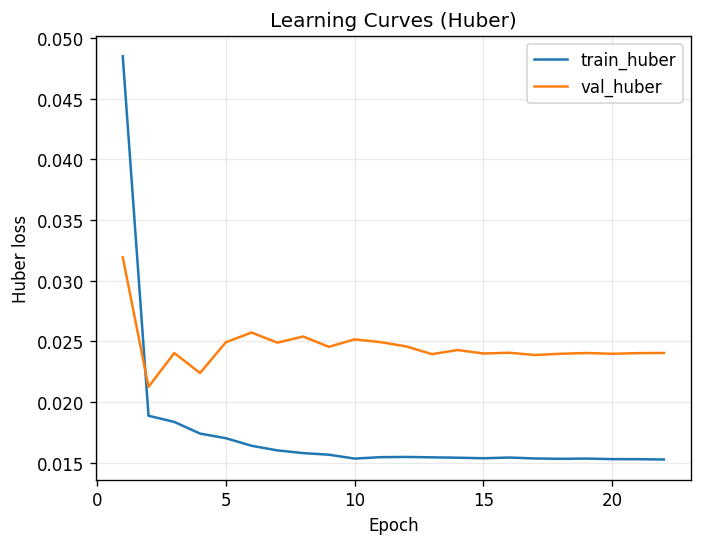

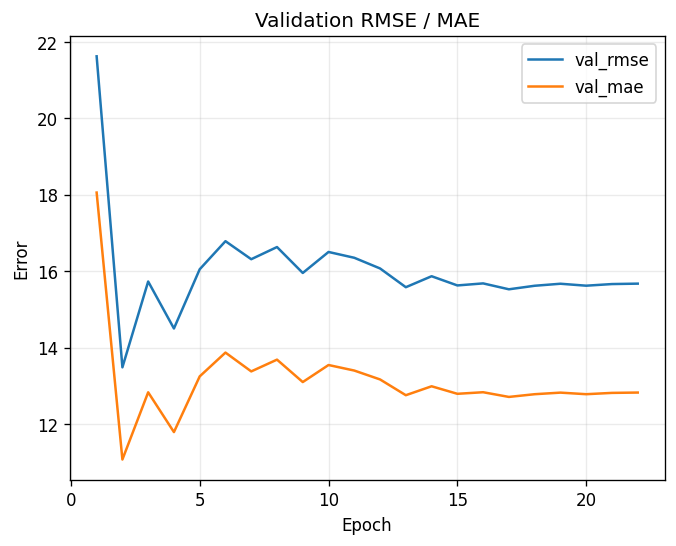

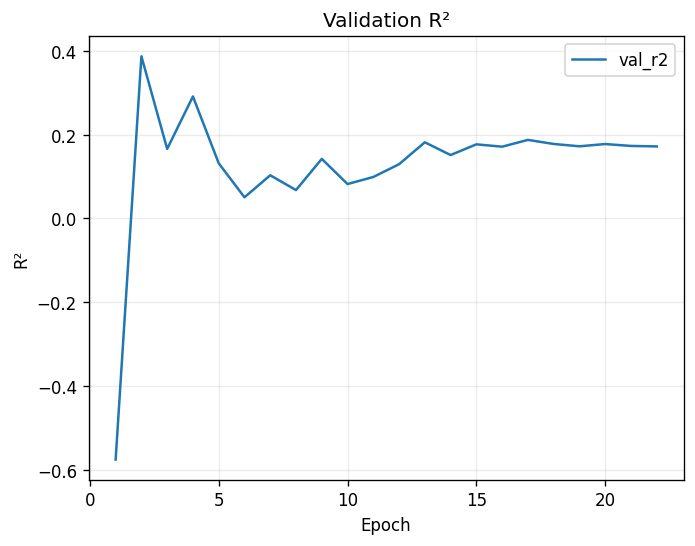

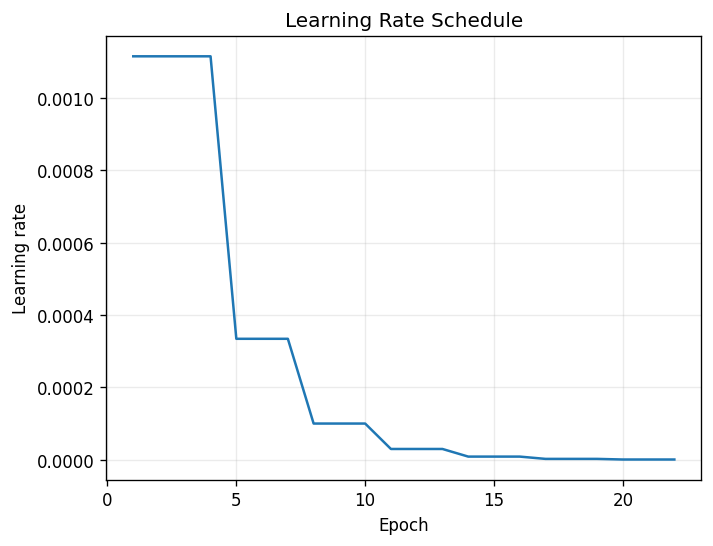

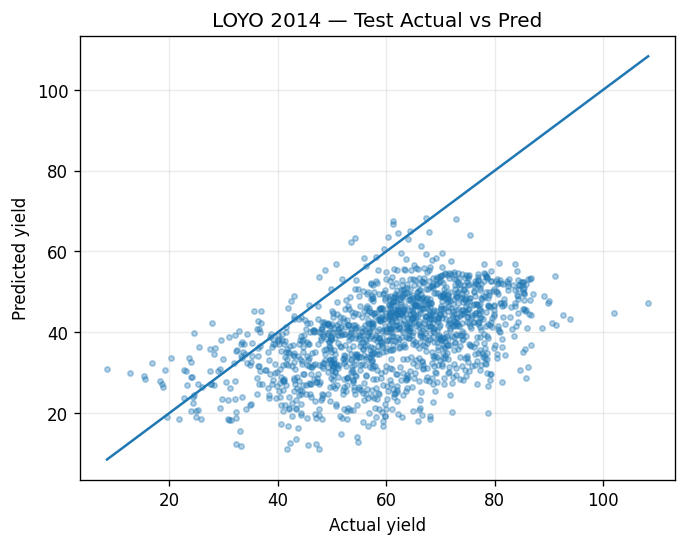

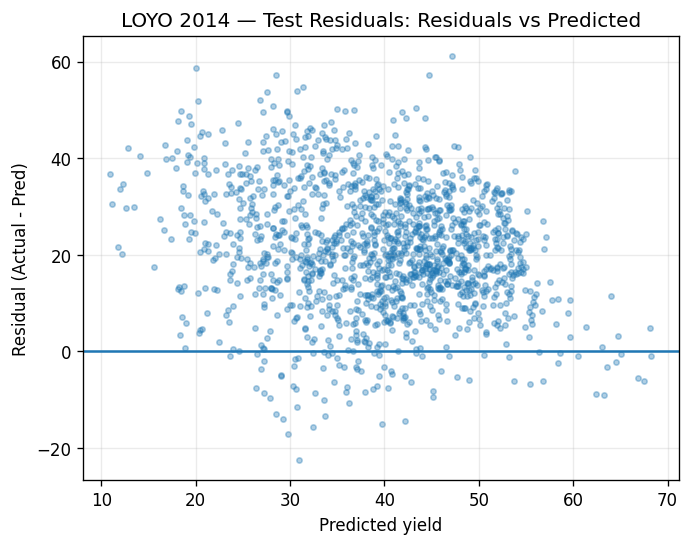

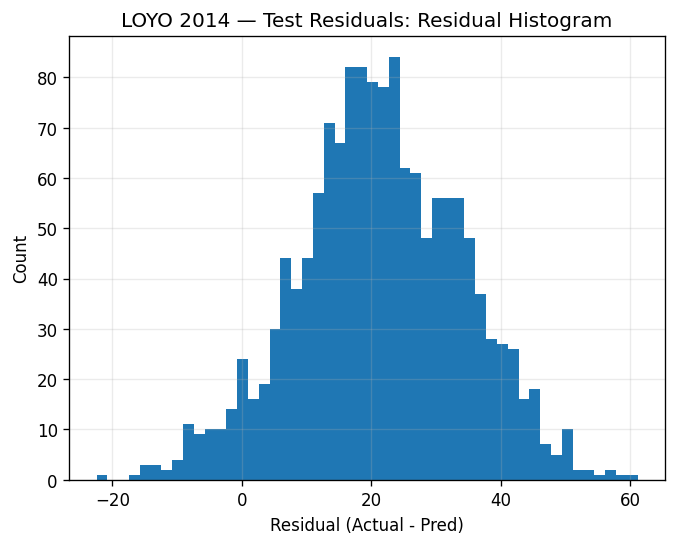

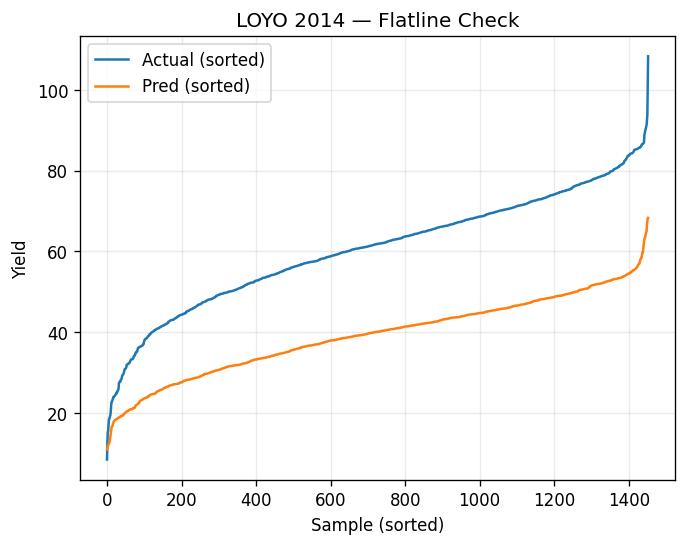

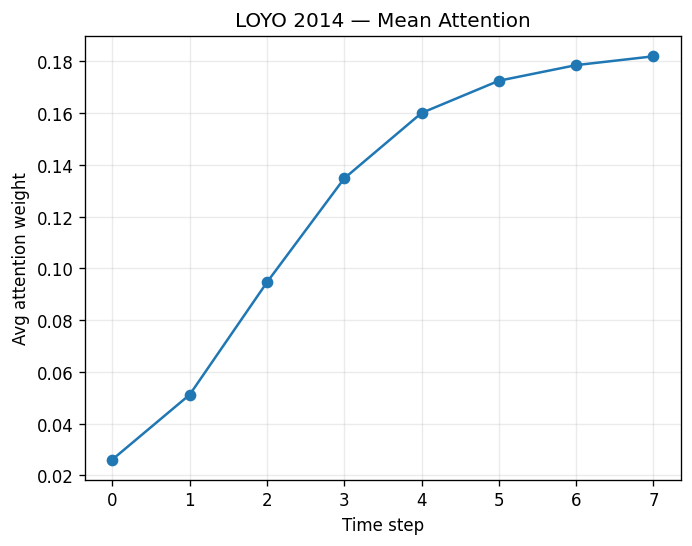

{'test_year': 2014, 'val_years_used': '2016,2024', 'train_rmse': 10.2804, 'train_mae': 7.808891, 'train_r2': 0.5845307187361373, 'train_corr': 0.7982633256617832, 'val_rmse': 13.481234, 'val_mae': 11.069546, 'val_r2': 0.38730480325693617, 'val_corr': 0.6416908684338812, 'test_rmse': 24.848759, 'test_mae': 21.917557, 'test_r2': -1.981111586224284, 'test_corr': 0.497828014630244}

================ LOYO TEST YEAR = 2015 ================

Train size: 20404
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 3062


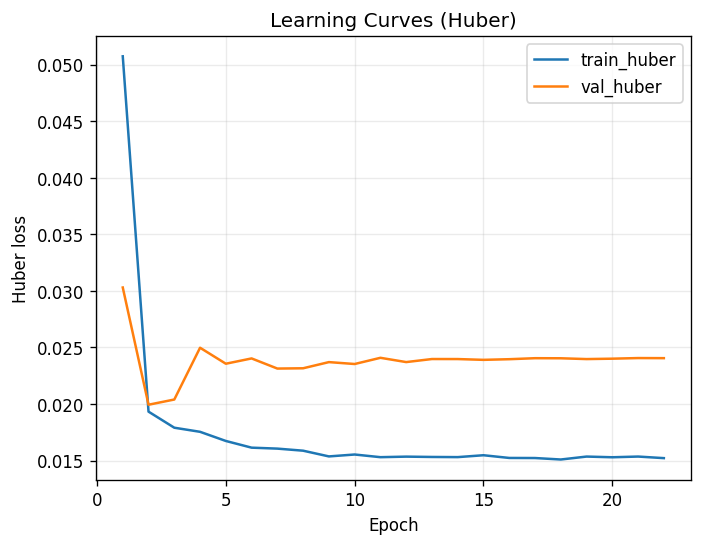

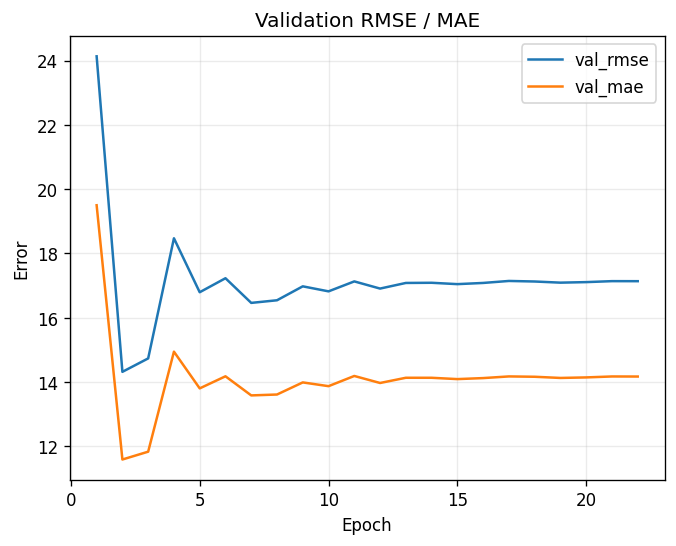

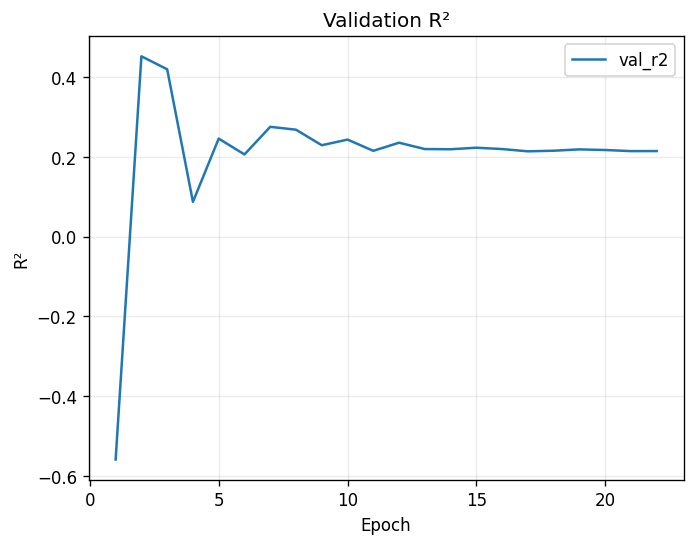

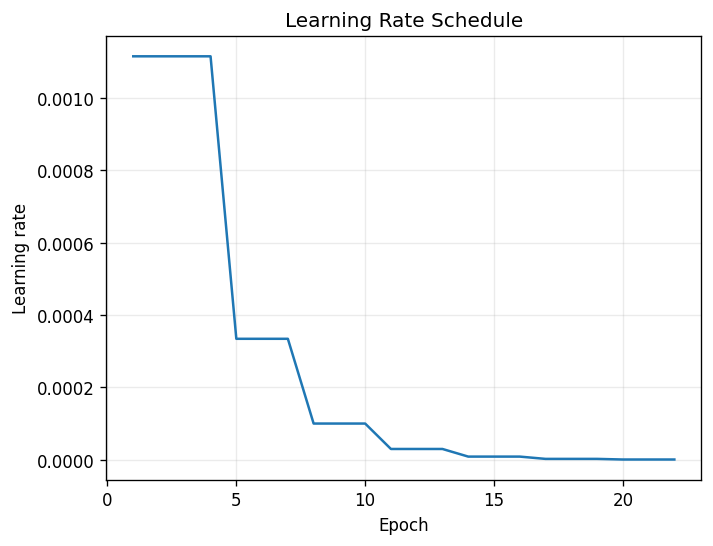

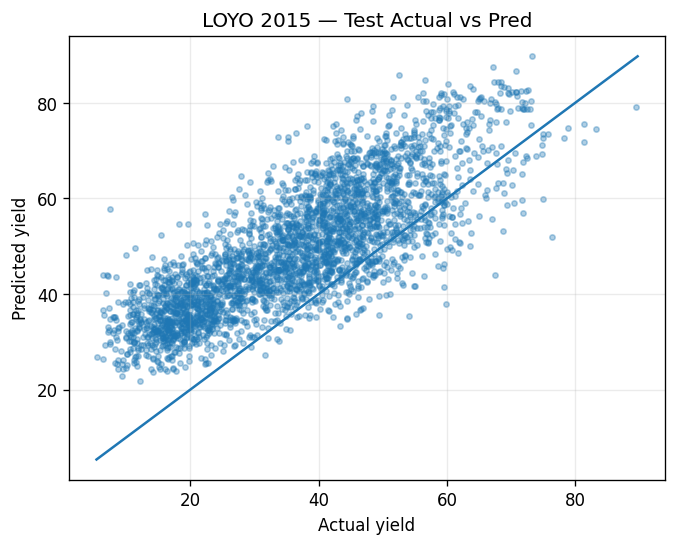

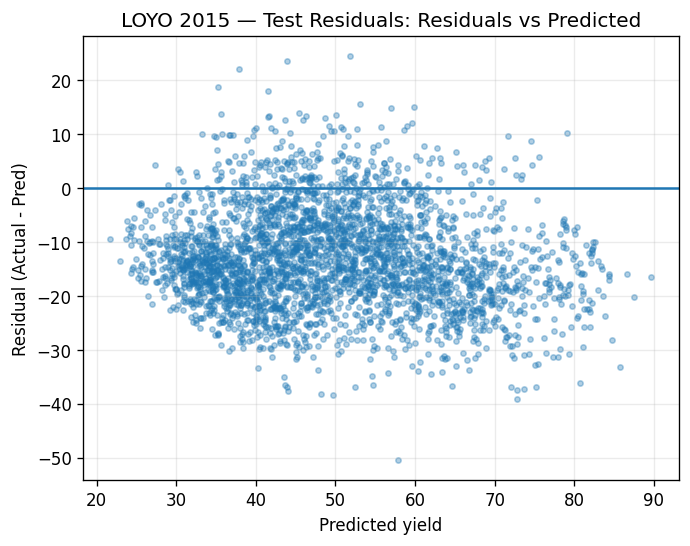

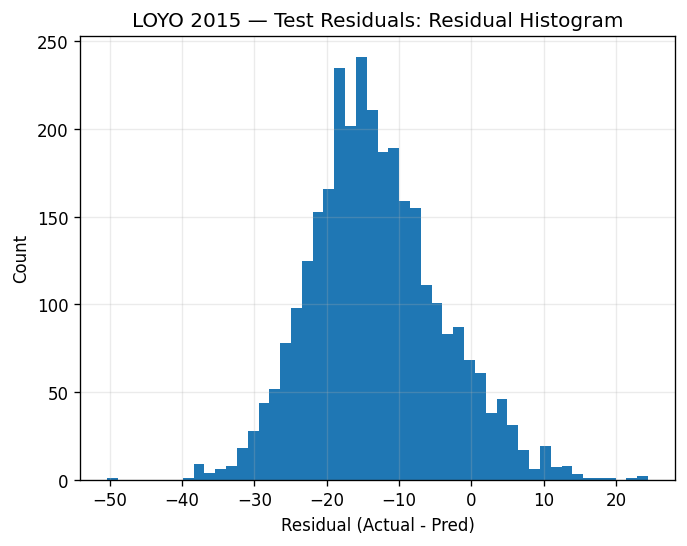

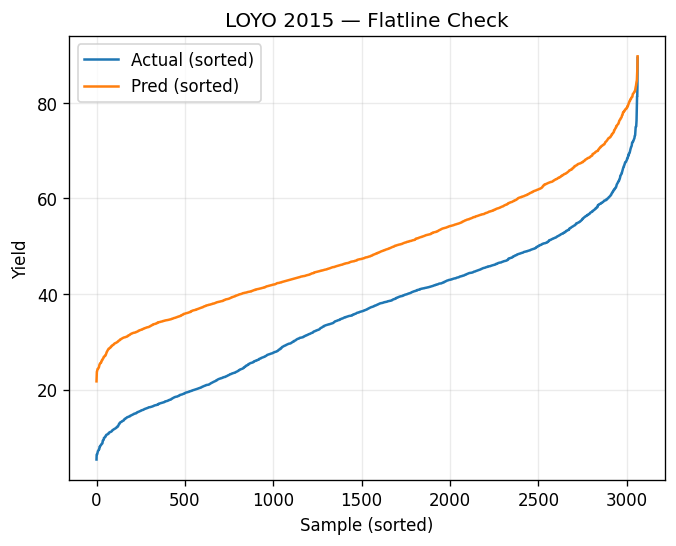

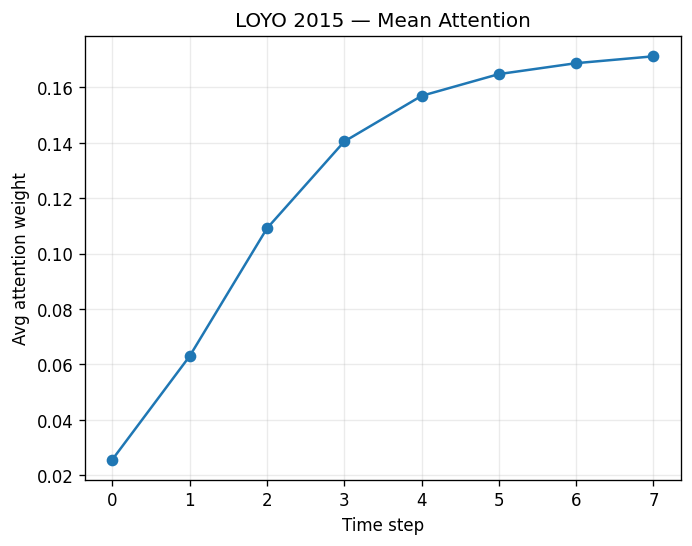

{'test_year': 2015, 'val_years_used': '2014,2016,2024', 'train_rmse': 10.192605, 'train_mae': 7.7810683, 'train_r2': 0.566152637979151, 'train_corr': 0.7688169079928321, 'val_rmse': 14.316141, 'val_mae': 11.588639, 'val_r2': 0.4516349059434859, 'val_corr': 0.7218652632199202, 'test_rmse': 15.994945, 'test_mae': 14.024204, 'test_r2': -0.13650939880473634, 'test_corr': 0.801127777752455}

================ LOYO TEST YEAR = 2016 ================

Train size: 23466
Val years: [2014, 2024]  Val size: 4122
Test size: 2547


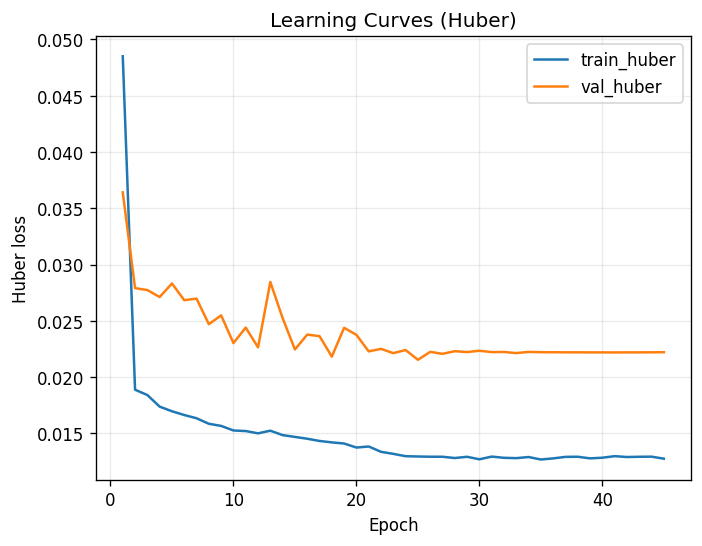

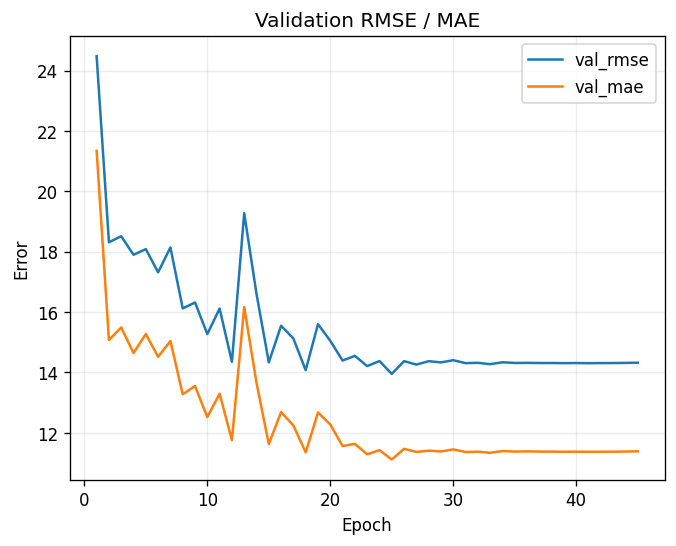

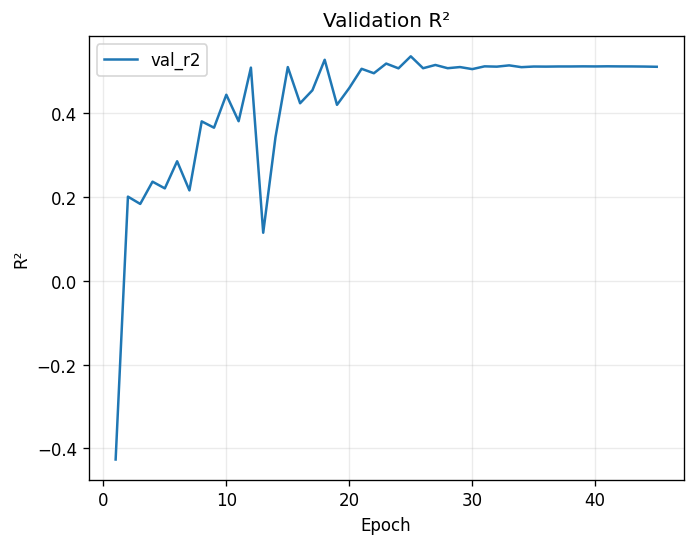

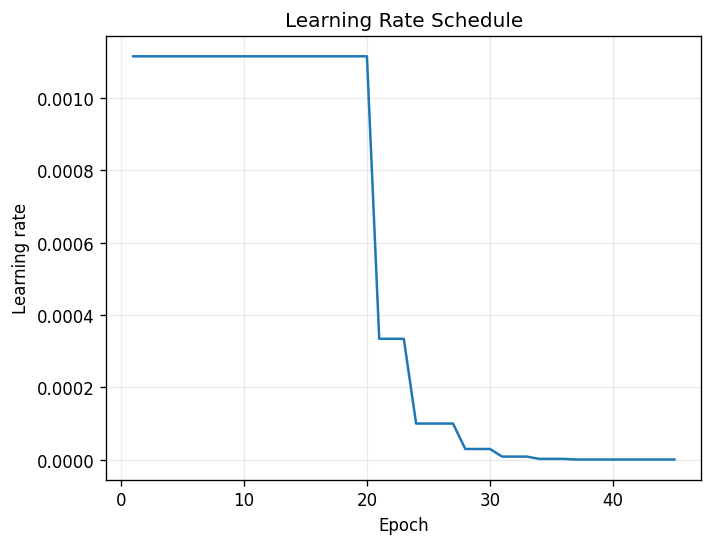

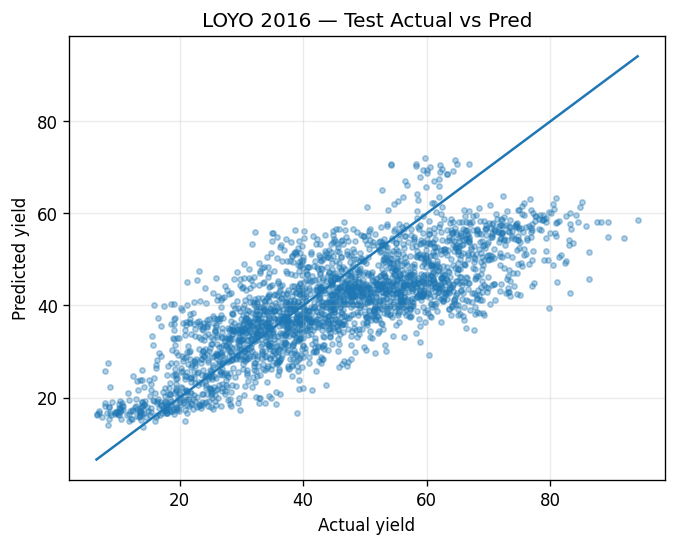

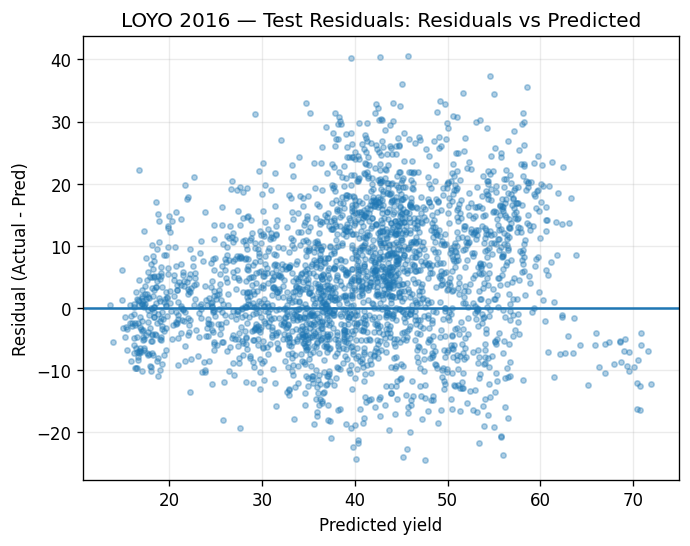

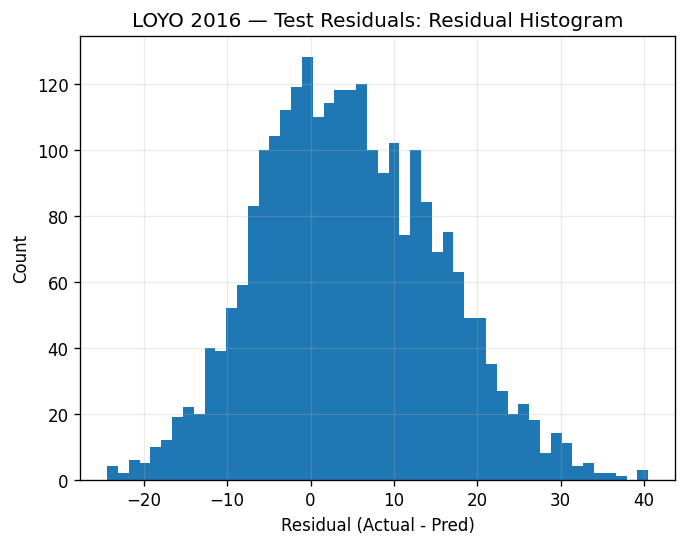

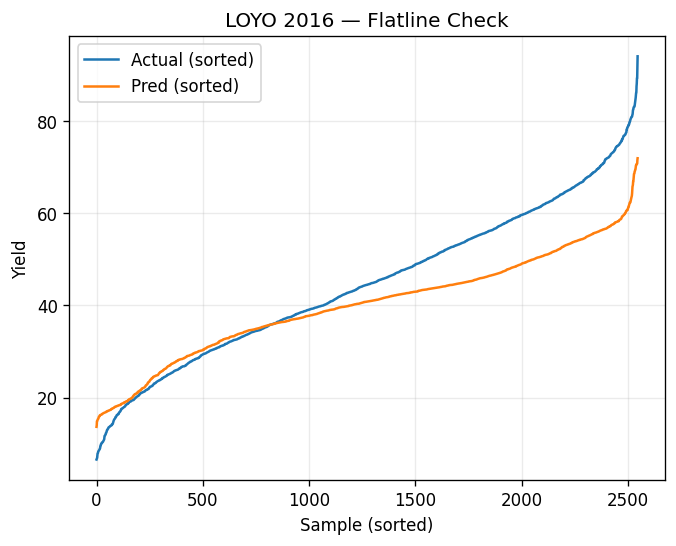

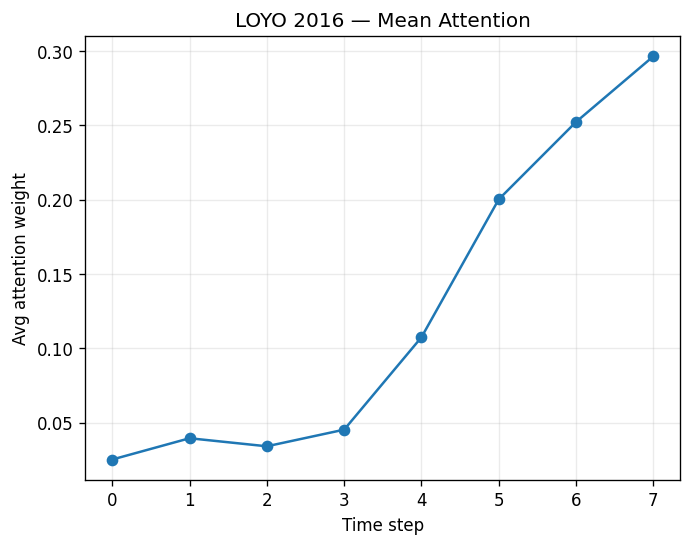

{'test_year': 2016, 'val_years_used': '2014,2024', 'train_rmse': 6.495881, 'train_mae': 4.94703, 'train_r2': 0.8341196226966978, 'train_corr': 0.9188333087501891, 'val_rmse': 13.94994, 'val_mae': 11.113984, 'val_r2': 0.5364699041468929, 'val_corr': 0.7332163028297751, 'test_rmse': 11.653836, 'test_mae': 9.190128, 'test_r2': 0.5243026413263125, 'test_corr': 0.7863734453823316}

================ LOYO TEST YEAR = 2017 ================

Train size: 20687
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 2779


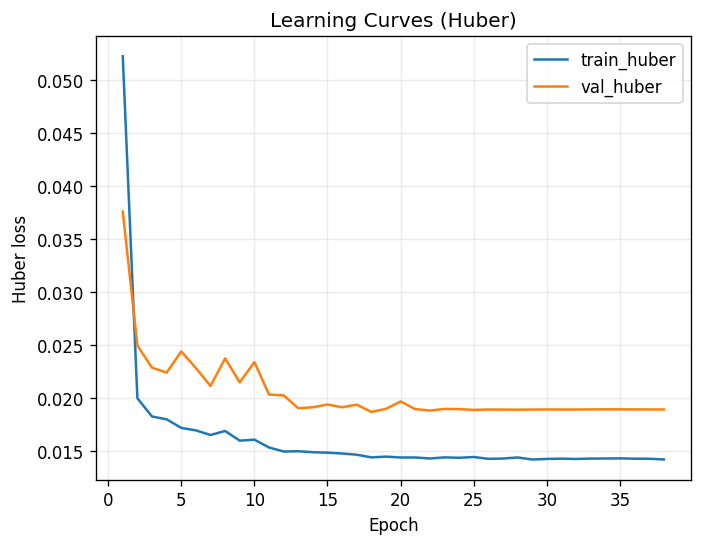

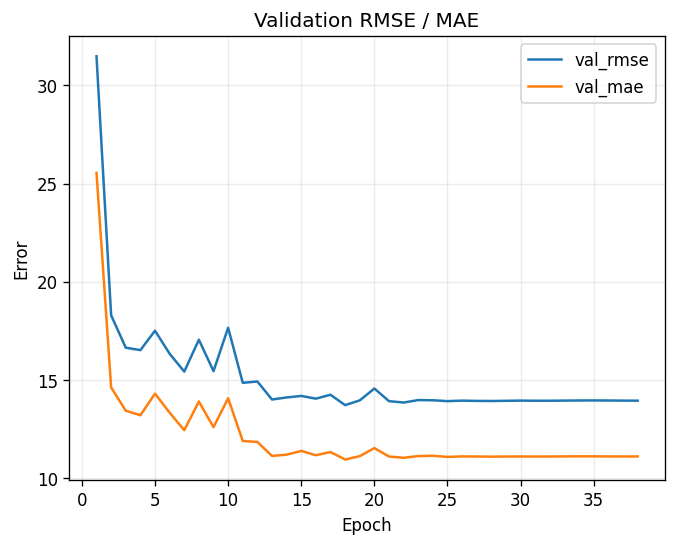

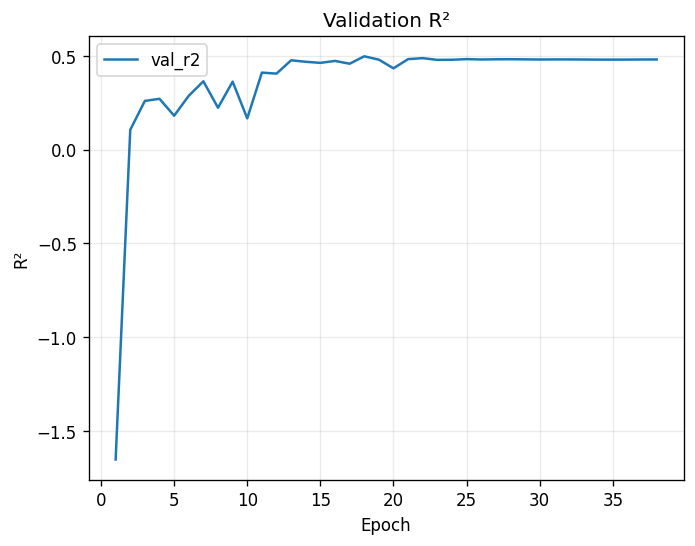

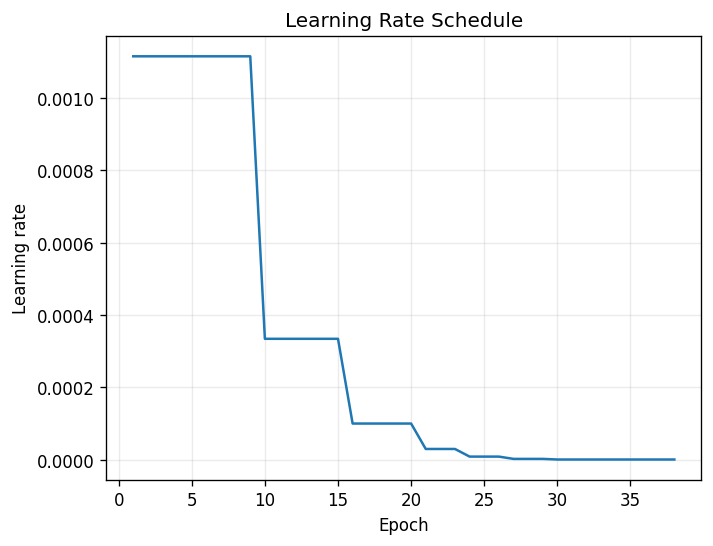

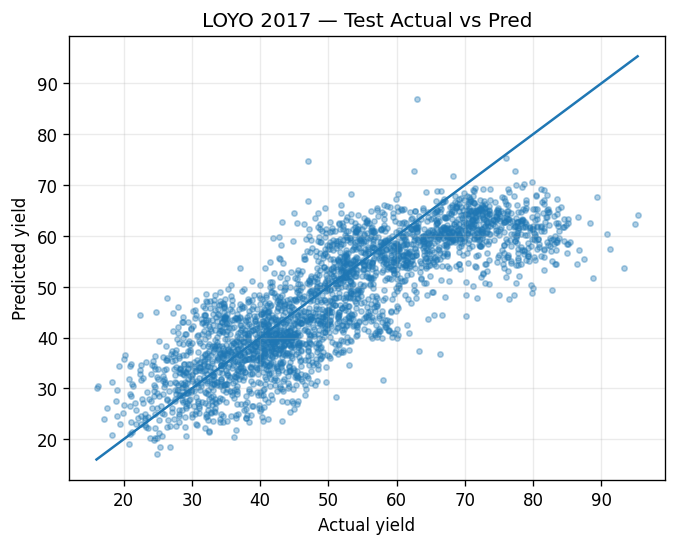

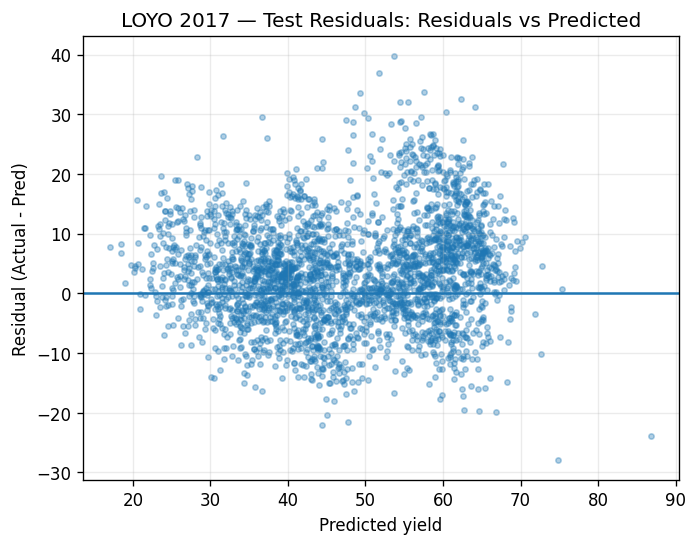

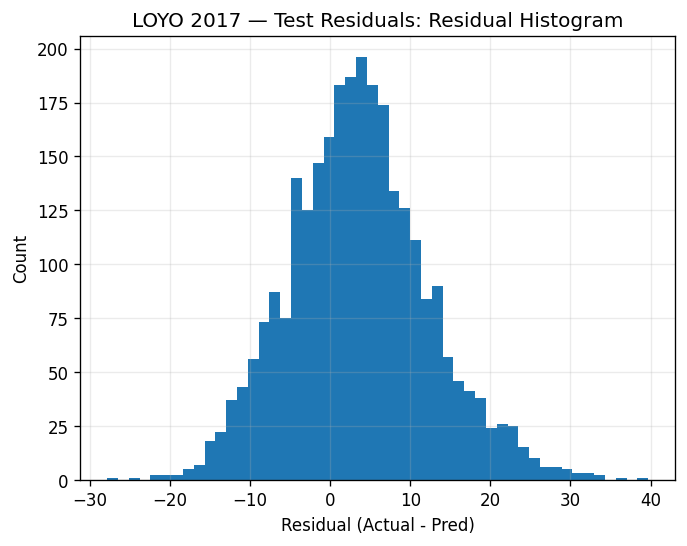

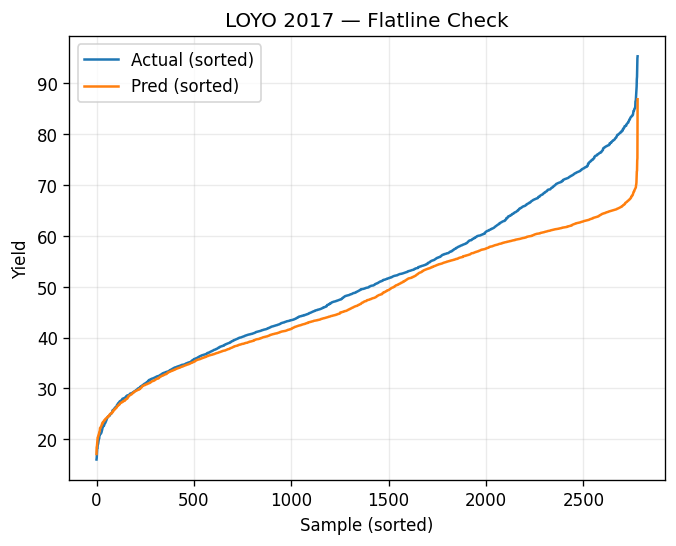

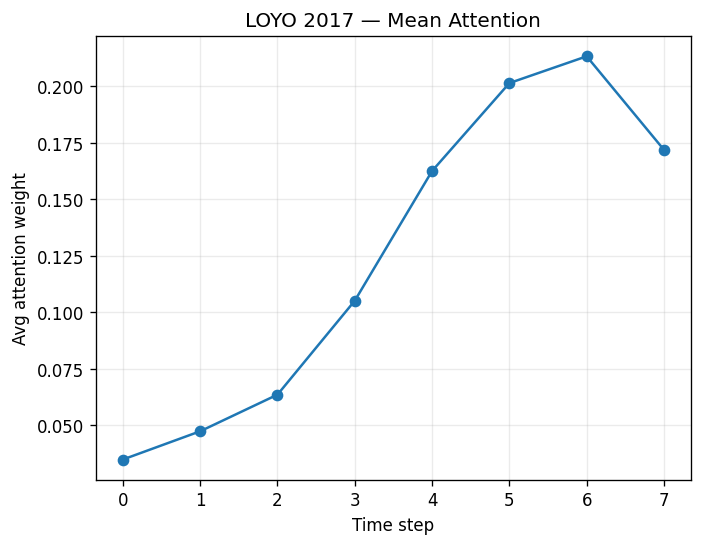

{'test_year': 2017, 'val_years_used': '2014,2016,2024', 'train_rmse': 6.984438, 'train_mae': 5.2975664, 'train_r2': 0.807140584314756, 'train_corr': 0.9003434738740747, 'val_rmse': 13.703593, 'val_mae': 10.932099, 'val_r2': 0.4975570140386689, 'val_corr': 0.7125492695278534, 'test_rmse': 9.463723, 'test_mae': 7.3680105, 'test_r2': 0.6319643432280829, 'test_corr': 0.8299738444069622}

================ LOYO TEST YEAR = 2018 ================

Train size: 20774
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 2692


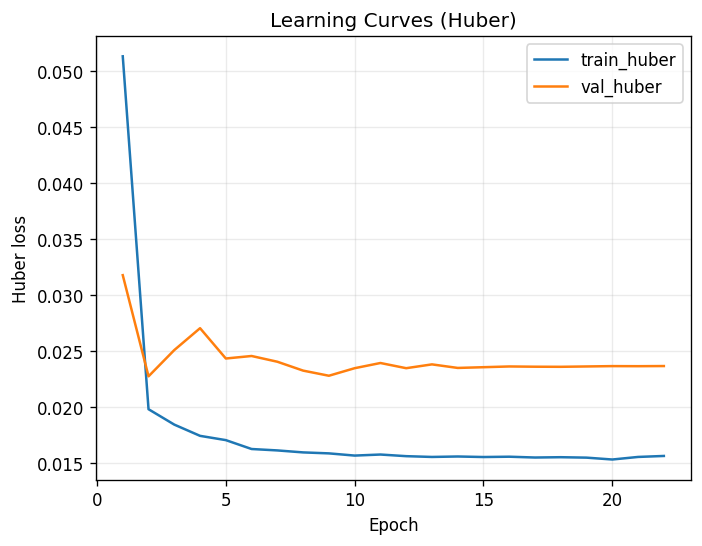

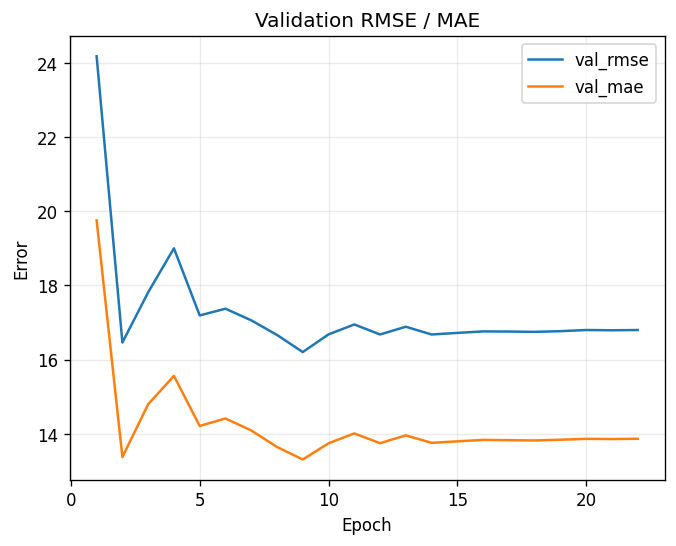

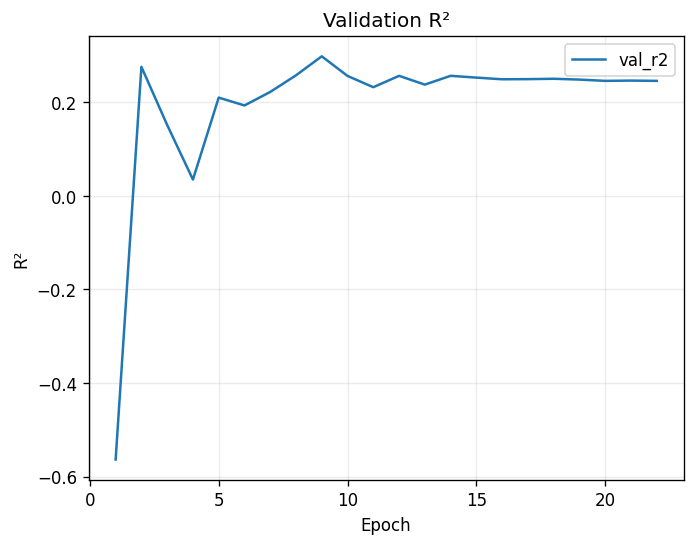

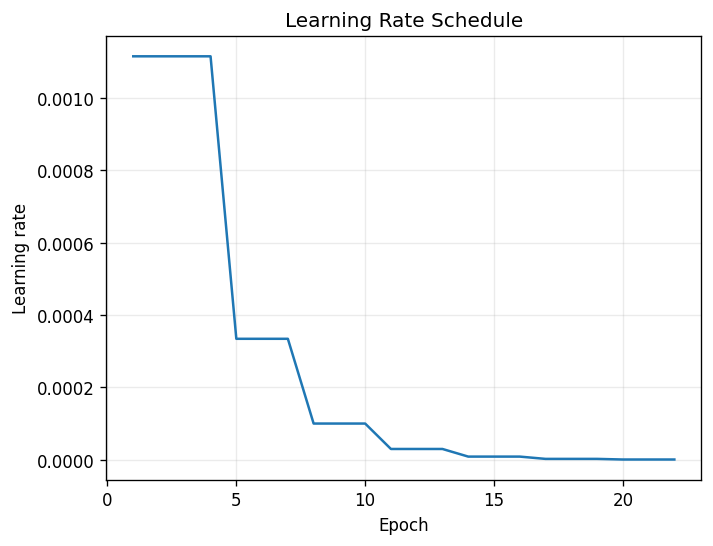

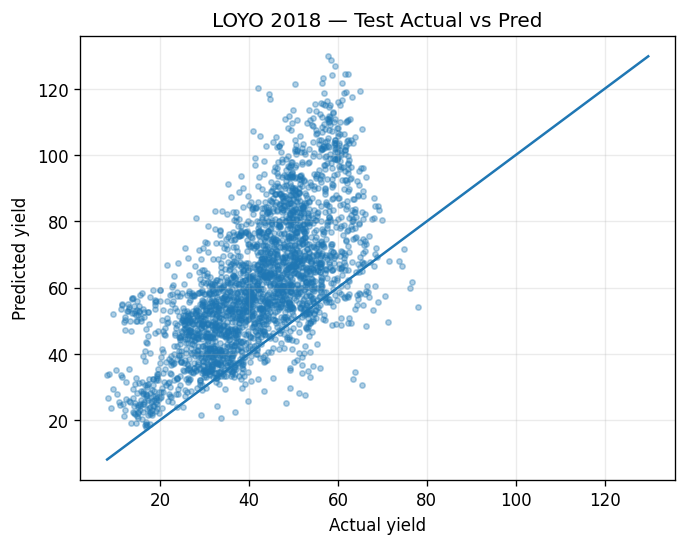

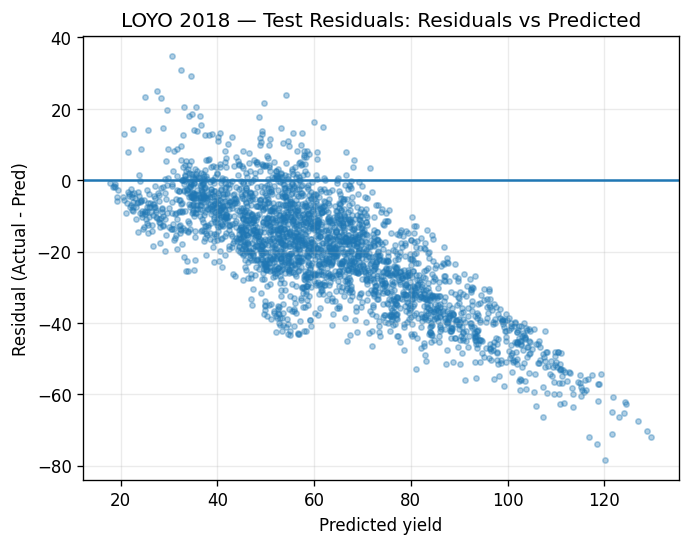

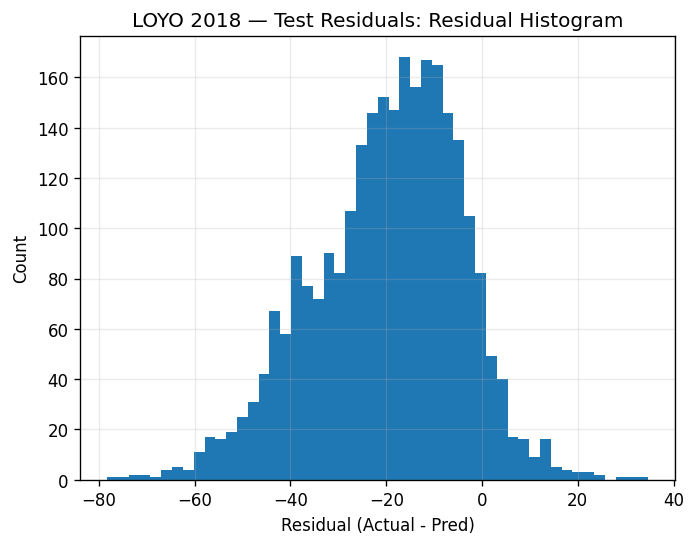

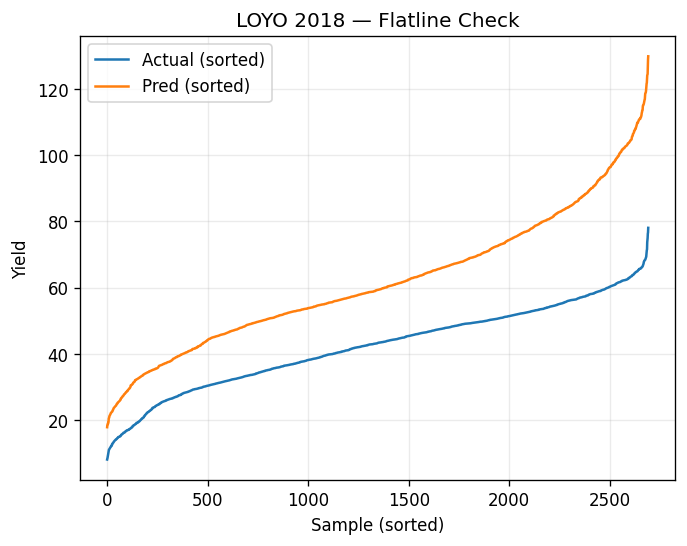

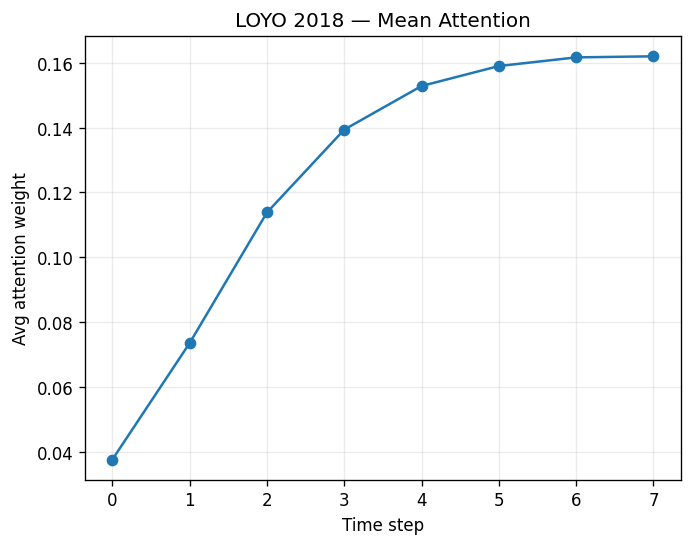

{'test_year': 2018, 'val_years_used': '2014,2016,2024', 'train_rmse': 11.953166, 'train_mae': 9.618162, 'train_r2': 0.4568116836634648, 'train_corr': 0.7885266673679735, 'val_rmse': 16.459372, 'val_mae': 13.373227, 'val_r2': 0.2751563763769065, 'val_corr': 0.5397262854728059, 'test_rmse': 25.148022, 'test_mae': 20.730549, 'test_r2': -2.8585861991251797, 'test_corr': 0.6575432661209584}

================ LOYO TEST YEAR = 2019 ================

Train size: 20046
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 3420


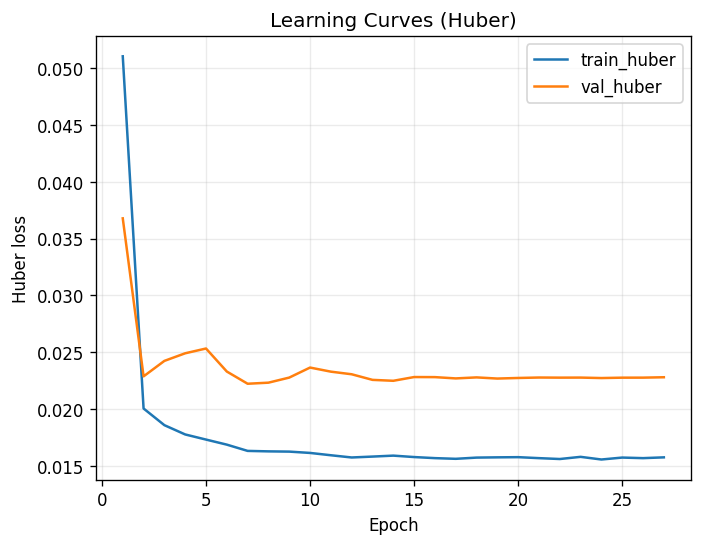

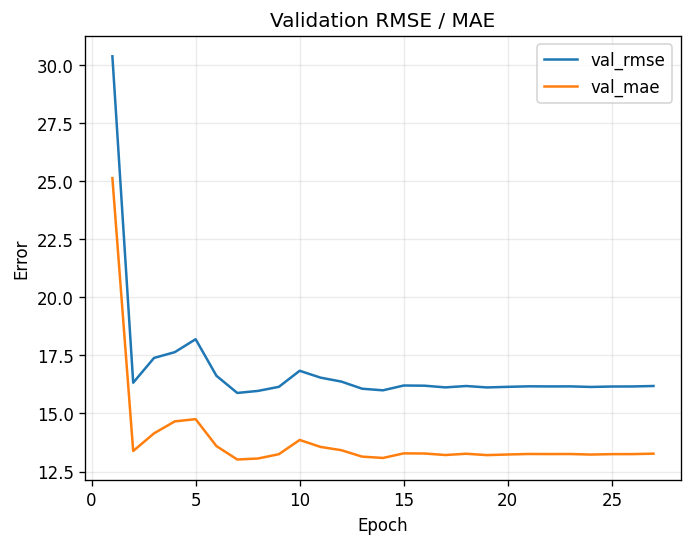

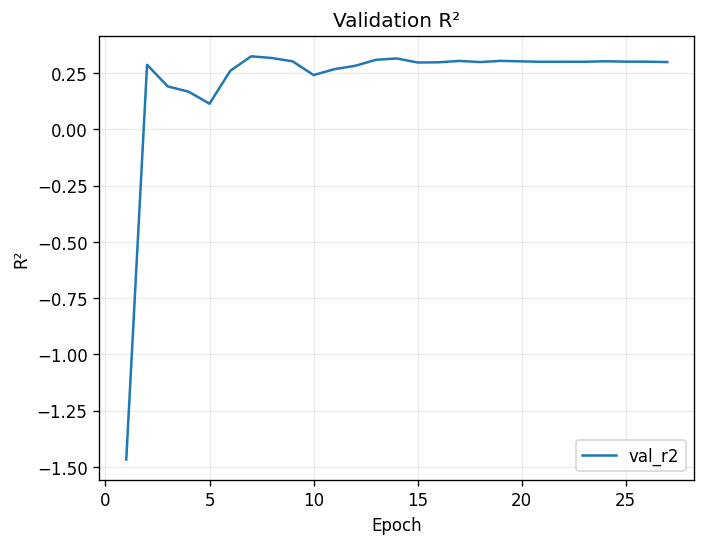

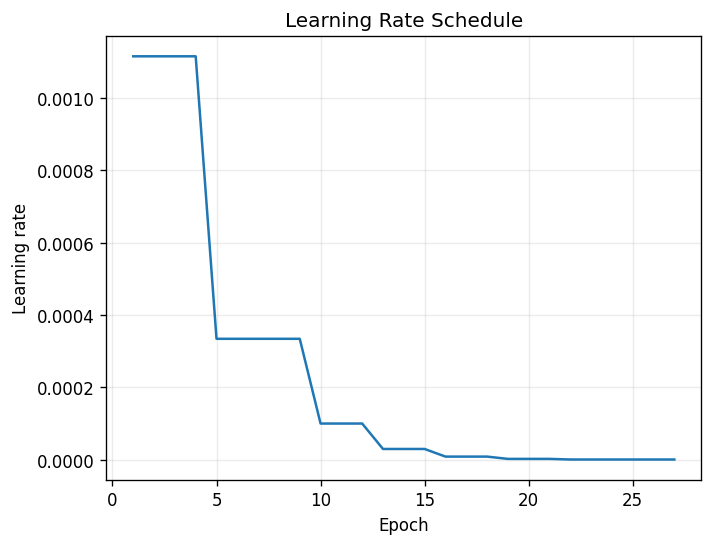

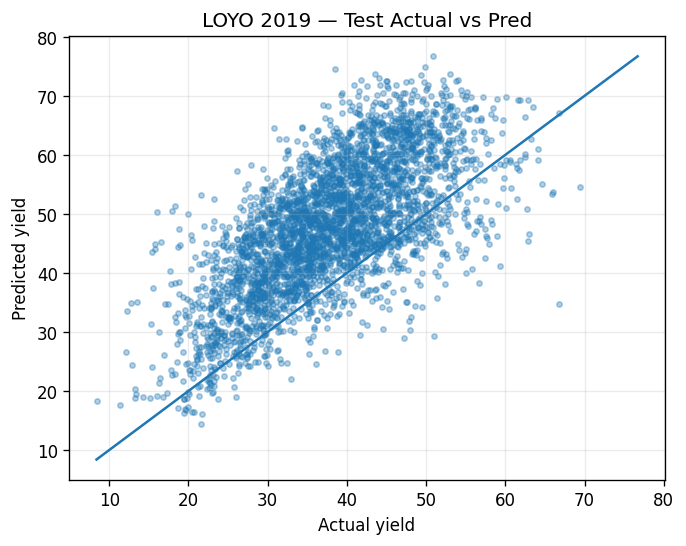

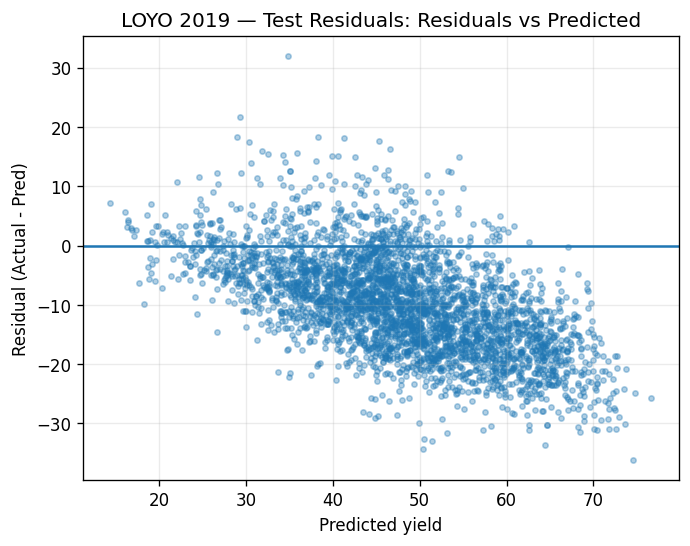

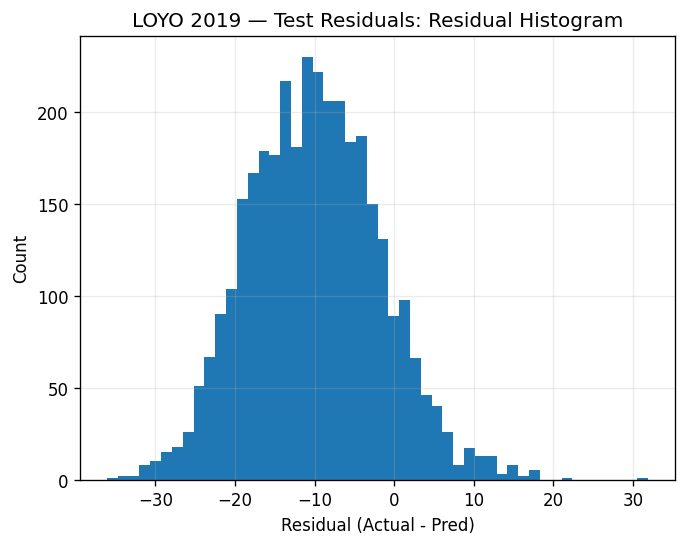

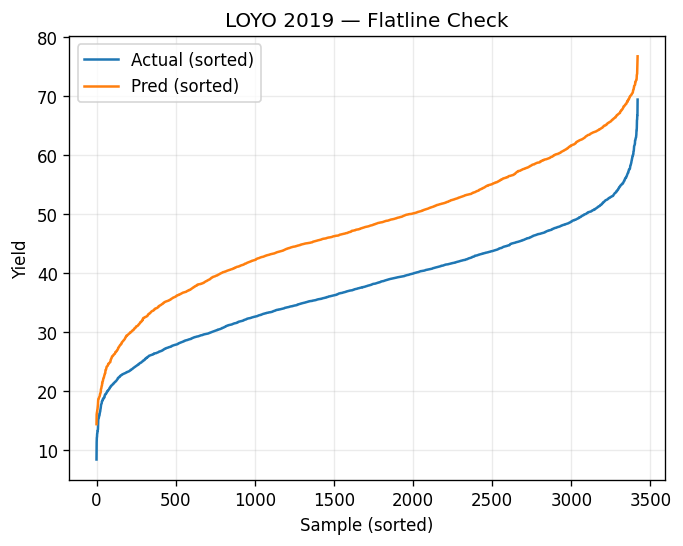

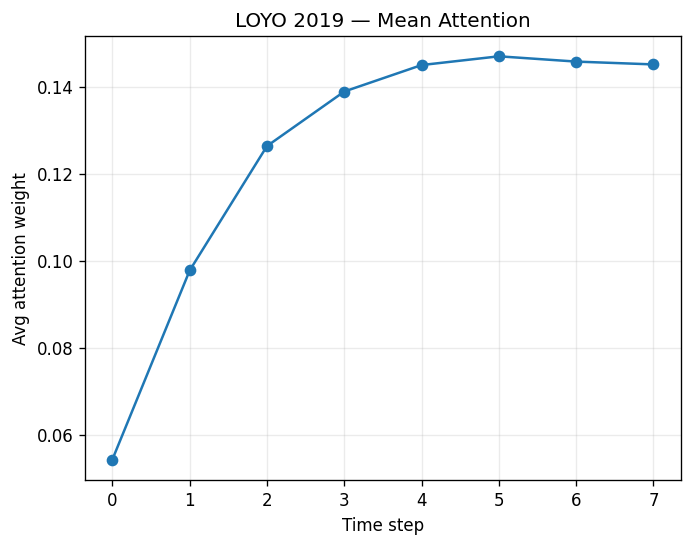

{'test_year': 2019, 'val_years_used': '2014,2016,2024', 'train_rmse': 8.595771, 'train_mae': 6.5808406, 'train_r2': 0.7235859209015783, 'train_corr': 0.8568027845093767, 'val_rmse': 15.881925, 'val_mae': 13.017308, 'val_r2': 0.32512374906922403, 'val_corr': 0.584962620481574, 'test_rmse': 13.006794, 'test_mae': 11.026505, 'test_r2': -0.9921847830952357, 'test_corr': 0.680738568737134}

================ LOYO TEST YEAR = 2020 ================

Train size: 19881
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 3585


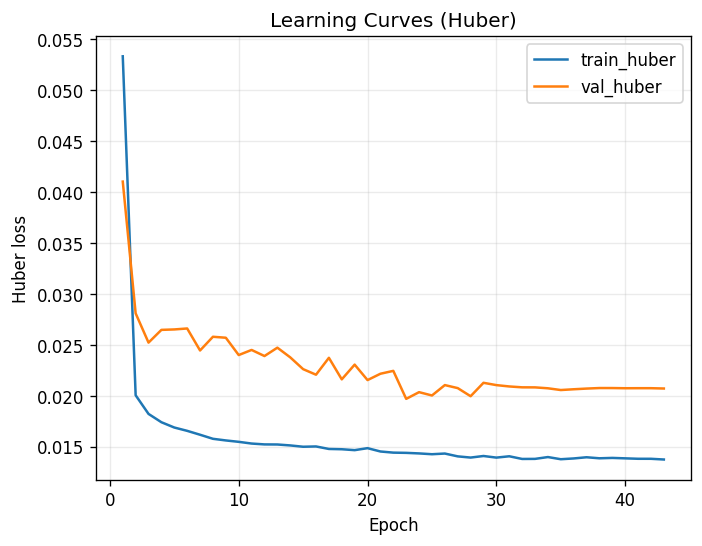

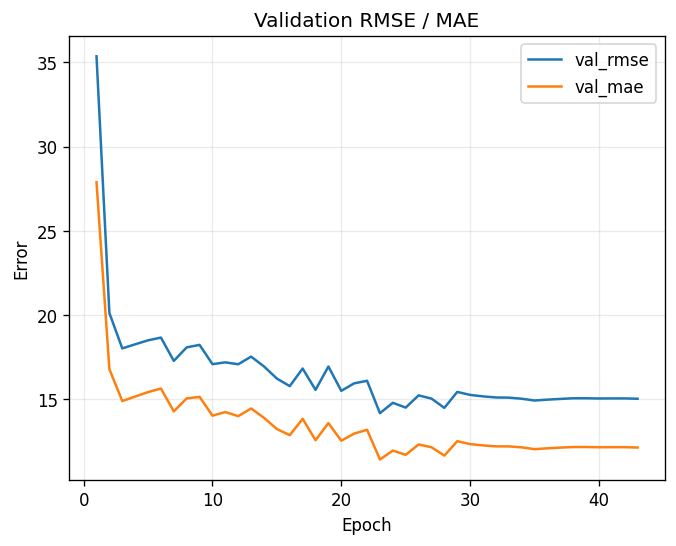

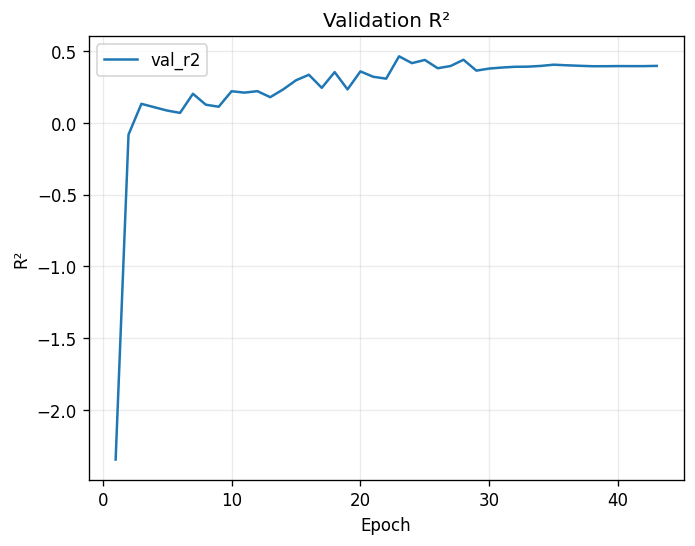

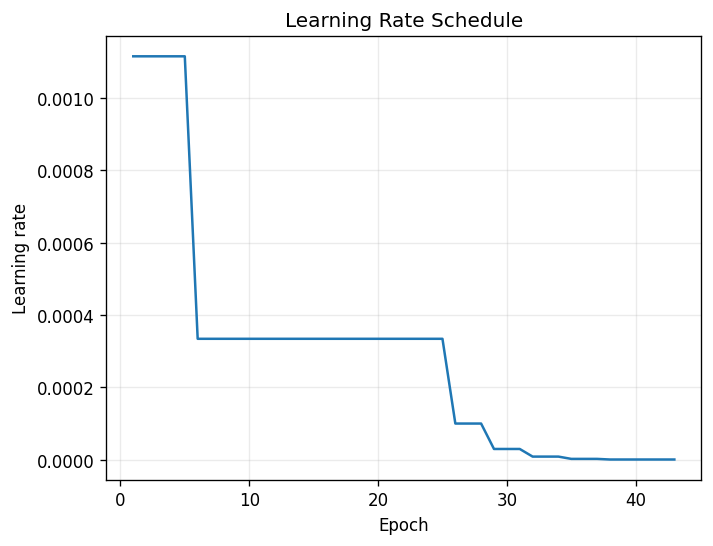

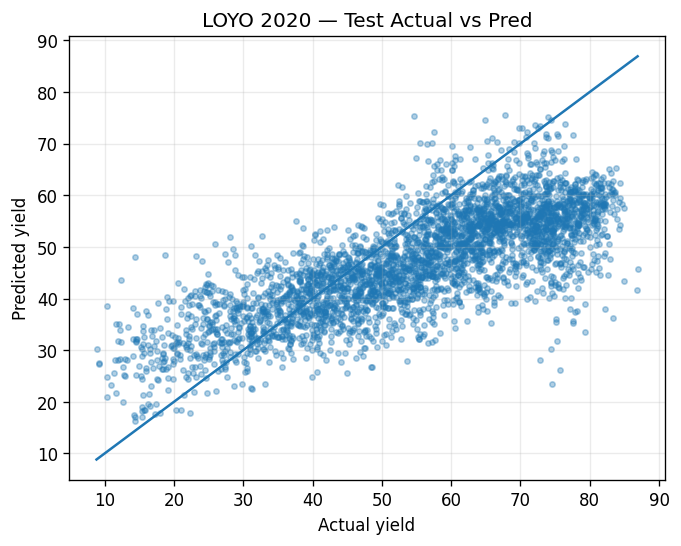

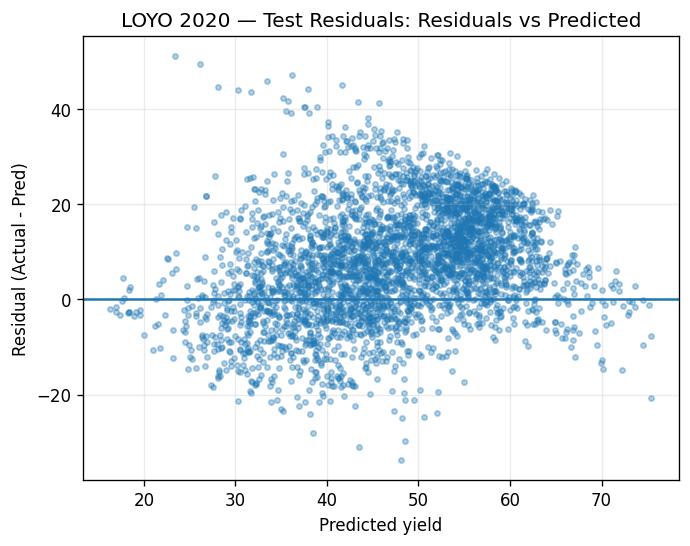

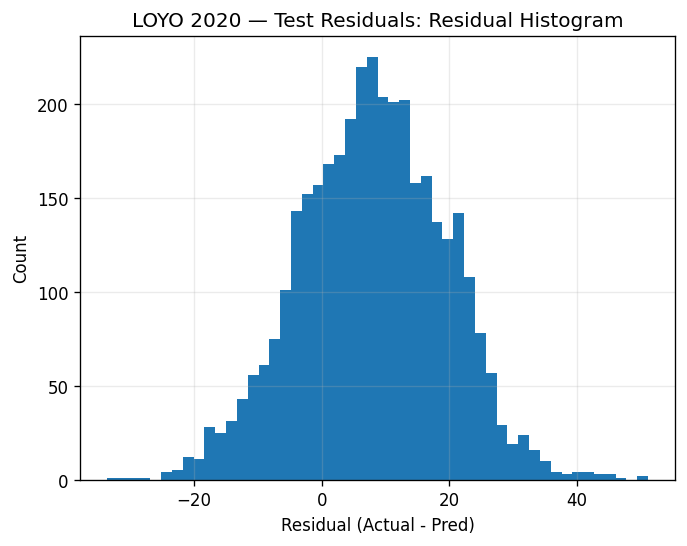

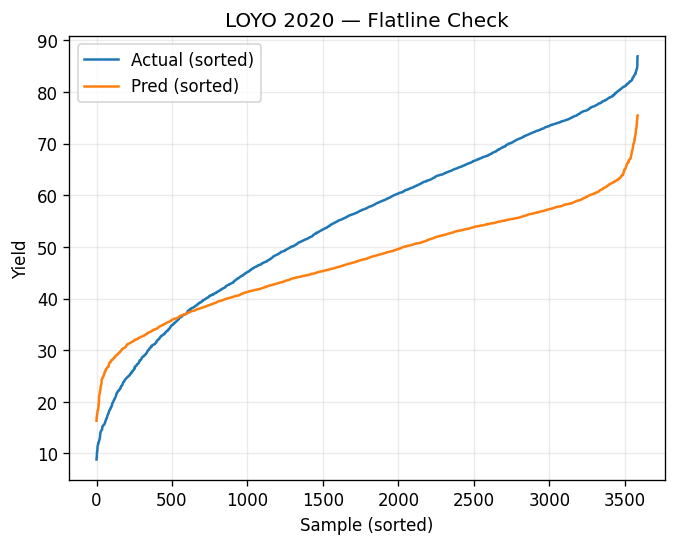

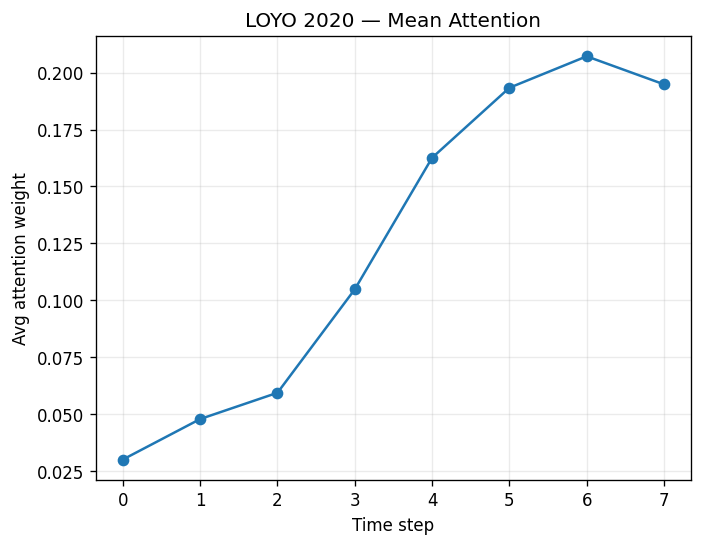

{'test_year': 2020, 'val_years_used': '2014,2016,2024', 'train_rmse': 6.7371674, 'train_mae': 5.159885, 'train_r2': 0.8044499350378401, 'train_corr': 0.8996915900217151, 'val_rmse': 14.165777, 'val_mae': 11.413023, 'val_r2': 0.4630934298451702, 'val_corr': 0.6919868702842323, 'test_rmse': 13.914752, 'test_mae': 11.285458, 'test_r2': 0.3387973441065234, 'test_corr': 0.767227249467075}

================ LOYO TEST YEAR = 2021 ================

Train size: 20793
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 2673


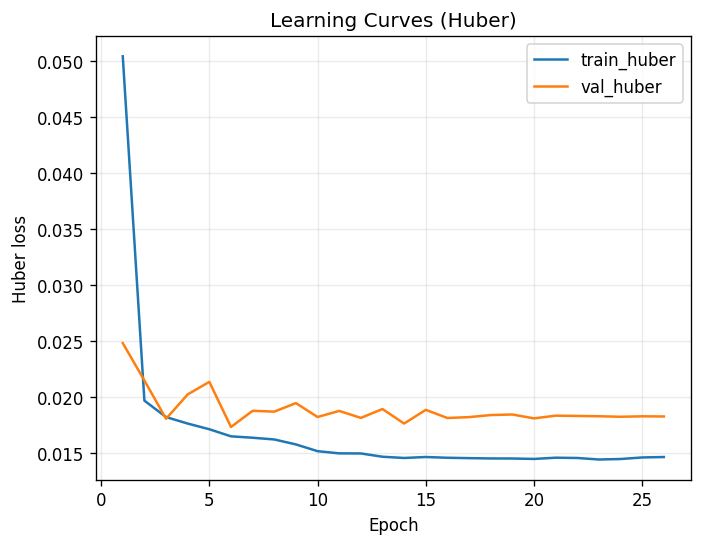

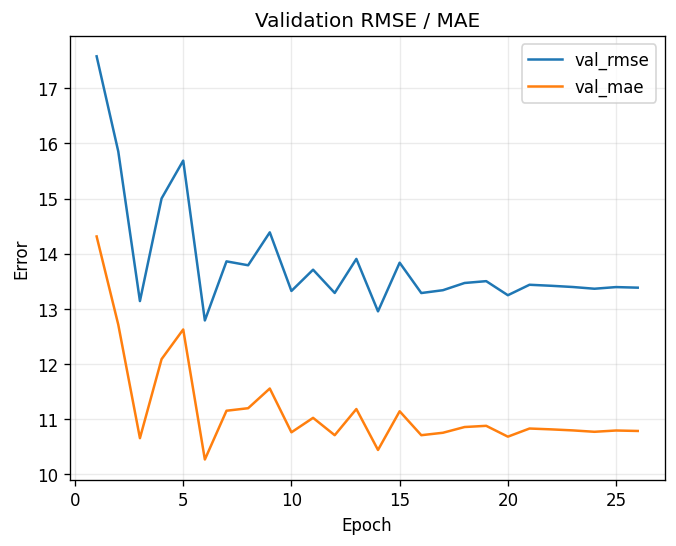

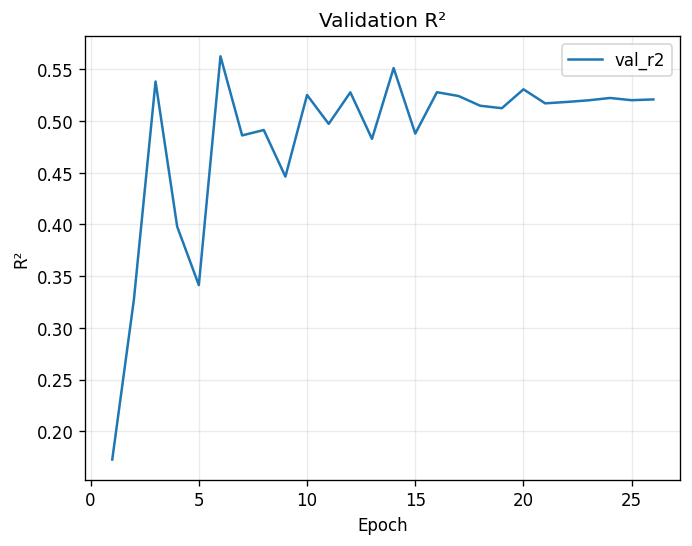

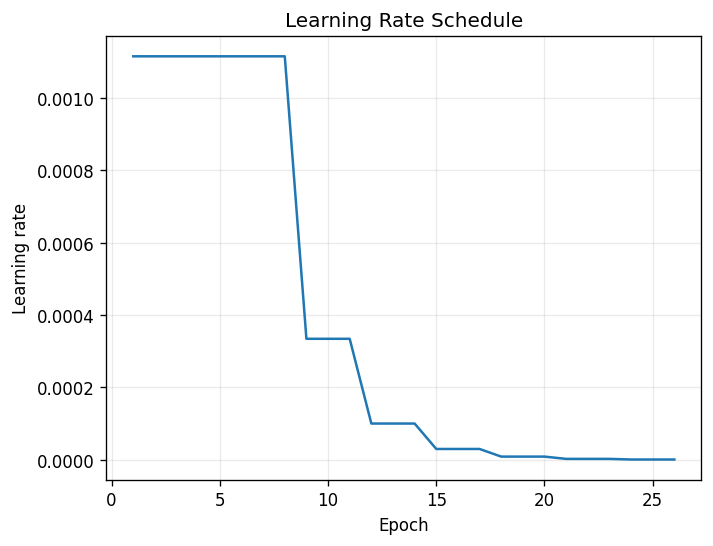

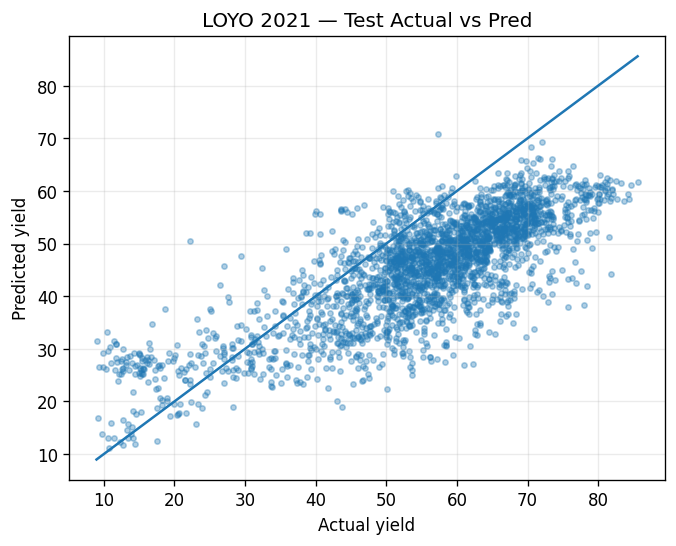

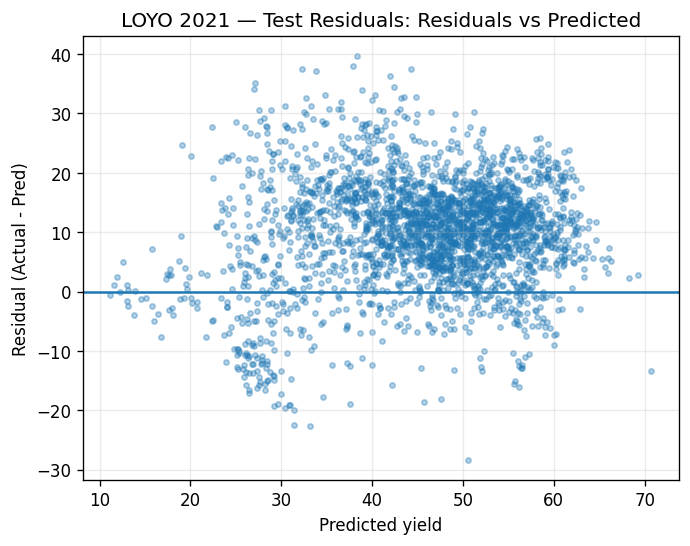

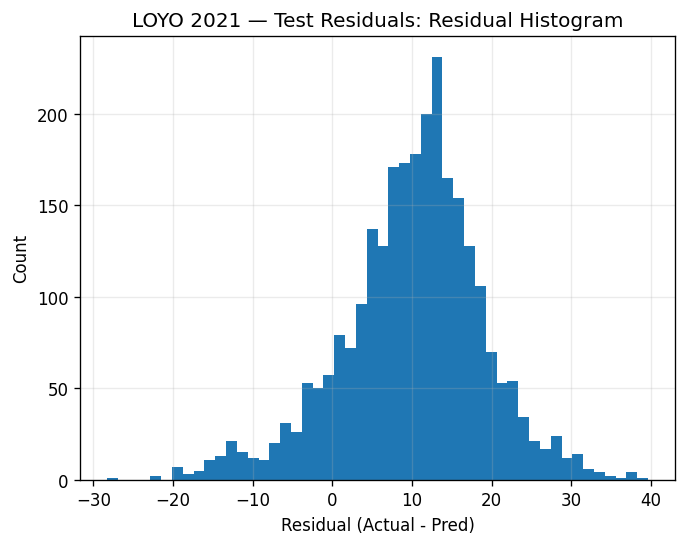

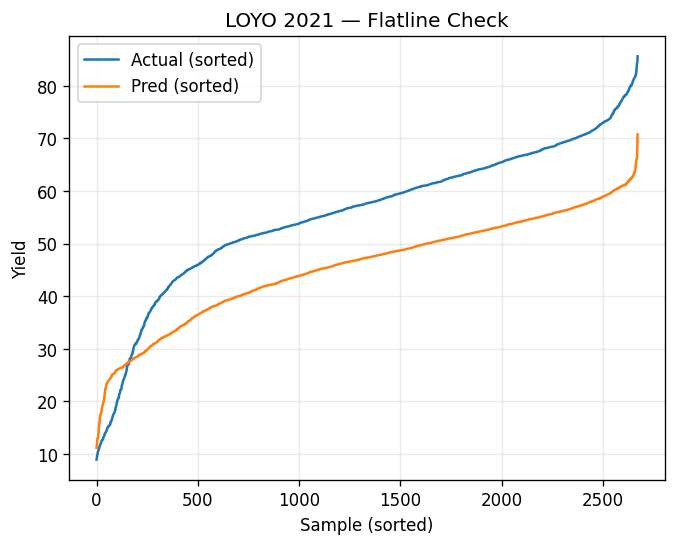

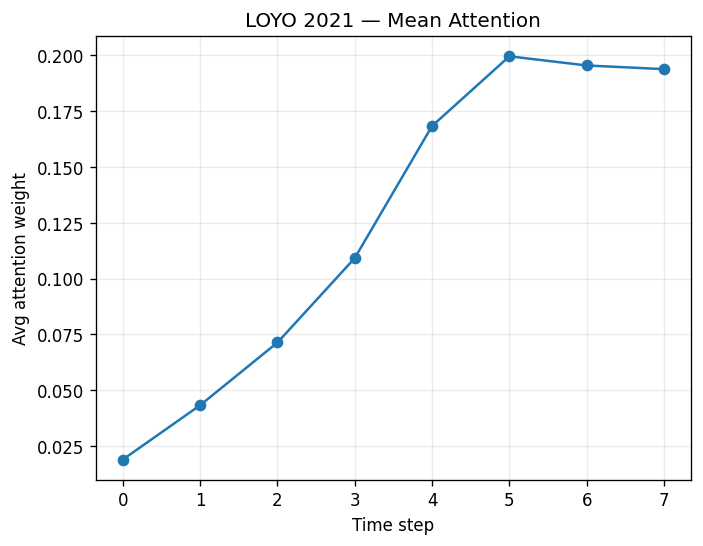

{'test_year': 2021, 'val_years_used': '2014,2016,2024', 'train_rmse': 8.598171, 'train_mae': 6.696113, 'train_r2': 0.7038366940141227, 'train_corr': 0.8542128762490285, 'val_rmse': 12.785848, 'val_mae': 10.260094, 'val_r2': 0.5626019039182457, 'val_corr': 0.7596963457300736, 'test_rmse': 13.406164, 'test_mae': 11.564461, 'test_r2': 0.11156028568813059, 'test_corr': 0.7821605301773414}

================ LOYO TEST YEAR = 2022 ================

Train size: 20489
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 2977


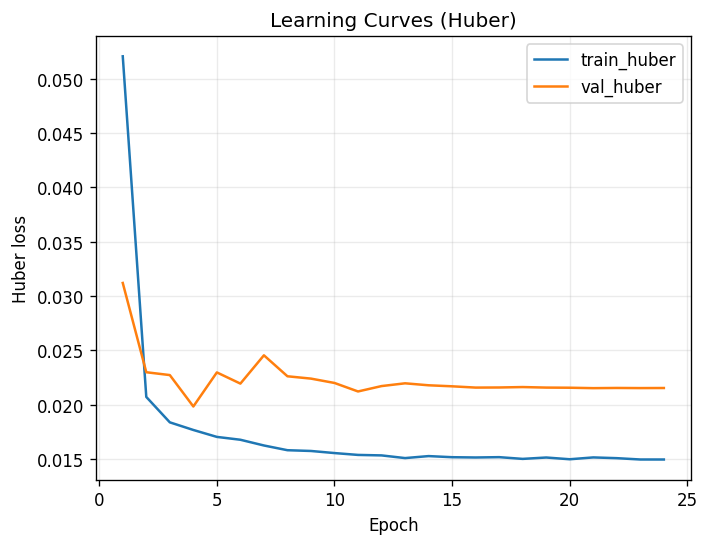

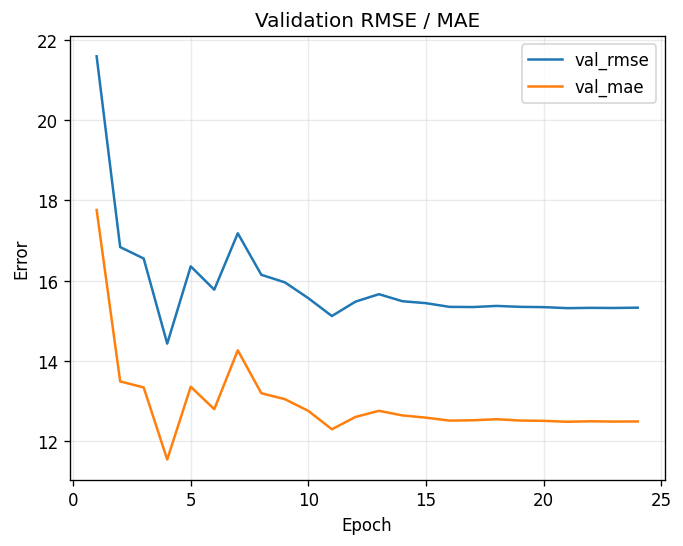

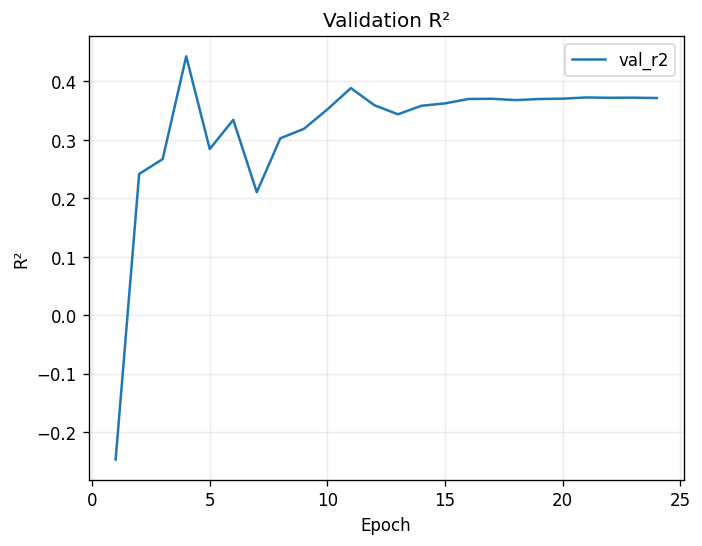

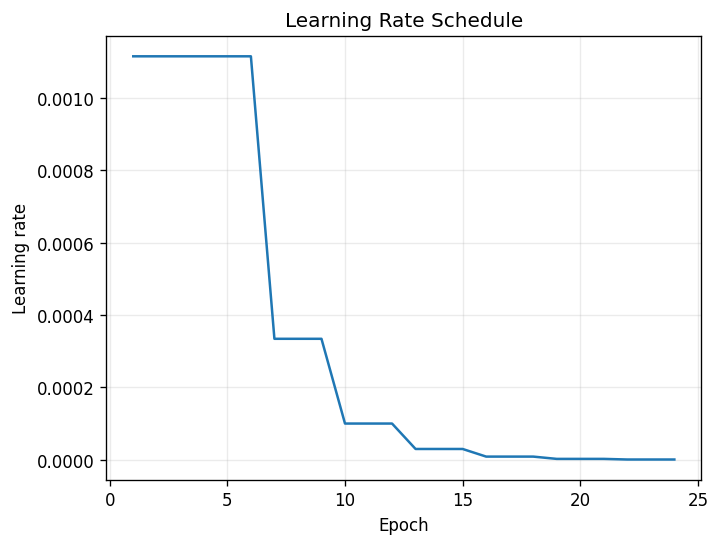

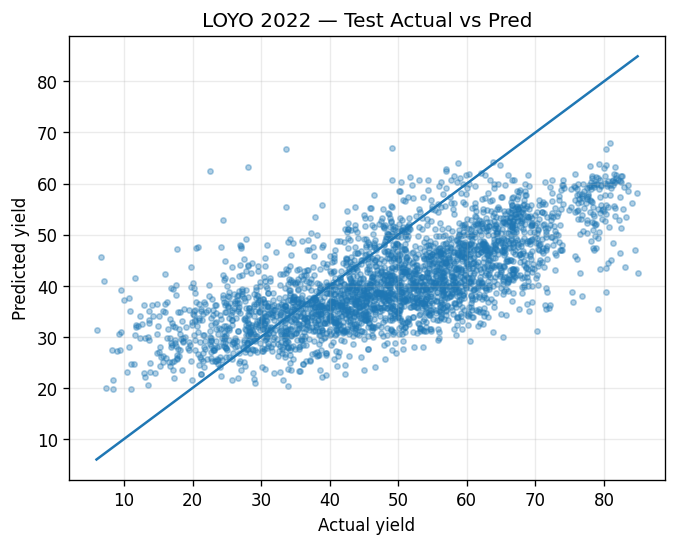

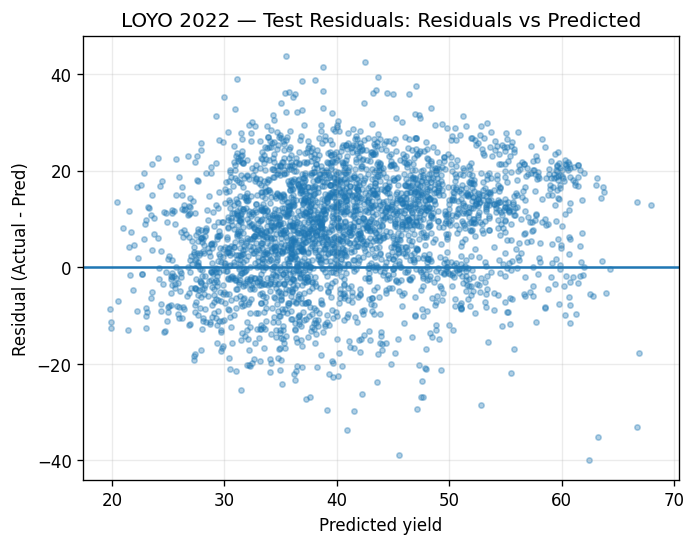

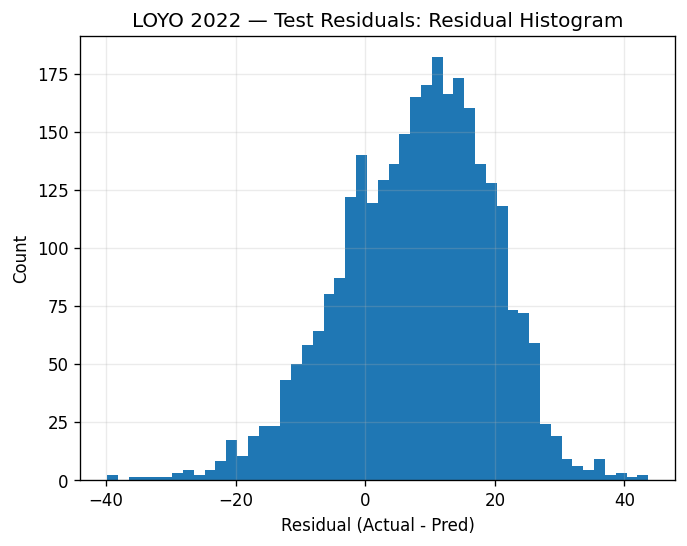

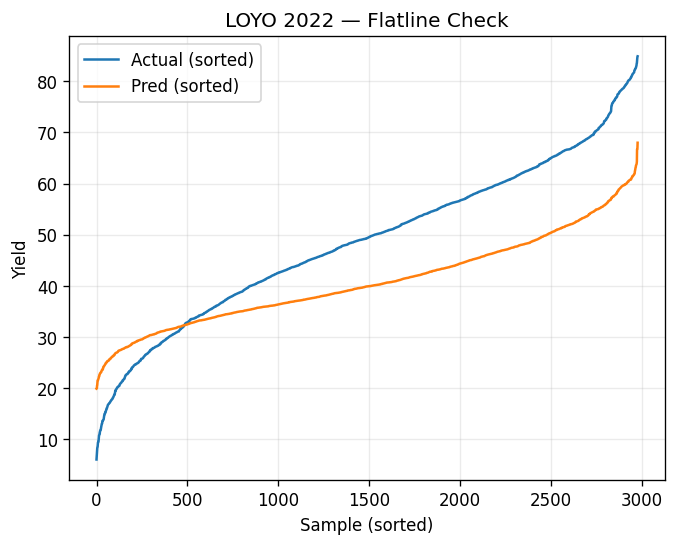

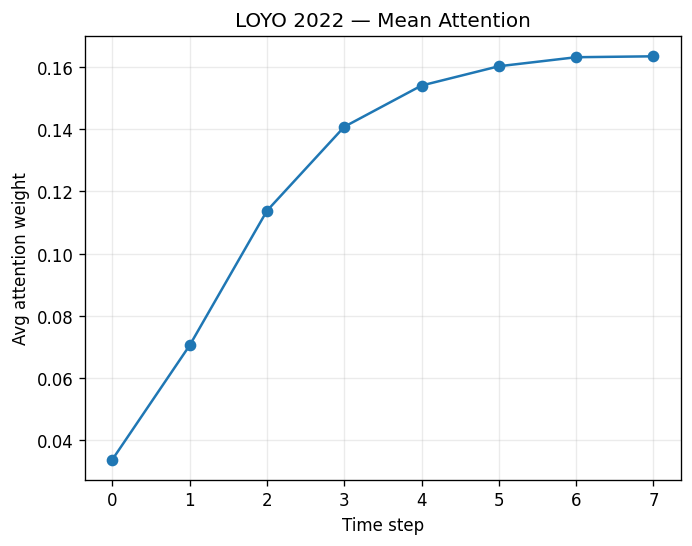

{'test_year': 2022, 'val_years_used': '2014,2016,2024', 'train_rmse': 8.714184, 'train_mae': 6.6384506, 'train_r2': 0.7019052983656623, 'train_corr': 0.8379625488017169, 'val_rmse': 14.431672, 'val_mae': 11.54647, 'val_r2': 0.44274855328531815, 'val_corr': 0.6710195189596007, 'test_rmse': 13.9606495, 'test_mae': 11.57795, 'test_r2': 0.2121432671701411, 'test_corr': 0.6957820671008395}

================ LOYO TEST YEAR = 2023 ================

Train size: 21188
Val years: [2014, 2016, 2024]  Val size: 6669
Test size: 2278


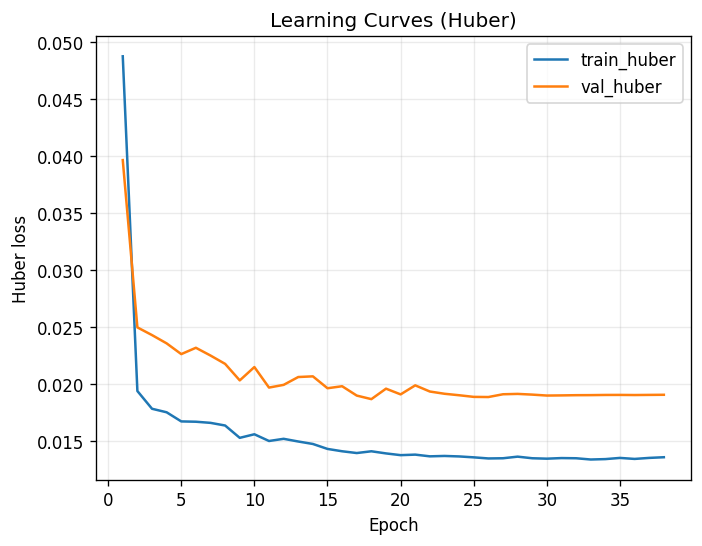

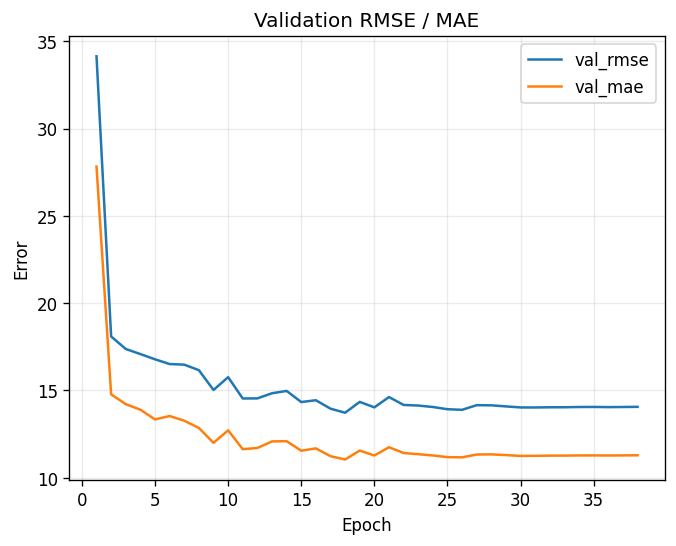

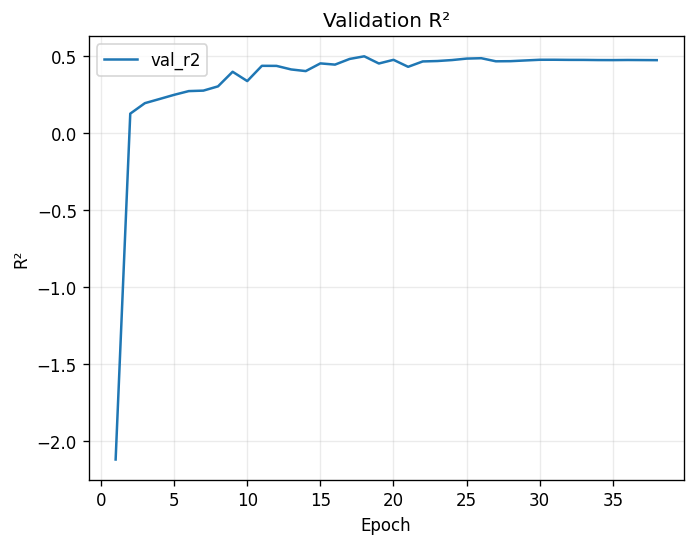

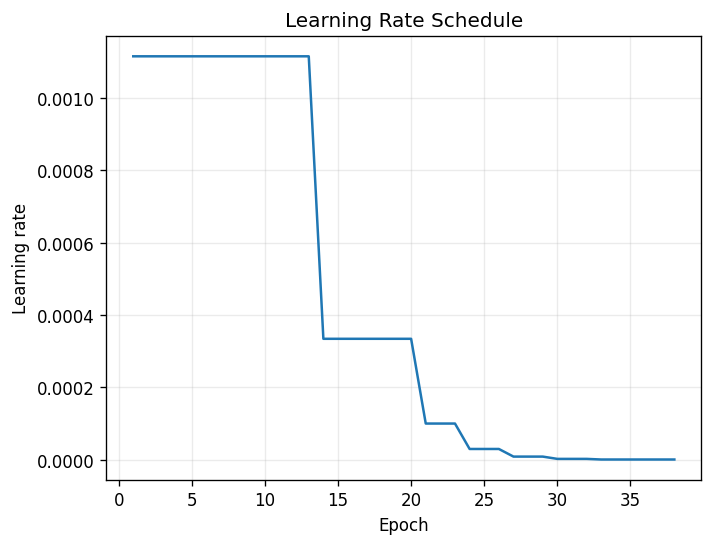

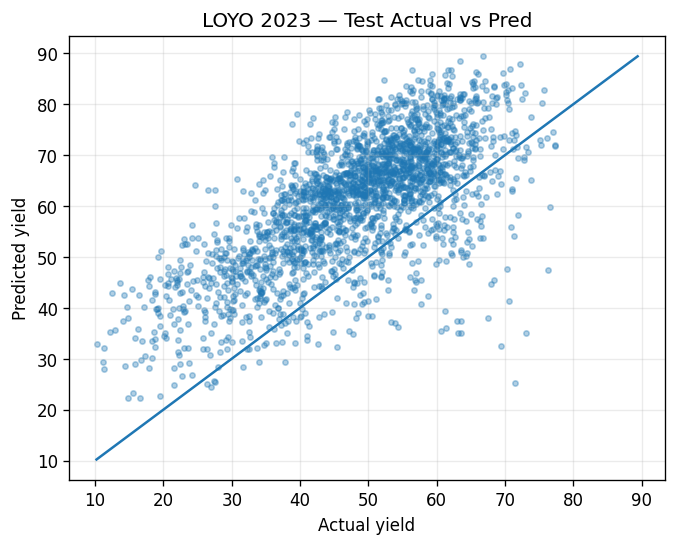

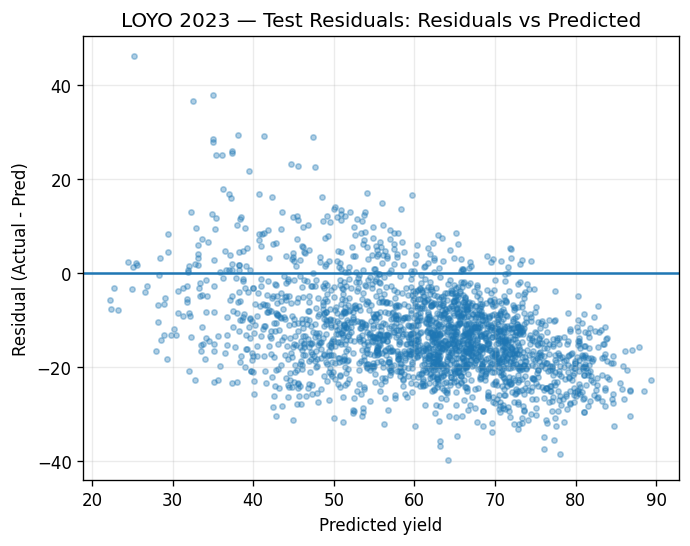

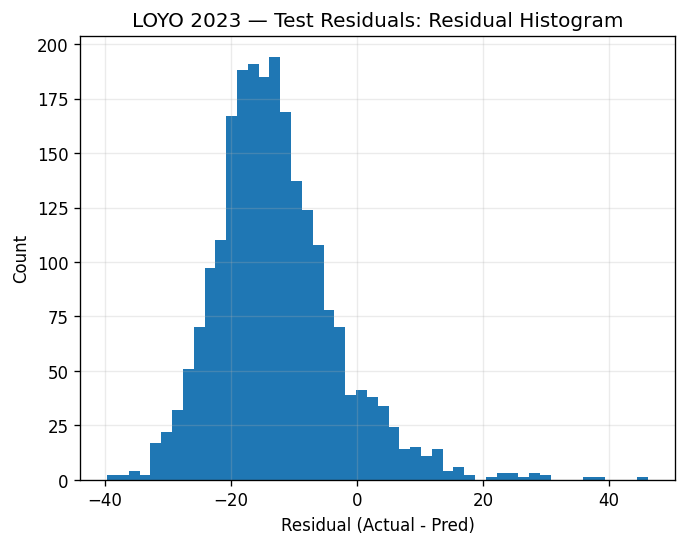

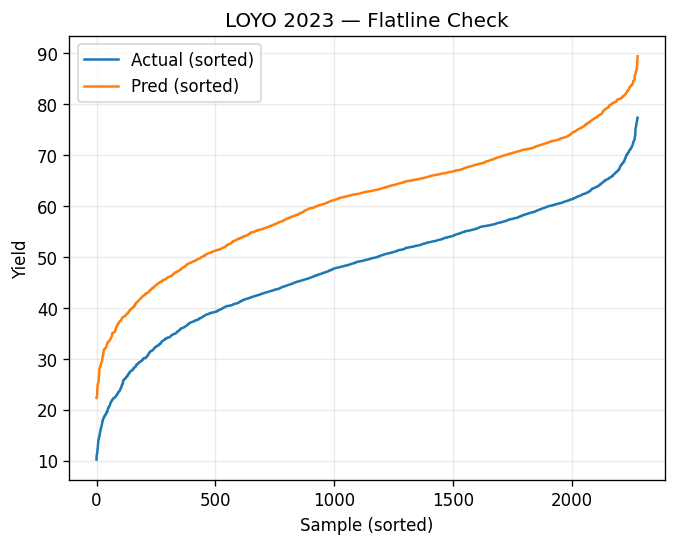

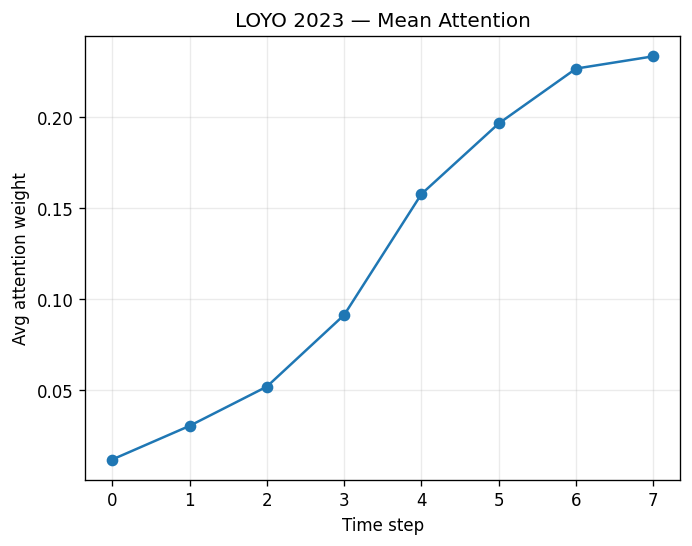

{'test_year': 2023, 'val_years_used': '2014,2016,2024', 'train_rmse': 6.7809663, 'train_mae': 5.104297, 'train_r2': 0.8269741209612453, 'train_corr': 0.912269779938019, 'val_rmse': 13.722766, 'val_mae': 11.042534, 'val_r2': 0.4961500679626919, 'val_corr': 0.7060999844003597, 'test_rmse': 16.003366, 'test_mae': 14.201436, 'test_r2': -0.7467638158155732, 'test_corr': 0.6912668019848014}

================ LOYO TEST YEAR = 2024 ================

Train size: 23466
Val years: [2014, 2016]  Val size: 4000
Test size: 2669


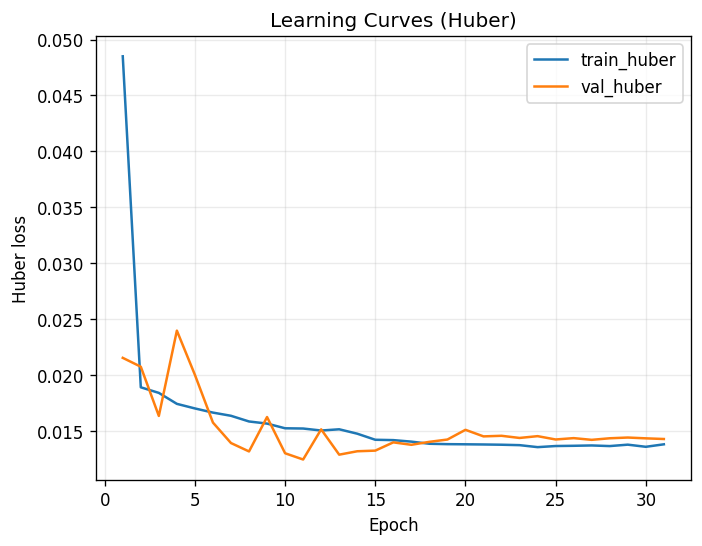

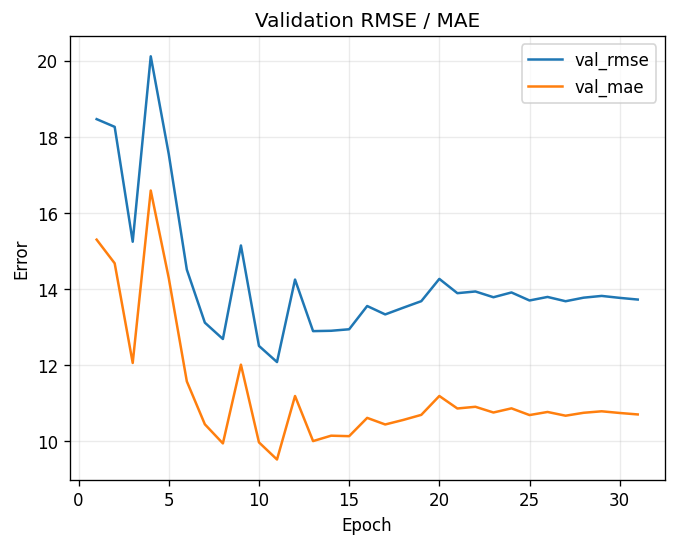

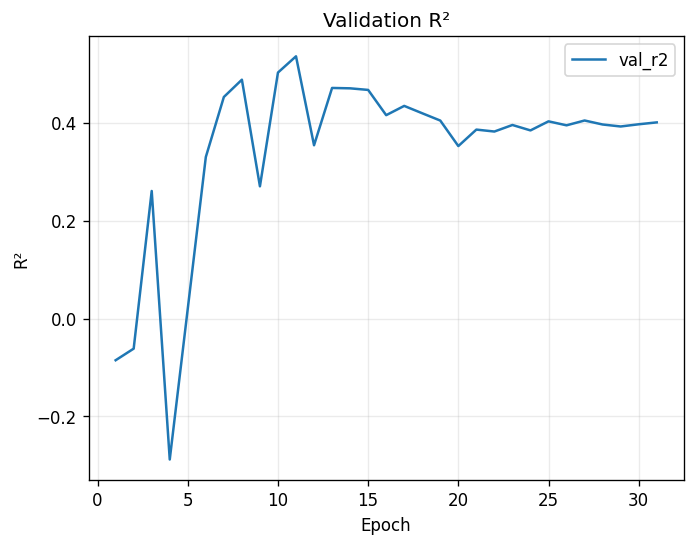

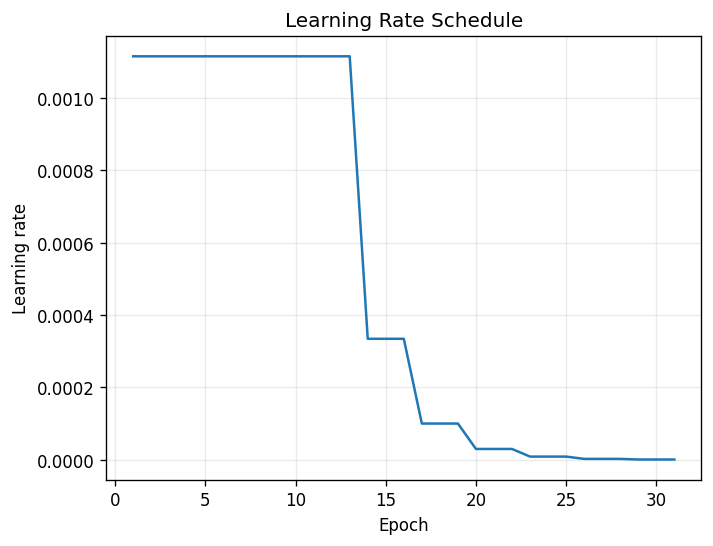

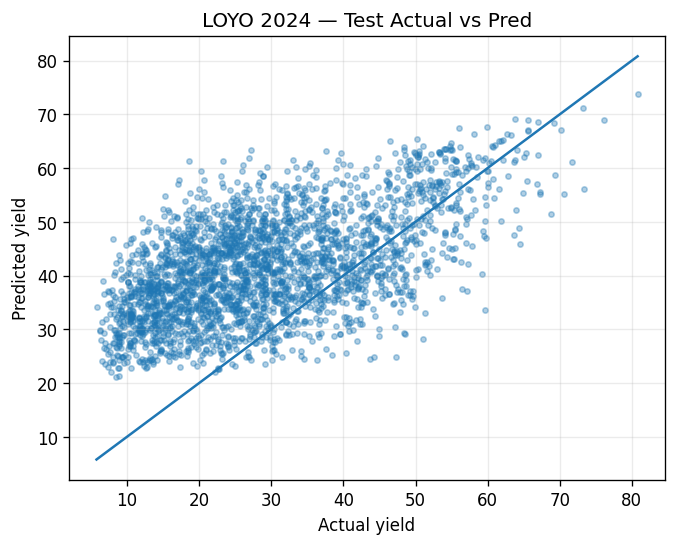

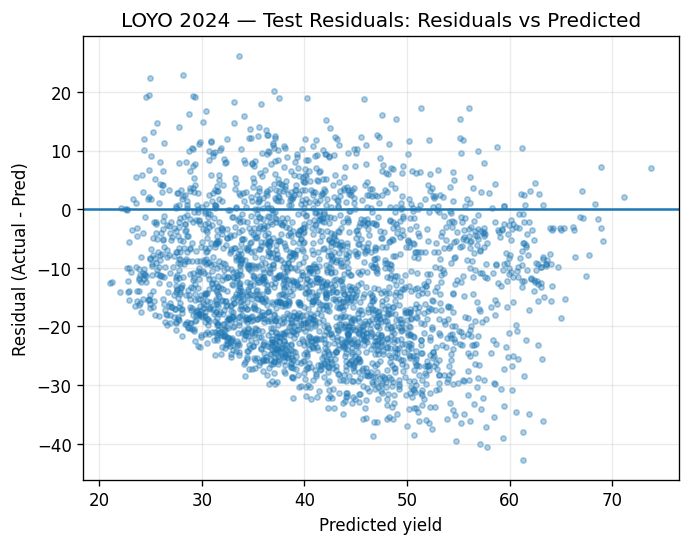

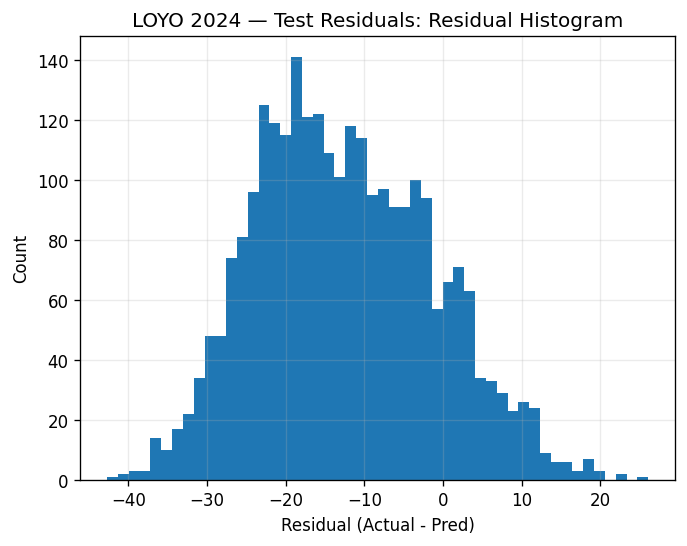

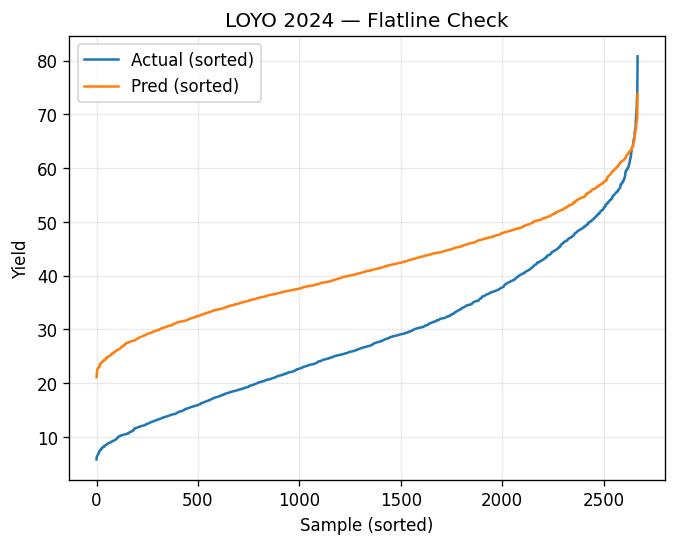

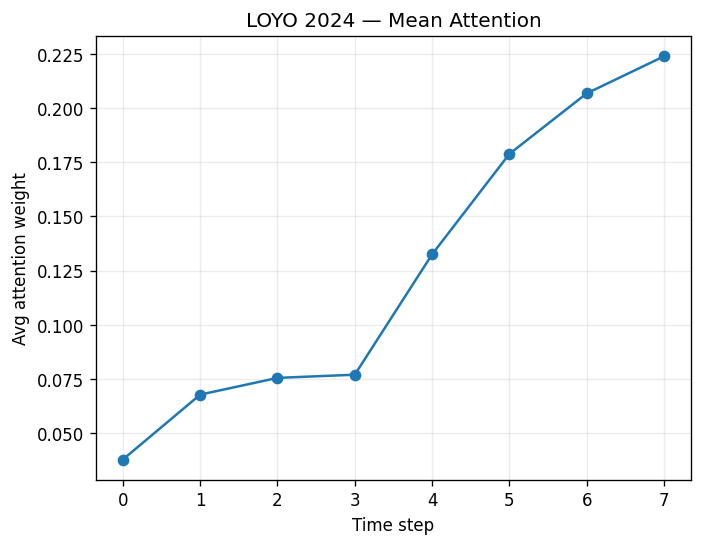

{'test_year': 2024, 'val_years_used': '2014,2016', 'train_rmse': 7.315659, 'train_mae': 5.6225643, 'train_r2': 0.7896096682735672, 'train_corr': 0.893555395037568, 'val_rmse': 12.084177, 'val_mae': 9.52494, 'val_r2': 0.5351752345721896, 'val_corr': 0.7426424958392613, 'test_rmse': 16.806774, 'test_mae': 14.234388, 'test_r2': -0.5269120106127523, 'test_corr': 0.5765499571909467}


In [44]:
loyo_results = run_loyo_all_years(best_cfg_fine, out_dir="loyo_runs_2014_2024", years=ALL_YEARS, base_val_years=BASE_VAL_YEARS, seed=42)


In [ ]:
display(loyo_results)

NameError: name 'loyo_results' is not defined